# Credit Card Users Churn Prediction

## Problem Statement

### Business Context

The Thera bank recently saw a steep decline in the number of users of their credit card, credit cards are a good source of income for banks because of different kinds of fees charged by the banks like annual fees, balance transfer fees, and cash advance fees, late payment fees, foreign transaction fees, and others. Some fees are charged to every user irrespective of usage, while others are charged under specified circumstances.

Customers’ leaving credit cards services would lead bank to loss, so the bank wants to analyze the data of customers and identify the customers who will leave their credit card services and reason for same – so that bank could improve upon those areas

You as a Data scientist at Thera bank need to come up with a classification model that will help the bank improve its services so that customers do not renounce their credit cards

### Data Description

* CLIENTNUM: Client number. Unique identifier for the customer holding the account
* Attrition_Flag: Internal event (customer activity) variable - if the account is closed then "Attrited Customer" else "Existing Customer"
* Customer_Age: Age in Years
* Gender: Gender of the account holder
* Dependent_count: Number of dependents
* Education_Level: Educational Qualification of the account holder - Graduate, High School, Unknown, Uneducated, College(refers to college student), Post-Graduate, Doctorate
* Marital_Status: Marital Status of the account holder
* Income_Category: Annual Income Category of the account holder
* Card_Category: Type of Card
* Months_on_book: Period of relationship with the bank (in months)
* Total_Relationship_Count: Total no. of products held by the customer
* Months_Inactive_12_mon: No. of months inactive in the last 12 months
* Contacts_Count_12_mon: No. of Contacts in the last 12 months
* Credit_Limit: Credit Limit on the Credit Card
* Total_Revolving_Bal: Total Revolving Balance on the Credit Card
* Avg_Open_To_Buy: Open to Buy Credit Line (Average of last 12 months)
* Total_Amt_Chng_Q4_Q1: Change in Transaction Amount (Q4 over Q1)
* Total_Trans_Amt: Total Transaction Amount (Last 12 months)
* Total_Trans_Ct: Total Transaction Count (Last 12 months)
* Total_Ct_Chng_Q4_Q1: Change in Transaction Count (Q4 over Q1)
* Avg_Utilization_Ratio: Average Card Utilization Ratio

#### What Is a Revolving Balance?

- If we don't pay the balance of the revolving credit account in full every month, the unpaid portion carries over to the next month. That's called a revolving balance


##### What is the Average Open to buy?

- 'Open to Buy' means the amount left on your credit card to use. Now, this column represents the average of this value for the last 12 months.

##### What is the Average utilization Ratio?

- The Avg_Utilization_Ratio represents how much of the available credit the customer spent. This is useful for calculating credit scores.


##### Relation b/w Avg_Open_To_Buy, Credit_Limit and Avg_Utilization_Ratio:

- ( Avg_Open_To_Buy / Credit_Limit ) + Avg_Utilization_Ratio = 1

### **Please read the instructions carefully before starting the project.**
This is a commented Jupyter IPython Notebook file in which all the instructions and tasks to be performed are mentioned.
* Blanks '_______' are provided in the notebook that
needs to be filled with an appropriate code to get the correct result. With every '_______' blank, there is a comment that briefly describes what needs to be filled in the blank space.
* Identify the task to be performed correctly, and only then proceed to write the required code.
* Fill the code wherever asked by the commented lines like "# write your code here" or "# complete the code". Running incomplete code may throw error.
* Please run the codes in a sequential manner from the beginning to avoid any unnecessary errors.
* Add the results/observations (wherever mentioned) derived from the analysis in the presentation and submit the same.


## Importing Necessary Libraries

In [1]:
# Installing the libraries with the specified version.
# uncomment and run the following line if Google Colab is being used
# !pip install scikit-learn==1.2.2 seaborn==0.13.1 matplotlib==3.7.1 numpy==1.25.2 pandas==2.0.3 imbalanced-learn==0.10.1 xgboost==2.0.3 -q --user

**Note**: *After running the above cell, kindly restart the notebook kernel and run all cells sequentially from the start again*.

In [2]:
# Import Libraries to help with reading and manipulating data
import numpy as np
import pandas as pd

# Import Libraries for data visualization
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter  # Import FuncFormatter
import seaborn as sns

# Removes the limit for the number of displayed columns
pd.set_option("display.max_columns", None)
# Sets the limit for the number of displayed rows
pd.set_option("display.max_rows", 200)

# To supress scientific notations for a dataframe
pd.set_option("display.float_format", lambda x: "%.3f" % x)

# Import Library to provide informative messages to users without interrupting the flow of the program
# Warnings are typically used to alert users of potential problems,
# such as deprecated features or unexpected runtime conditions
import warnings
warnings.filterwarnings("ignore")

## Loading the Dataset

In [3]:
# Mount google drive to Colab
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [4]:
# Read the Data from excel into a dataset
folder = '/content/drive/MyDrive/AI_ML/Projects/Advance Machine Learning/'
file = 'BankChurners.csv'
df = pd.read_csv(folder + file)

In [5]:
# copying data to another variable to avoid any changes to original data
data = df.copy()

## Data Overview

- Observations
- Sanity checks

### View the first and last 5 rows of the dataset

In [6]:
# returns the first and last 5 rows from dataset and display them together
pd.concat([data.head(), data.tail()])

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.000,777,11914.000,1.335,1144,42,1.625,0.061
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.000,864,7392.000,1.541,1291,33,3.714,0.105
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.000,0,3418.000,2.594,1887,20,2.333,0.000
3,769911858,Existing Customer,40,F,4,High School,NaN,Less than $40K,Blue,34,3,4,1,3313.000,2517,796.000,1.405,1171,20,2.333,0.760
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.000,0,4716.000,2.175,816,28,2.500,0.000
10122,772366833,Existing Customer,50,M,2,Graduate,Single,$40K - $60K,Blue,40,3,2,3,4003.000,1851,2152.000,0.703,15476,117,0.857,0.462
10123,710638233,Attrited Customer,41,M,2,NaN,Divorced,$40K - $60K,Blue,25,4,2,3,4277.000,2186,2091.000,0.804,8764,69,0.683,0.511
10124,716506083,Attrited Customer,44,F,1,High School,Married,Less than $40K,Blue,36,5,3,4,5409.000,0,5409.000,0.819,10291,60,0.818,0.000
10125,717406983,Attrited Customer,30,M,2,Graduate,NaN,$40K - $60K,Blue,36,4,3,3,5281.000,0,5281.000,0.535,8395,62,0.722,0.000
10126,714337233,Attrited Customer,43,F,2,Graduate,Married,Less than $40K,Silver,25,6,2,4,10388.000,1961,8427.000,0.703,10294,61,0.649,0.189


### Understand the Shape and Structure of the Dataset

In [7]:
# Check the number of rows and columns in the Dataset Shape
print("There are", data.shape[0], 'rows and', data.shape[1], "columns.")

There are 10127 rows and 21 columns.


In [8]:
# Print a concise summary of the Dataset
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   CLIENTNUM                 10127 non-null  int64  
 1   Attrition_Flag            10127 non-null  object 
 2   Customer_Age              10127 non-null  int64  
 3   Gender                    10127 non-null  object 
 4   Dependent_count           10127 non-null  int64  
 5   Education_Level           8608 non-null   object 
 6   Marital_Status            9378 non-null   object 
 7   Income_Category           10127 non-null  object 
 8   Card_Category             10127 non-null  object 
 9   Months_on_book            10127 non-null  int64  
 10  Total_Relationship_Count  10127 non-null  int64  
 11  Months_Inactive_12_mon    10127 non-null  int64  
 12  Contacts_Count_12_mon     10127 non-null  int64  
 13  Credit_Limit              10127 non-null  float64
 14  Total_

* **Observations**:
- The Dataframe has 10127 Rows and 21 Columns
- Out of 21 columns:
  - 10 columns are integers
  - 5 columns are floats
  - 6 columns are non-numerical objects and should be converted to Categorical Variables
  - CLIENTNUM isthe unique identidier in the dataset

### Sanity Check of the Data

In [9]:
# Check for duplicate values in the Dataset
data.duplicated().sum() # aggregating the duplicate values of a dataset

0

In [10]:
# Check presence of missing, NaN or negative value in the dataset
pd.DataFrame({
    'Missing_Counts': data.isnull().sum(),  # Check for missing values in the Dataset
    'NaN_Counts': data.isna().sum(),        # Check for NaN (Not an Number) values in the Dataset
    'Has_Negative': (df.select_dtypes(include='number') < 0).any(),       # Check for negative values in the Dataset
})

,Missing_Counts,NaN_Counts,Has_Negative
Attrition_Flag,0,0,NaN
Avg_Open_To_Buy,0,0,False
Avg_Utilization_Ratio,0,0,False
CLIENTNUM,0,0,False
Card_Category,0,0,NaN
Contacts_Count_12_mon,0,0,False
Credit_Limit,0,0,False
Customer_Age,0,0,False
Dependent_count,0,0,False
Education_Level,1519,1519,NaN


In [11]:
# Calculate the percentage of missing data for columns with missing values
(data[['Education_Level', 'Marital_Status']].isnull().sum() / len(data)) * 100

Education_Level   15.000
Marital_Status     7.396
dtype: float64

**Observation**:
 - In the dataset, the following two columns require treatment for missing or Null values:
  - The 'Education_Level' column contains 1519 null entries (15% of the total).
  - The 'Marital_Status' column contains 749 null entries (7.4% of the total).
 - The dataset does not contain any duplicate values.
 - All numerical columns exclusively contain non-negative numbers.


### Statistical and Concise Summary

In [12]:
# Print statistical summary of the data of numerical columns using describe() method
data.describe().T

,count,mean,std,min,25%,50%,75%,max
CLIENTNUM,10127.000,739177606.334,36903783.450,708082083.000,713036770.500,717926358.000,773143533.000,828343083.000
Customer_Age,10127.000,46.326,8.017,26.000,41.000,46.000,52.000,73.000
Dependent_count,10127.000,2.346,1.299,0.000,1.000,2.000,3.000,5.000
Months_on_book,10127.000,35.928,7.986,13.000,31.000,36.000,40.000,56.000
Total_Relationship_Count,10127.000,3.813,1.554,1.000,3.000,4.000,5.000,6.000
Months_Inactive_12_mon,10127.000,2.341,1.011,0.000,2.000,2.000,3.000,6.000
Contacts_Count_12_mon,10127.000,2.455,1.106,0.000,2.000,2.000,3.000,6.000
Credit_Limit,10127.000,8631.954,9088.777,1438.300,2555.000,4549.000,11067.500,34516.000
Total_Revolving_Bal,10127.000,1162.814,814.987,0.000,359.000,1276.000,1784.000,2517.000
Avg_Open_To_Buy,10127.000,7469.140,9090.685,3.000,1324.500,3474.000,9859.000,34516.000


 **Outliers**:
 - Based on the maximum values, following the columns might have outliers. However, further investigation and visualization are necessary to confirm and understand these potential outliers better.
  - Credit_Limit,
  - Total_Revolving_Bal
  - Avg_Open_To_Buy
  - Total_Amt_Chng_Q4_Q1
  -Total_Trans_Amt
  -Total_Trans_Ct
  -Total_Ct_Chng_Q4_Q1
  - Avg_Utilization_Ratio

**Data variability**:
 - These large standard deviations observed for the above 7 columns indicate a wide spread of data points around the mean, suggesting variability or dispersion in the data.

In [13]:
# Print statistical summary of the object columns
data.describe(include=["object"]).T

,count,unique,top,freq
Attrition_Flag,10127,2,Existing Customer,8500
Gender,10127,2,F,5358
Education_Level,8608,6,Graduate,3128
Marital_Status,9378,3,Married,4687
Income_Category,10127,6,Less than $40K,3561
Card_Category,10127,4,Blue,9436


**Based on visual analysis:**

 - Over 80% of the customers are existing customers.
 - A majority of the customers are married.
 - There are more female customers than male.
 - The predominant income category for customers is less than $40K.
 - More than 90% of the customers hold the 'blue' catagory credit card.

## Data preprosessing before EDA

* The **'CLIENTNUM'** column contains only unique values, so we should drop it

In [14]:
# Drop the CLIENTNUM Column
try:
  data = data.drop(['CLIENTNUM'], axis=1)
  print("CLIENTNUM column dropped successfully.")
except KeyError:
  print(f"Column CLIENTNUM must already be dropped.")

CLIENTNUM column dropped successfully.


- Convert the Categorical Columns

## Exploratory Data Analysis (EDA)

- EDA is an important part of any project involving data.
- It is important to investigate and understand the data better before building a model with it.
- A few questions have been mentioned below which will help you approach the analysis in the right manner and generate insights from the data.
- A thorough analysis of the data, in addition to the questions mentioned below, should be done.

**Questions**:

1. How is the total transaction amount distributed?
2. What is the distribution of the level of education of customers?
3. What is the distribution of the level of income of customers?
4. How does the change in transaction amount between Q4 and Q1 (`total_ct_change_Q4_Q1`) vary by the customer's account status (`Attrition_Flag`)?
5. How does the number of months a customer was inactive in the last 12 months (`Months_Inactive_12_mon`) vary by the customer's account status (`Attrition_Flag`)?
6. What are the attributes that have a strong correlation with each other?



### **Answers**:

1. **How is the total transaction amount distributed?**

   **Ans**:
* The distribution of the total transaction amount is right-skewed with a long tail and four distinct peaks, indicating that a few customers have had very high transaction amounts over the last 12 months.
* The peaks suggests diversity in customer spending behaviors, revealing distinct groups with varying levels of transactional activity over the past 12 months.
* The majority of customers have a total transaction amount of less than $5,000.

2. **What is the distribution of the level of education of customers?**

   **Ans**:
*   The highest educational attainment among customers appears to be "graduate," accounting for 30.9% of the total.
*   A smaller percentage of customers hold post-graduate degrees (5.1%) and doctorates (4.5%).
*   10% of customers have completed some form of college education.
*   High school graduates make up 19.9% of the customer base.
*   A subset of customers (14.7%) are uneducated.
*   15% of customer education record is null/missing.

3. **What is the distribution of the level of income of customers?**

   **Ans**:
*   35.2% of customers belong to the income category of less than \$40K.
*   Additionally, 17.7% of customers fall within the income range of 40K to $60K, 13.8% between \$60K to \$80K, 15.2% between \$80K to \$120K, and only 7.2% have incomes exceeding \$120K.
*   Notably, 11% of customers are categorized under 'abc', which is an invalid value.

4. How does the change in transaction amount between Q4 and Q1 (total_ct_change_Q4_Q1) vary by the customer's account status (Attrition_Flag)?

   **Ans**:

* The median values for changes in Total Transaction count from Q4 to Q1 is higher for existing customers than for attrited customers, indicating that those who has higher usage of credit card in Q1 over Q4 are more likely to remain with the bank.

5. How does the number of months a customer was inactive in the last 12 months (Months_Inactive_12_mon) vary by the customer's account status (Attrition_Flag)?

   **Ans**:
*  The attrition rate is high (around 50%) for customers who have been inactive, but there are only 29 such customers.
*  Approximately 30% of customers inactive for 4 months, and around 20% of customers inactive for 3 months, have the highest attrition rates.

6. What are the attributes that have a strong correlation with each other?

   **Ans**: The following attributes have a strong correlation with each other

*  Credit limit and average open-to-buy credit line are perfectly correlated, suggesting redundancy; consider dropping one.
*  Customer age and months on book (relationship duration with the bank) show a strong positive correlation.
*  Average utilization ratio of credit cards is negatively correlated with credit limit and open-to-buy credit line. It's positively correlated with total revolving balance on the card.
*  Total Transaction Amount shows a clear and strong positive correlation with Total Transaction Count.

### Define Useful Functions for Improved Graphical Representations

#### Render a Boxplot and histogram combined

In [15]:
def histogram_boxplot(data, feature,
                      Title = None,
                      xlabel = None,
                      figsize = (12, 7), fontsize = 15,
                      kde = False,
                      bins = None,
                      boxPlot_Color = None,
                      histPlot_Color = None,
                      hist_palette = "winter",
                      ):
    """
    Boxplot and histogram combined

    data: dataframe
    feature: dataframe column
    figsize: size of figure (default (12,7))
    kde: whether to show the density curve (default False)
    bins: number of bins for histogram (default None)
    """
    fig, (ax_box, ax_hist) = plt.subplots(
        nrows = 2,          # Number of rows of the subplot grid= 2
        sharex = True,      # x-axis will be shared among all subplots
        gridspec_kw = {"height_ratios": (0.25, 0.75)},
        figsize = figsize)

    # Create boxplot with mean indicator, and histogram with mean and median lines
    # boxplot will be created and a star will indicate the mean value of the column
    sns.boxplot( data = data, x = feature, ax = ax_box, showmeans = True, color = boxPlot_Color)  # For Boxplot
    sns.histplot(data = data, x = feature, kde = kde, ax = ax_hist, bins = bins, color = histPlot_Color, palette = hist_palette
    ) if bins else sns.histplot(
        data = data, x = feature, color = histPlot_Color, kde = kde, ax = ax_hist
        )  # For histogram

    ax_hist.axvline(data[feature].mean(), color = "black", linestyle="--")   # Add mean to the histogram
    ax_hist.axvline(data[feature].median(), color = "black", linestyle="-")  # Add median to the histogram
    ax_hist.legend(['Mean', 'Median'])                                       # Add a legend with Mean and Modian

    # Set the Title of the Plot
    # If Title is Not Specified, then create the Title
    # Lambda Function Utilized
    Title = (("Distribution of " + feature) if Title is None else (Title)).replace("_", " ")

    # Assign a Suitable Title to the Plot
    fig.suptitle(Title, fontsize = fontsize, y = 0.95)

    # Set the label of the x column
    ax_hist.set_xlabel(((feature) if xlabel is None else (xlabel)).replace("_", " "),
               fontsize = fontsize)

    plt.show()  # show the plot

#### Render a labeled Barplot

In [16]:
# function to create labeled barplots
def labeled_barplot(data,             # dataframe
                    feature,          # dataframe column name
                    hue = None,       # second dataframe column name
                    mapping = {},     # if column represent binary value then map to the actual value
                    perc = False,     # whether to display percentages instead of count (default is False)
                    n = None,         # displays the top n category levels (default is None, i.e., display all levels)
                    Title = None,
                    xlabel = None,
                    palette = "Paired",
                    fontsize = 12, degree = 0):

    # Handling NaN values
    data[feature] = data[feature].fillna("Missing")

    hue_count = 0 if hue == None else data[hue].nunique() # number of unique values in the hue column
    count = data[feature].nunique() + hue_count           # number of unique values
    total = len(data[feature])                            # length of the column

    # Set the Plot size
    plt.figure(figsize = (count + 1, 5)) if n is None else plt.figure(figsize = (n + 1, 5))

    # Generate the Plot
    ax = sns.countplot(data = data, x = feature, hue = hue, palette = palette,
        order = data[feature].value_counts().index[:n].sort_values(),
    )
    # For each bar: Place a label
    ax = annotate_the_labels(ax, total, perc = perc)

    # Render the barplot
    plot_styling(data, feature, mapping,
                 Title, "Barplot of ",
                 xlabel, degree = degree,
                 )

    sns.despine(left=True)    # Hide the plot border
    plt.show()                # show the plot

In [17]:
def annotate_the_labels(ax, col, fontsize = 12, perc = True):
  for p in ax.patches:
    # Set the Label
    label = "{:.1f}%".format(100 * p.get_height() / col) if perc else p.get_height()

    # Get the x and y position of the label
    x = p.get_x() + p.get_width() / 2   # width of the plot
    y = p.get_height()                  # height of the plot

    # Annotate the Labels
    ax.annotate(label, (x, y), ha = "center", va = "center",
      size = fontsize, xytext = (0, 5), textcoords="offset points",
      )  # annotate the percentage

  return ax

#### Render a Stacked Barplot

In [18]:
# Render a interactive bar chart for Bivariate analysis
def stacked_barplot(data,
                    predictor,              # independent variable
                    target,                 # target variable
                    Title = None,           # Title of the plot
                    xlabel = None,          # x-axis label
                    index_mapping = {},
                    column_mapping = {},
                    order = None,
                    figsize = (12, 7),
                    kind = 'bar', stacked = True,
                    fontsize = 12, degree = 0,
                    normatized_by_index = True,
                    figsize_height = 5,
                    linewidth = 0.5,
                    ):

    # Define useful variables
    count = data[predictor].nunique()               # Return the unique value count of predictor column
    predictor_ = (predictor).replace("_", " ") if xlabel is None else (xlabel)
                                                    # set the label of X axis
    target_ = target.replace("_", " ")              # set the label of Legand

    # Create Plot data by creating a Crosstab with predictor and target column
    plotdata = pd.crosstab(data[predictor], data[target], normalize = "index"
                           ) if normatized_by_index else pd.crosstab(data[predictor], data[target]
                                                                  ).sort_values(by=data[target].value_counts().index[1], ascending=False)

    # Replace index and column values using the rename method
    plotdata.rename(index = index_mapping, columns = column_mapping, inplace=True)

    ## Reindex DataFrame
    plotdata = plotdata.loc[order] if order is not None else plotdata

    # Plot the data
    plotdata.plot(kind = kind, stacked = stacked, figsize=(count + 5, figsize_height), width = linewidth)

    # If Title is Not Specified, then define the Title
    Title = (predictor_ + " v/s " + target_) if Title is None else (Title)

    plt.title(Title, fontsize = fontsize, y=1.04)                       # Display the Title of the Plot
    plt.xlabel(predictor_, fontsize = fontsize)                         # Display the plot accross X Axis
    plt.xticks(rotation = degree, fontsize = fontsize)                  # Display labels of xticks
    plt.yticks(fontsize = fontsize)                                     # Display labels of xticks
    plt.legend(title = target_, loc="upper left", bbox_to_anchor=(1, 1)) # display the Legand

    plt.gca().yaxis.set_major_formatter(FuncFormatter(to_percentage)) if normatized_by_index else None  # Format the y-axis

    sns.despine(top = True, right = True)       # Hide the plot border
    plt.show()                                  # Display the Plot

#### Render a distributions plot and Box plot in one Frame

In [19]:
### function to plot distributions with restpect to target

def distribution_plot_wrt_target(data, predictor, target,
                                  Title = None,
                                  xlabel = None,
                                  mapping = None,
                                  ked = False,
                                  hist_stat = "density",
                                  Color = ["teal", "orange"],
                                  figsize=(12, 10),
                                  fontsize = 12, degree = 0,
                                 Adjust_Title = False,
                                 Title_len_per_line = 20,
                                 ):

    # Set up labels text
    predictor_ = (predictor).replace("_", " ") if xlabel is None else (xlabel)
    target_ = target.replace("_", " ")

    # Get all the unique value of Target variable
    target_uniq = sorted(data[target].unique())

    # Map each unique numeric target to its corresponding non-numeric value
    target_val = [mapping.get(item, item) for item in (target_uniq)] if mapping != None else target_uniq

    # Define a 2x2 Subplot
    fig, axs = plt.subplots(2, len(target_uniq), figsize = figsize)

    # Add space between Subplots
    fig.subplots_adjust(hspace=0.3)

    # Render the Histplots
    for i in range(len(target_uniq)):
      # Set title for Histplots
      title = "Distribution of " + predictor_ + " w.r.t. " + target_ + " = " + str(target_val[i])
      title = break_line(title, Title_len_per_line) if Adjust_Title else title
      axs[0, i].set_title(title)

      # Plot the Histograms
      sns.histplot(data = data[data[target] == target_uniq[i]],
                x=predictor, kde=ked, ax=axs[0, i], color= Color[i], stat = hist_stat)

      # Set the Lavel of X Axis by replacing Underscores in the Column Name with Spaces
      axs[0, i].set_xlabel(predictor_, fontsize = fontsize)

    # Render the Boxplots
    for i in range(len(target_uniq)):
      # Set title for Boxplot
      plot_title = "Boxplot of " + predictor_ + " w.r.t. " + target_ + " = " + str(target_val[i])
      plot_title = break_line(plot_title, Title_len_per_line) if Adjust_Title else plot_title
      axs[1, i].set_title(plot_title)

      # plot the Bixplots
      sns.boxplot(data = data[data[target] == target_uniq[i]], x = predictor,
                  ax=axs[1, i], color = Color[i])

      # Set the Lavel of X Axis by replacing Underscores in the Column Name with Spaces
      axs[1, i].set_xlabel(predictor_, fontsize = fontsize)

    # Set a title for the figure object
    fig.suptitle((target_ + " v/s " + predictor_)if Title is None else (Title),
                 fontsize = fontsize, y=0.95)

    plt.show() # Display the Plot

#### Print a table

In [20]:
# Import Library to display data in Table format
from tabulate import tabulate

# Fuinction to print a table
def print_table(data, predictor, target,
                index_mapping = {},
                column_mapping = {},
                tablefmt ='fancy_grid',
                ):

    # Define useful variables
    sorter = data[target].value_counts().index[-1]  # Returns the least common value in the target column

    # Creater a Crosstab with predictor and target column
    cross_tab = pd.crosstab(data[predictor], data[target], margins=True).sort_values(
        by=sorter)

    # Replace index and column values using the rename method
    cross_tab.rename(index = index_mapping, columns = column_mapping, inplace=True)

    # Define the new index name by combining the column name and index name
    # Additionally, replace any underscores in the new index name with spaces
    table_index_name = (cross_tab.columns.name + "\n" + cross_tab.index.name).replace("_", " ")

    # Set the name of the axis for the index with new name
    cross_tab.rename_axis(table_index_name, axis='index', inplace = True)

    # Print the table
    print(tabulate(cross_tab, headers='keys', tablefmt = tablefmt))

#### Draw Performance Curve Diagram

In [21]:
def draw_performance_curve (curve, type):
  # Plot the ROC curve
  plt.figure(figsize=(8, 6))
  plt.rcParams['font.size'] = 12

  plt.plot(curve['base_fpr'], curve['base_tpr'], 'b', label='baseline')
  plt.plot(curve['model_fpr'], curve['model_tpr'], 'r', label='model')

  plt.legend()
  plt.title(model_metadata[type]['title'])
  plt.xlabel(model_metadata[type]['xlabel'])
  plt.ylabel(model_metadata[type]['ylabel'])

  # Hide the top and right spines (borders)
  plt.gca().spines['top'].set_visible(False)
  plt.gca().spines['right'].set_visible(False)

  plt.show()    # Display the plot

#### Display Plots side by side

In [22]:
def plot_side_by_side(plots, type, figsize=(15, 6)):
    """Plot two plots side by side."""

    plt.figure(figsize=figsize);           # Set the figure size
    fig, axs = plt.subplots(1, 2, figsize = figsize);  # Create a figure and a set of subplots

    for i in range(2):
      axs[i].plot(plots[i]['base_fpr'], plots[i]['base_tpr'], 'b', label = model_metadata[type[i]]['base_legend'], linestyle = '--');
      axs[i].plot(plots[i]['model_fpr'], plots[i]['model_tpr'], 'r', label = model_metadata[type[i]]['model_legend']);
      axs[i].legend();
      axs[i].set_title(model_metadata[type[i]]['title']);
      axs[i].set_xlabel(model_metadata[type[i]]['xlabel']);
      axs[i].set_ylabel(model_metadata[type[i]]['ylabel']);
      axs[i].spines['top'].set_visible(False);
      axs[i].spines['right'].set_visible(False);

    fig.suptitle("Performance Curves", fontsize = 14, y = 1)  # Assign a Suitable Title to the Plot
    fig.subplots_adjust(wspace=0.3);      # Add some space between the subplots
    plt.show();                # Show the plot

#### Other useful functions

In [23]:
def plot_styling (  data,
                    feature,
                    mapping = {},
                    Title = None,
                    Title_prefix = "",
                    xlabel = None,
                    fontsize = 12, degree = 0,
                    ):
    # If Title is Not Specified, Set the Title of the Plot
    Title = Title_prefix + ((feature) if Title is None else (Title)).replace("_", " ")

    # Add the Title to the Plot
    plt.title(Title, fontsize = fontsize, y=1.02)

    # if x Axis label is not specified, then
    # Set the x axis label by replacing Underscores in the Column Name with Spaces
    plt.xlabel(((feature) if xlabel is None else (xlabel)).replace("_", " "),
               fontsize = fontsize)

    # map the xticks label
    labels = [mapping.get(x, x) for x in np.sort(data[feature].unique())]

    # Set the xticks labels
    plt.xticks(tuple(range(0, len(labels))),
               labels = labels,
               rotation = degree, fontsize = fontsize # Rotate the x-Axis Label and set the front side
               )

In [24]:
# Function to format y-axis as percentage
def to_percentage(y, position):
    return f'{100 * y:.0f}%'

In [25]:
# Define a formatting function
def format_percentage(val):
    return f"{val:.2f}%"

In [26]:
# Define a formatting function
def format_float(val):
    return f"{val:.2f}"

In [27]:
# Define a function to round numerical columns of a dataframe
def round_numerical_colums(df):
  df[df.select_dtypes(include='number').columns] = df.select_dtypes(include='number').apply(lambda x: x.round(2))
  return df

In [28]:
# Break line if it is two long
def break_line(text, max_length_per_line = 20):

  # Check if the text is too long
  if len(text) > max_length_per_line:
    # Find a suitable place to split the title (e.g., at spaces)
    split_index = text.rfind(' ', 0, max_length_per_line) if ' ' in text[:max_length_per_line] else max_length_per_line
    # No suitable split found, split at max length
    split_index = max_length_per_line if split_index == -1 else split_index
    text = text[:split_index] + '\n' + text[split_index:]

  return text

### Univariate analysis

#### **Customers' Demographic Information**


##### **Observation on Customer Age**

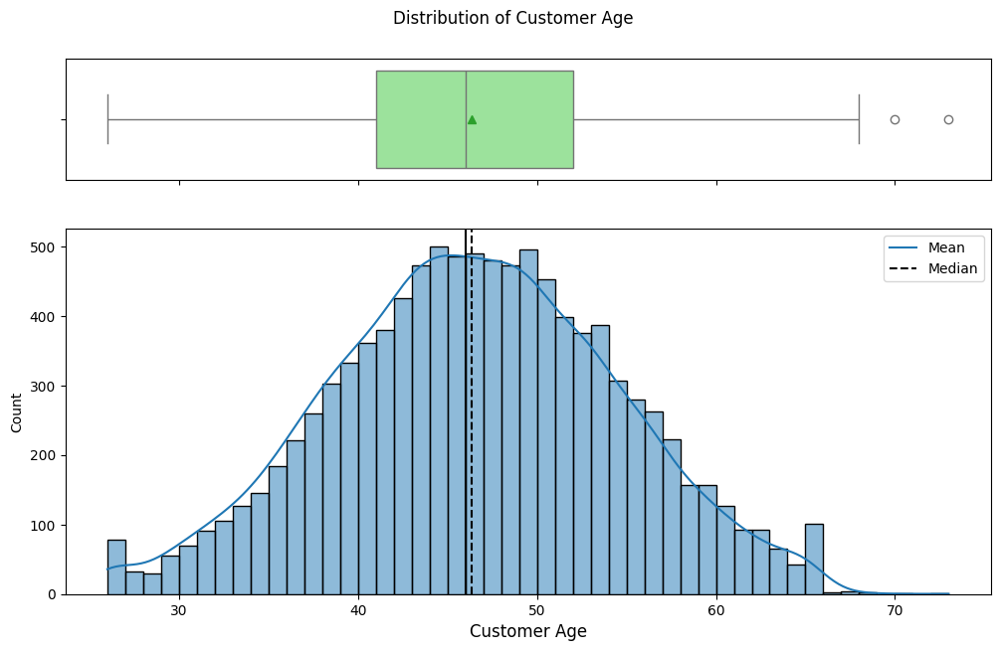

In [29]:
# Call the Function with Display The Histogram and Boxplot both
histogram_boxplot(data, "Customer_Age", fontsize = 12, kde=True, boxPlot_Color = 'lightgreen')

**Observation**:
 - The customer age is uniformly distributed, with only two values that lie beyond the upper whisker, indicating potential outliers. However, these outliers represent real customer ages and should not be treated as errors.
 - The average age of customers is around 46 years.
 - The close proximity of the mean and median suggests a symmetrical distribution, indicating that the data is normally distributed.

##### **Observation on Gender**

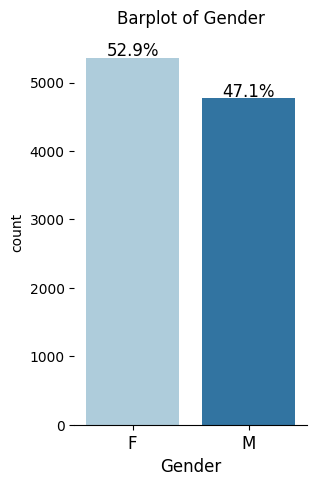

In [30]:
# Call the Function with Display The labeled barplot
labeled_barplot(data, "Gender", perc=True)

**Observation**: The data reveals that 52.9% of the customers are female, while 47.1% are male. Means Female customers takes more credit cards.

##### **Observation on Dependent Count**

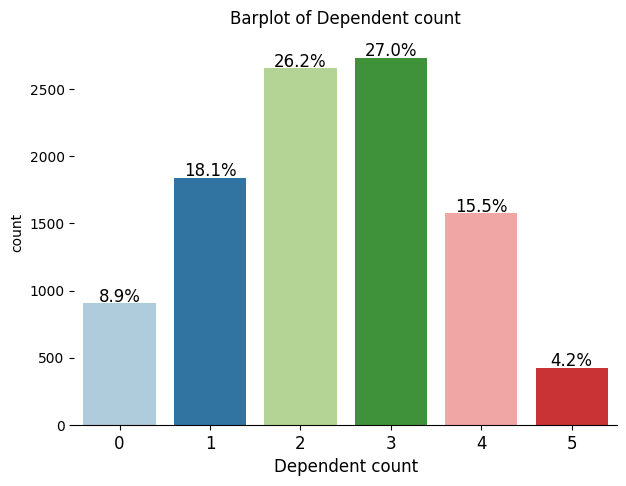

In [31]:
# Call the Function with Display The labeled barplot
labeled_barplot(data, "Dependent_count", perc=True)

**Observation**:
 - Over 53% of customers have either 2 or 3 dependents.
 - The remaning around 47% of customers have either 0, 1, 4, or 5 dependents.

##### **Observation on Education Level**

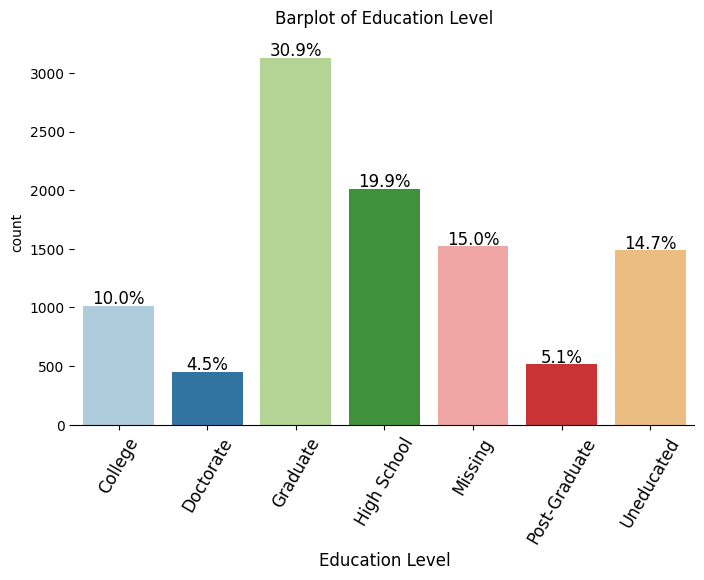

In [32]:
# Call the Function with Display The labeled barplot
labeled_barplot(data.copy(), "Education_Level", perc=True, degree = 60)

**Observation**:
 - The highest educational attainment among customers appears to be "graduate," accounting for 30.9% of the total.
 - A smaller percentage of customers hold post-graduate degrees (5.1%) and doctorates (4.5%).
 - 10% of customers have completed some form of college education.
 - High school graduates make up 19.9% of the customer base.
 - A subset of customers (14.7%) are uneducated.
 - 15% of customer education record is null/missing.

**The missing or NaN values in the Education Level column require null value treatment.**

##### **Observation on Marital Status**

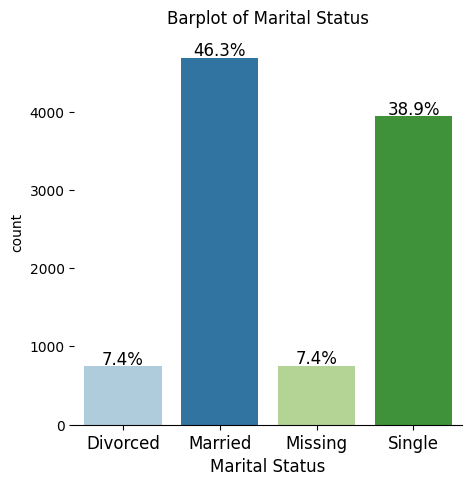

In [33]:
# Call the Function with Display The labeled barplot
labeled_barplot(data.copy(), "Marital_Status", perc=True)

**Observation**:
 - Among the customers, 46.3% are married, while 38.9% are single.
 - Additionally, 7.4% of customers are divorced.
 - Marital status information is missing for 7.4% of customers.

**The missing or NaN values in the Marital Status column require null value treatment.**

#### **Customers' Finantial Information**

##### **Observation on Income Category**

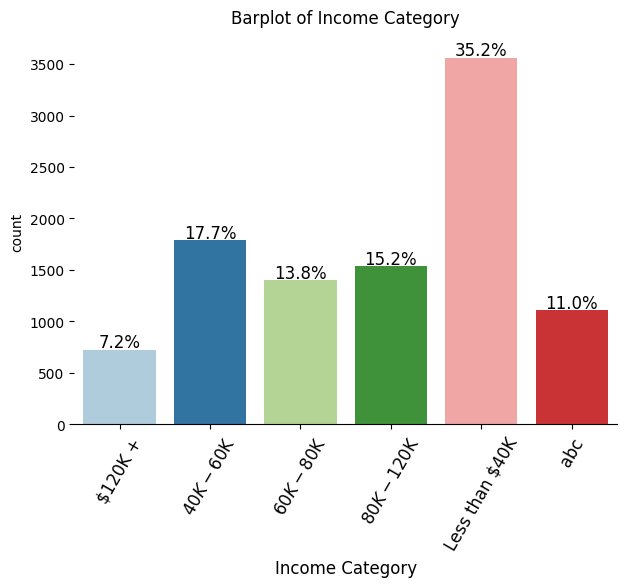

In [34]:
# Call the Function with Display The labeled barplot
labeled_barplot(data, "Income_Category", perc=True, degree = 60)

**Observation**
 - 35.2% of customers belong to the income category of less than \$40K.
 - Additionally, 17.7% of customers fall within the income range of \$40K to \$60K, 13.8% between \$60K to \$80K, 15.2% between \$80K to \$120K, and only 7.2% have incomes exceeding \$120K.
 - **Notably, 11% of customers are categorized under 'abc', which is an invalid or erroneous value that requires data cleaning and treatment to ensure accurate analysis.**

##### **Observation on Card Category**

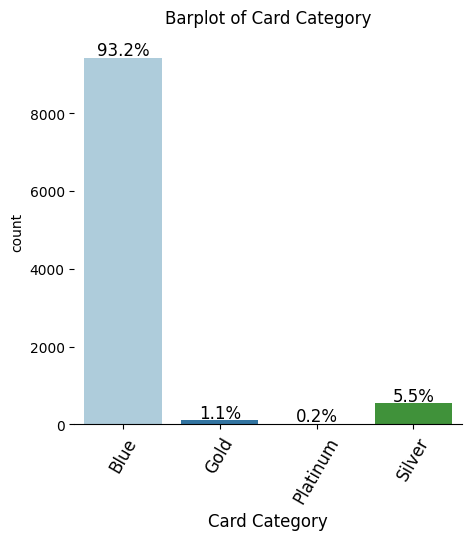

In [35]:
# Call the Function with Display The labeled barplot
labeled_barplot(data, "Card_Category", perc=True, degree = 60)

**Observation**
- 93.2% of customers hold Blue category credit cards, while the remaining 6.8% have Silver, Gold, or Platinum category cards.
- The Platinum card category is the rarest, held by only 0.2% of customers making it the most exclusive category.

##### **Observation on Period of relationship with the bank (Months_on_book)**

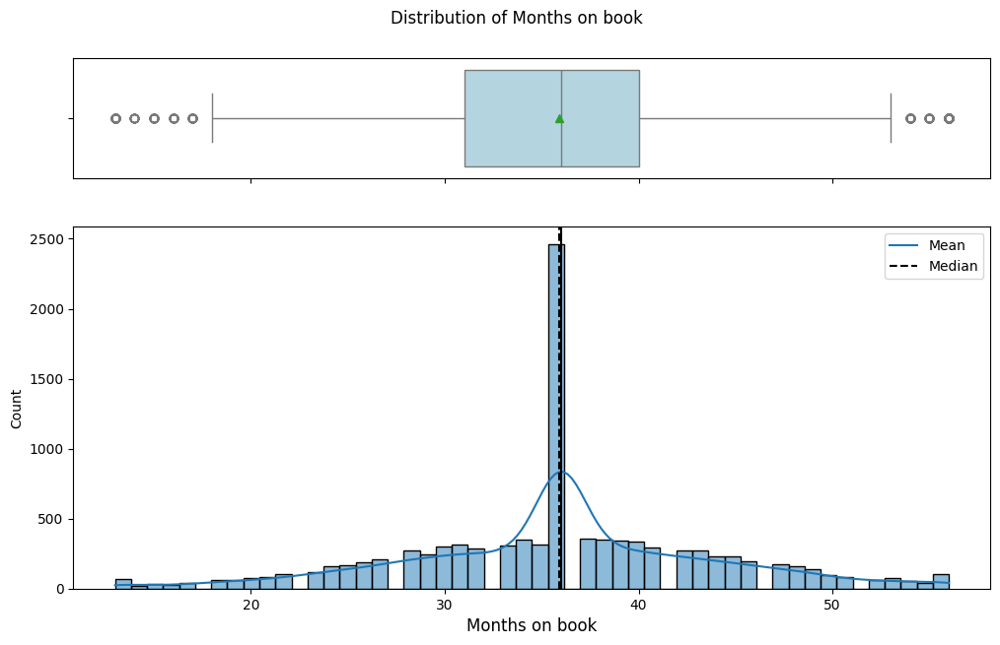

In [36]:
# Call the Function with Display The Histogram and Boxplot both
histogram_boxplot(data, "Months_on_book", fontsize = 12, kde=True, boxPlot_Color = 'lightblue')

**Observation**
 - There is a notable peak around the 36-month mark in the customers' period of relationship with the bank.
 - Both the mean and median appear to be very close to each other, suggesting that the distribution is relatively symmetrical.
 - However, there is some skewness to the right, indicating that more customers have longer relationships with the bank.
 - There are some outliers on both ends of the boxplot, but we should not treat them as anomalies since they represent actual customer data.

##### **Observation on Total no. of products held by the customer (Total_Relationship_Count)**

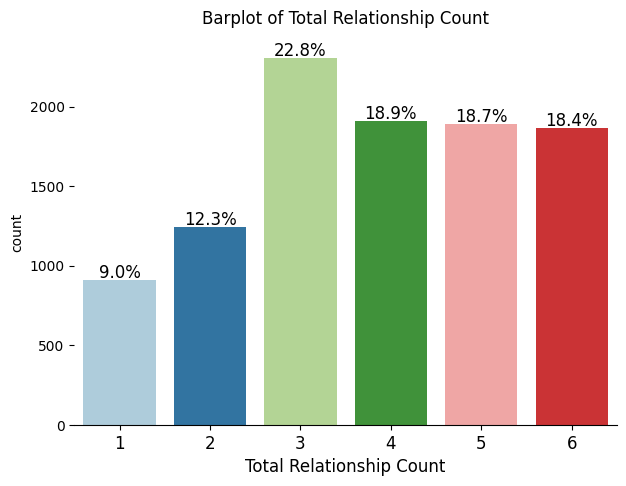

In [37]:
# Call the Function with Display The labeled barplot
labeled_barplot(data, "Total_Relationship_Count", perc=True)

**Observation**:
 - The largest group of customers (approximately 22.8%) holds 3 products from the bank, indicating a significant segment of customers with a moderate level of engagement.
 - A substantial proportion of customers have 4 products (18.9%), 5 products (18.7%), and 6 products (18.4%), indicating a high level of engagement and loyalty.
 - Smaller percentages of customers own 2 products (12.3%) and 1 product (9%).

##### **Observation on No. of months inactive in the last 12 months (Months_Inactive_12_mon)**

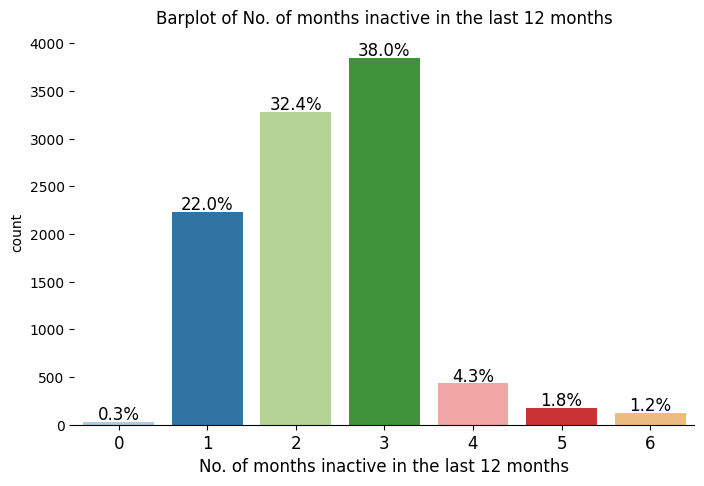

In [38]:
# Call the Function with Display The labeled barplot
labeled_barplot(data, "Months_Inactive_12_mon", perc=True, xlabel = "No. of months inactive in the last 12 months",
                Title = "No. of months inactive in the last 12 months")

**Observation**
As per the above graph Customers' inactivity in last 12 months can be descrive below -
 - Always Active: Only 0.3% of customers are consistently active, indicating a very small but loyal customer base.
 - 1 Month Inactivity: Around 22% of customers experienced 1 month of inactivity, suggesting a significant proportion of customers with occasional inactive periods.
 - 2 Months Inactivity: The highest count corresponds to 2 months of inactivity, affecting approximately 32.4% of customers, indicating a notable segment of customers with temporary inactivity.
 - 3 Months Inactivity: The next significant group experienced 3 months of inactivity, constituting 38%, indicating a substantial proportion of customers with a slightly longer inactive period.
 - Longer Inactivity: Smaller percentages of individuals were inactive for 4 months (about 4.3%), 5 months (approximately 1.8%), or 6 months (roughly 1.2%), indicating a gradual decrease in customers with longer inactive periods.

##### **Observation on No. of Contacts in the last 12 months (Contacts_Count_12_mon )**

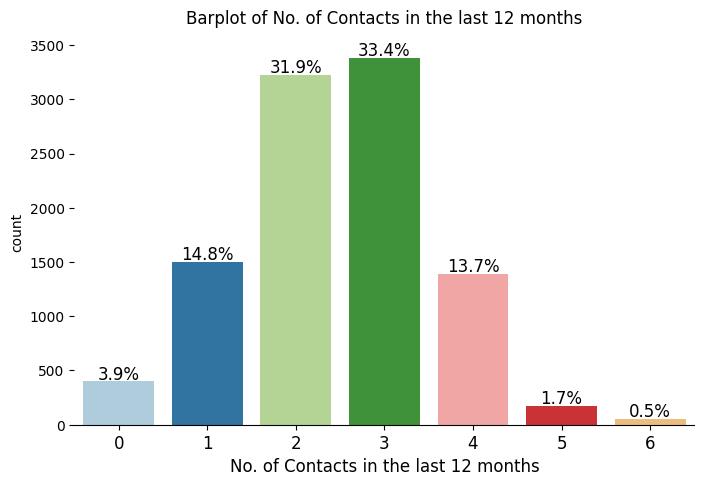

In [39]:
# Call the Function with Display The labeled barplot
labeled_barplot(data, "Contacts_Count_12_mon", perc=True, xlabel = "No. of Contacts in the last 12 months",
                Title = "No. of Contacts in the last 12 months")

**Observation** As per the above graph Customers' no of contact with bank in last 12 months can be described as follows -

- 1 Contact: 14.8% of the customers had a single contact during the last 12 months, indicating a notable segment of customers with minimal interaction.
- 2 Contacts: 31.9% of customers had 2 contacts, suggesting a significant proportion of customers with occasional interactions.
- 3 Contacts: 33.4% of customers made 3 contacts, indicating the highest frequency of interaction among customers.
- 4 Contacts: A smaller group, 13.7% of customers, had 4 contacts, showing a decrease in customers with higher interaction frequencies.
- 5+ Contacts: Only 1.7% of customers made 5 contacts, and an even smaller fraction (0.5%) made 6 contacts with the bank, indicating a small but loyal customer base with frequent interactions.

##### **Observation on Credit Limit**

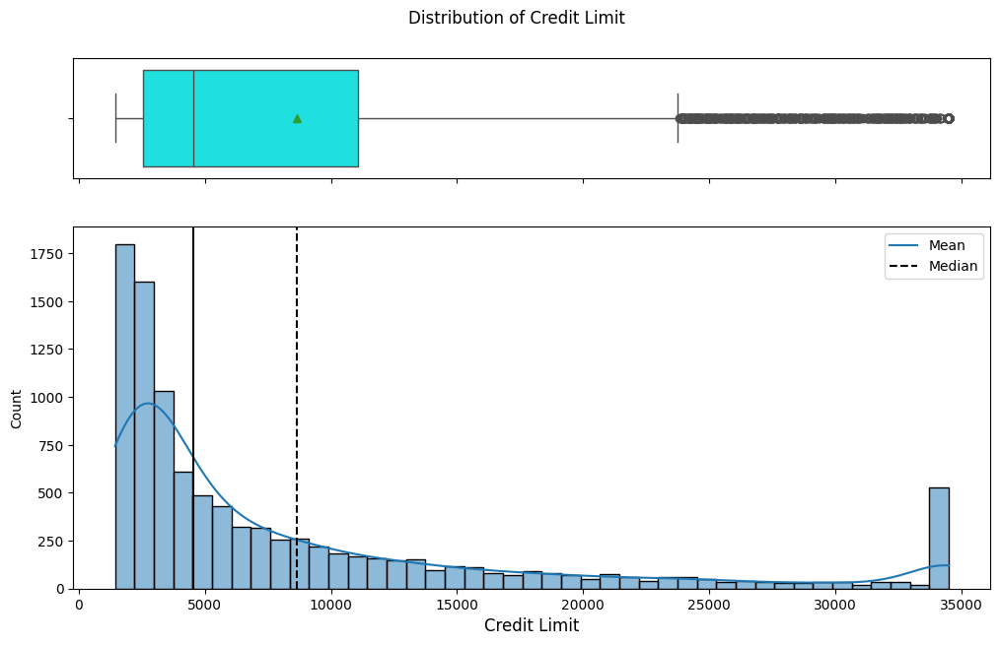

In [40]:
# Call the Function with Display The Histogram and Boxplot both
histogram_boxplot(data, "Credit_Limit", fontsize = 12, kde=True, boxPlot_Color = (0, 1, 1))

**Observation**
 - The credit limit distribution is right-skewed with outliers above the upper whisker.
 - The distribution reveals that there are a significantly larger number of customers with lower credit limits, and as credit limits increase, the number of customers decreases gradually, showcasing a clear inverse relationship.
 - These outliers shouldn't be treated as anomalies because they represent the real market trend, likely indicating high-value customers or exceptional cases.

##### **Observation on Total Revolving Balance on the Credit Card (Total_Revolving_Bal)**

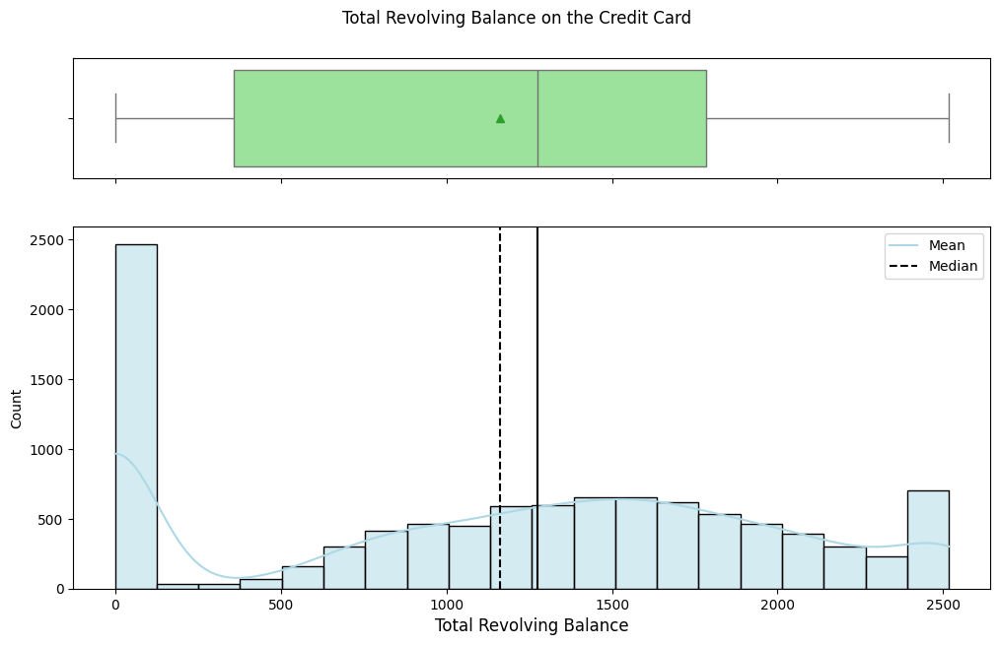

In [41]:
# Call the Function with Display The Histogram and Boxplot both
histogram_boxplot(data, "Total_Revolving_Bal", fontsize = 12, kde=True, boxPlot_Color = 'lightgreen', histPlot_Color = 'lightblue',
                  Title = "Total Revolving Balance on the Credit Card",
                  xlabel = "Total Revolving Balance")

**Observation**
  - Close to 2,500 customers have no revolving balance, indicating they have had no past due amounts on their credit cards in the past 12 months.
  - This results in the distribution being moderately right-skewed. Therefore, it is important to examine the distribution among customers who have had unpaid debt greater than zero in the past 12 months.

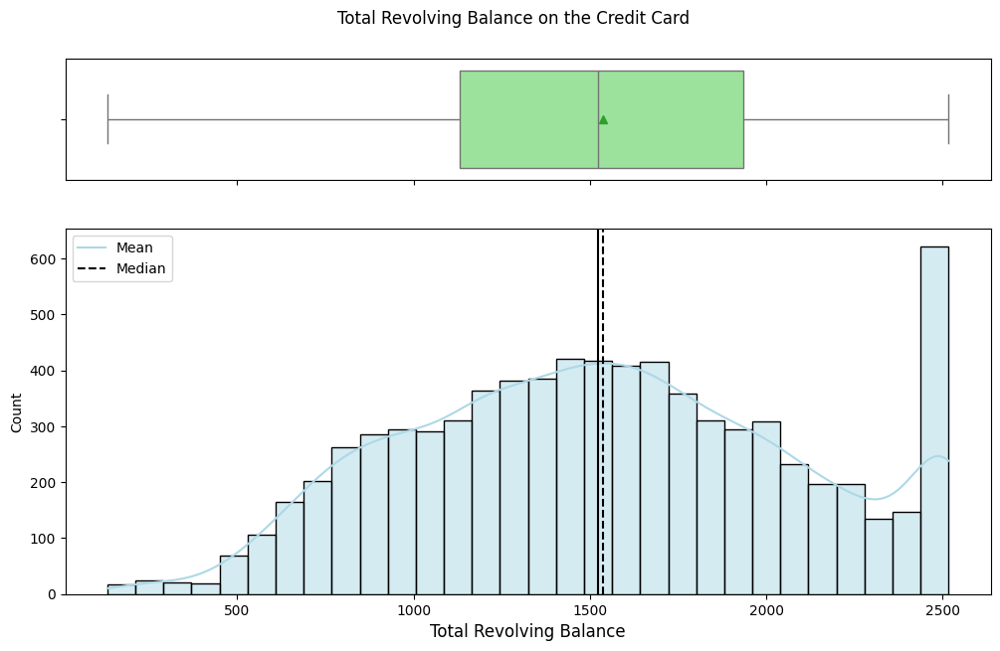

In [42]:
# Call the Function with Display The Histogram and Boxplot both
histogram_boxplot(data.loc[data['Total_Revolving_Bal'] != 0], "Total_Revolving_Bal", fontsize = 12, kde=True, boxPlot_Color = 'lightgreen', histPlot_Color = 'lightblue',
                  Title = "Total Revolving Balance on the Credit Card",
                  xlabel = "Total Revolving Balance")

**Observation**
 - Once the customers with zero past due amounts in the last 12 months are excluded, the distribution becomes left skewed.
 - Approximately 600 customers have a very high total revolving balance, close to \$2,500.
 - The average revolving balance over the past 12 months for these defaulting customers is little above \$1,500.

##### **Ovservation on Open to Buy Credit Line average of last 12 months (Avg_Open_To_Buy)**

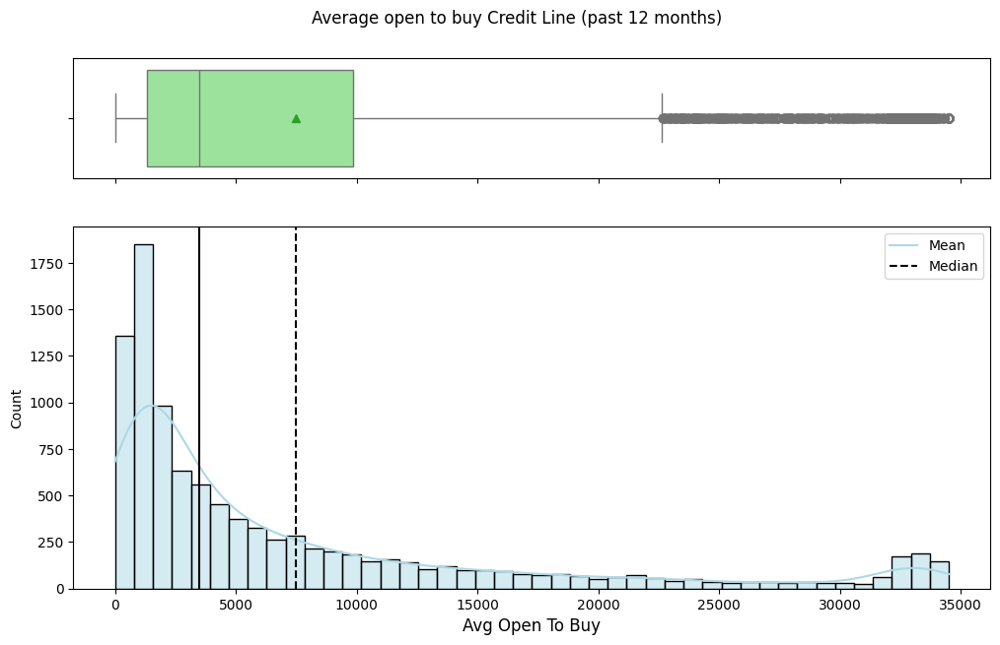

In [43]:
# Call the Function with Display The Histogram and Boxplot both
histogram_boxplot(data, "Avg_Open_To_Buy", fontsize = 12, kde=True, boxPlot_Color = 'lightgreen', histPlot_Color = 'lightblue',
                  Title = "Average open to buy Credit Line (past 12 months)")

**Observation**
- The average credit card spending limit for customers over the past 12 months exhibits a right-skewed distribution, indicating that a few customers have very high credit limits, pushing the upper boundary significantly.
- Most customers have maintained an average credit card spending limit of less than $8,000 during the past year.
- The outliers represent genuine customer trends and should not be disregarded.

##### **Observation on Change in Transaction Amount (Q4 over Q1) : (Total_Amt_Chng_Q4_Q1)**

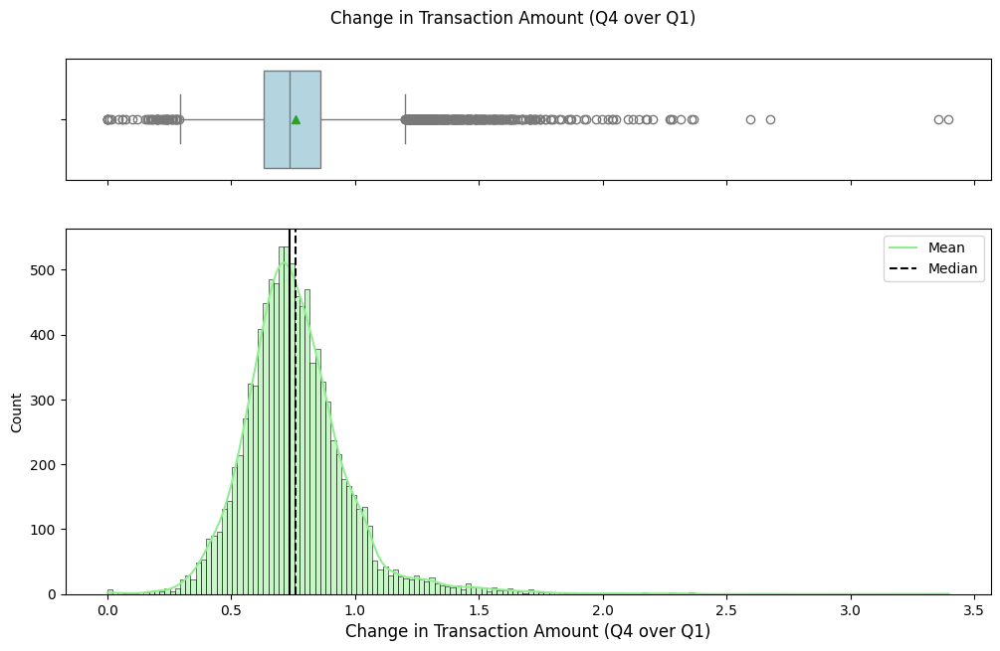

In [44]:
# Call the Function with Display The Histogram and Boxplot both
histogram_boxplot(data, "Total_Amt_Chng_Q4_Q1", fontsize = 12, kde=True, boxPlot_Color = 'lightblue', histPlot_Color = 'lightgreen',
                  Title = "Change in Transaction Amount (Q4 over Q1)",
                  xlabel = "Change in Transaction Amount (Q4 over Q1)",
                  )

**Observation**
- Change in Transaction Amount (Q4 over Q1) refers to the ratio of the total transaction amounts in the fourth quarter (Q4) compared to the first quarter (Q1) for the last 12 months. The distribution of this ratio is right-skewed with many outliers, indicating that a few customers have significantly higher spending in Q4 (between 100% to 350%) compared to their Q1 spending.
- The median change in transaction amount (Q4 over Q1) is approximately 0.6, indicating that for 50% of customers, spending in Q4 represents 60% of their total transaction amount in Q1.
- The outliers should not be disregarded, as they represent the true transaction ratio of Q4 over Q1.

##### **Observation Total Transaction Amount for the Last 12 months : (Total_Trans_Amt)**

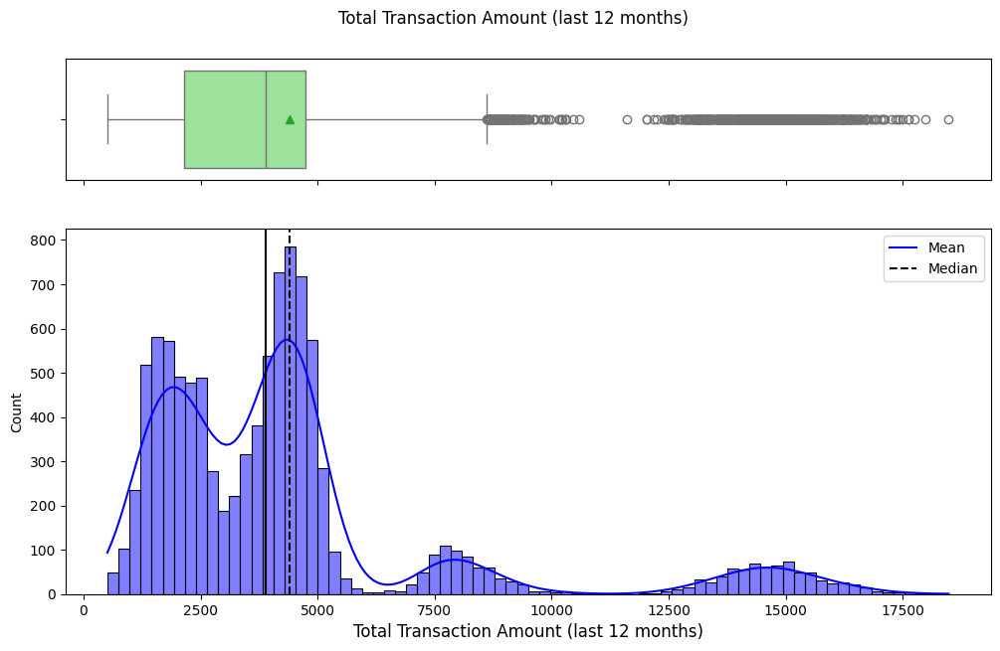

In [45]:
# Call the Function with Display The Histogram and Boxplot both
histogram_boxplot(data, "Total_Trans_Amt", fontsize = 12, kde=True, boxPlot_Color = 'lightgreen', histPlot_Color = 'blue',
                  Title = "Total Transaction Amount (last 12 months)",
                  xlabel = "Total Transaction Amount (last 12 months)",
                  )

**Observation**
- The distribution of the total transaction amount is right-skewed with a long tail and four distinct peaks, indicating that a few customers have had very high transaction amounts over the last 12 months.
- The peaks suggests diversity in customer spending behaviors, revealing distinct groups with varying levels of transactional activity over the past 12 months.
- The majority of customers have a total transaction amount of less than $5,000.
- The extreme outliers in the distribution of total transaction amounts are real-life examples and should not be treated.

##### **Observation on Total Transaction Count for the last 12 months: Total_Trans_Ct)**

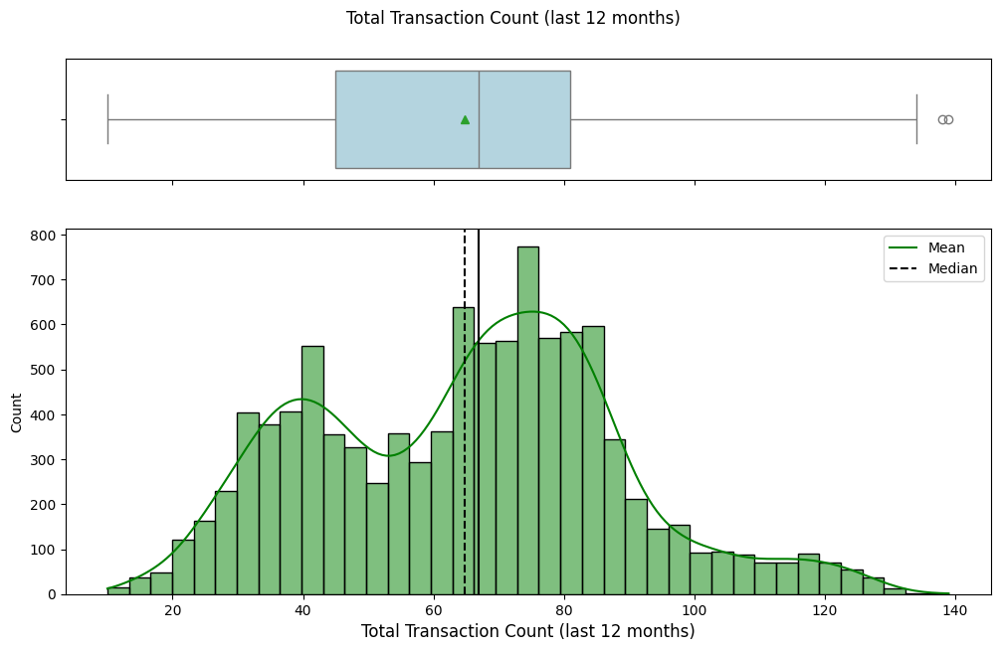

In [46]:

# Call the Function with Display The Histogram and Boxplot both
histogram_boxplot(data, "Total_Trans_Ct", fontsize = 12, kde=True, boxPlot_Color = 'lightblue', histPlot_Color = 'green',
                  Title = "Total Transaction Count (last 12 months)",
                  xlabel = "Total Transaction Count (last 12 months)",
                  )

**Observation**
- The distribution of the total transaction amount is right-skewed with a long tail and four distinct peaks, indicating that a few customers have had very high transaction amounts over the last 12 months.
- The peaks suggest diversity in customer spending behaviors, revealing distinct groups with varying levels of transactional activity over the past 12 months.
- The majority of customers have a total transaction amount of less than $5,000.
- The extreme outliers in the distribution of total transaction amounts are real-life examples and should not be treated as anomalies.

##### **Observation on Change in Transaction Count in Q4 over Q1 for the last 12 months: Total_Ct_Chng_Q4_Q1)**


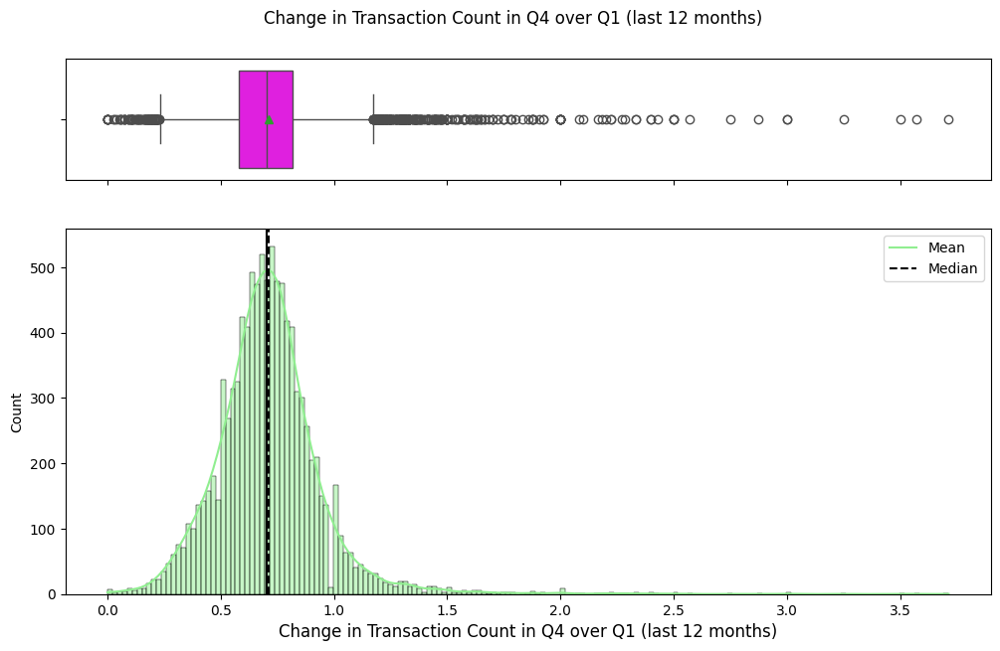

In [47]:
# Call the Function with Display The Histogram and Boxplot both
histogram_boxplot(data, "Total_Ct_Chng_Q4_Q1", fontsize = 12, kde=True, boxPlot_Color = 'magenta', histPlot_Color = 'lightgreen',
                  Title = "Change in Transaction Count in Q4 over Q1 (last 12 months)",
                  xlabel = "Change in Transaction Count in Q4 over Q1 (last 12 months)",
                  )

**Ovservation**
- The ratio distribution shows a right-skewed pattern with numerous outliers, highlighting that a small number of customers had substantially higher transaction counts in Q4 (between 100% to 350%) compared to Q1.
- Approximately 50% of customers had a ratio of around 0.7, indicating that their transaction volume in Q4 was roughly 70% of their transaction volume in the first quarter.
- The outliers should not be disregarded as they represent the true transaction count ratio from Q4 to Q1.

##### **Observation on Average Card Utilization Ratio: (Avg_Utilization_Ratio)**

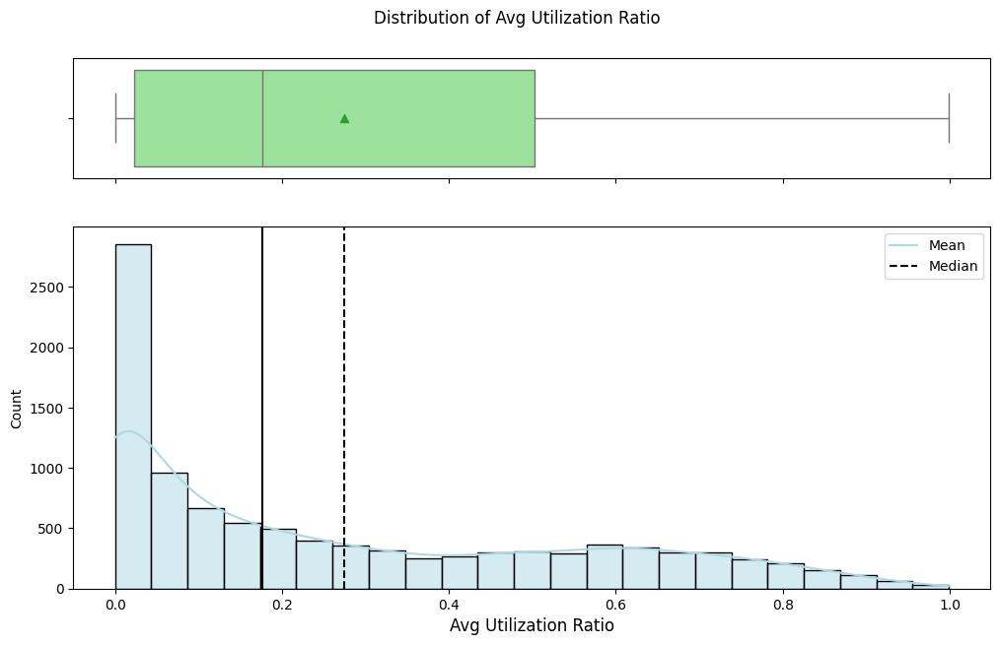

In [48]:
# Call the Function with Display The Histogram and Boxplot both
histogram_boxplot(data, "Avg_Utilization_Ratio", fontsize = 12, kde=True, boxPlot_Color = 'lightgreen', histPlot_Color = 'lightblue')

**Observation**
- The average utilization ratio of a credit card represents the proportion of the credit limit that cardholders typically use. The distribution of this ratio is right-skewed, suggesting that a minority of customers have high credit card utilization nearing 100%.
- Additionally, over 2,500 customers have not utilized their credit cards at all. Therefore, it is crucial to analyze the distribution among customers who do use their credit cards.

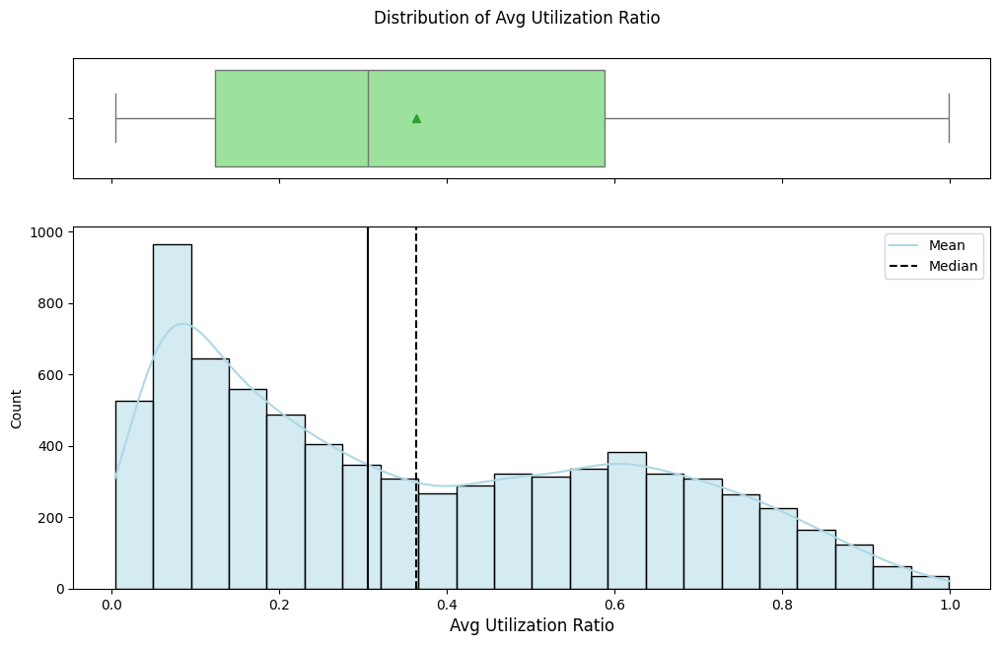

In [49]:
# Call the Function with Display The Histogram and Boxplot both
histogram_boxplot(data.loc[data['Avg_Utilization_Ratio'] != 0], "Avg_Utilization_Ratio", fontsize = 12, kde=True, boxPlot_Color = 'lightgreen', histPlot_Color = 'lightblue')

**Observation**
- The distribution of credit card utilization among users is also right-skewed.
- The median credit card utilization among users who use credit cards stands at approximately 40%.

### Bivariate Analysis

#### **Correlation Check**

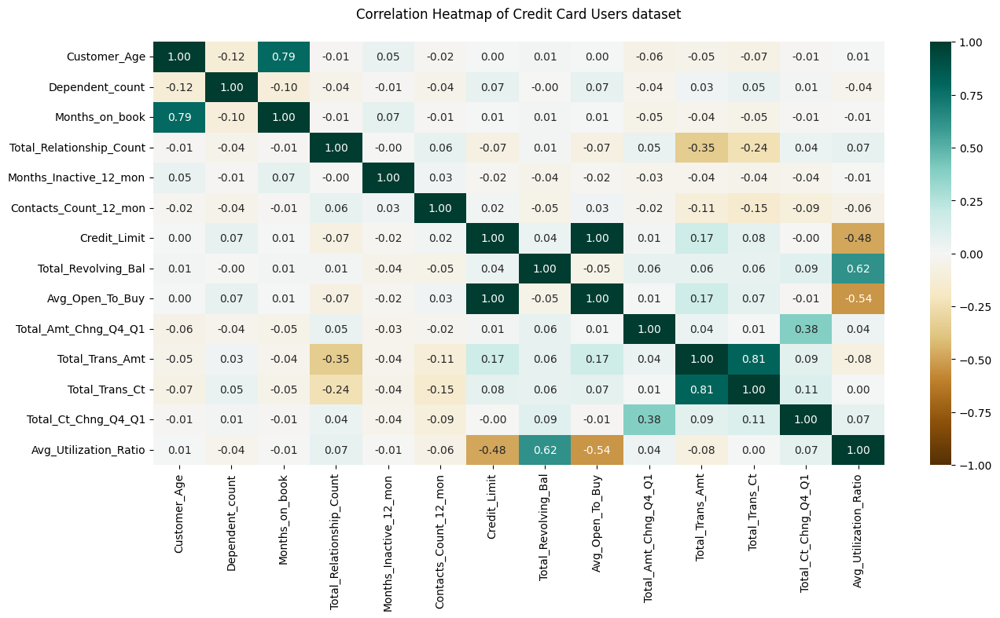

In [50]:
# Assess the correlation among all columns.
# Exclude the Client Number (CLINTNUM) field because it is a unique identifier and cannot be correlated with any other independent variable
plt.figure(figsize=(15, 7))                                     # Set the figure size
correlation_matrix = (data.select_dtypes(include=['number']))   # Select only numerical columns and create a correlation matrix

# Plot the heatmap using Seaborn
heatmap = sns.heatmap(correlation_matrix.corr(), annot=True, vmin=-1, vmax=1, fmt=".2f", cmap="BrBG")
heatmap.set_title('Correlation Heatmap of Credit Card Users dataset', y=1.04)              # Set the title and position it
plt.show()                                                    # Display the Plot

**Observation**
- Customer age and months on book (relationship duration with the bank) show a strong positive correlation.
- Credit limit and average open-to-buy credit line are perfectly correlated, suggesting redundancy; consider dropping one.
- Average utilization ratio of credit cards is negatively correlated with credit limit and open-to-buy credit line. It's positively correlated with total revolving balance on the card.
- Total Transaction Amount shows a clear and strong positive correlation with Total Transaction Count.

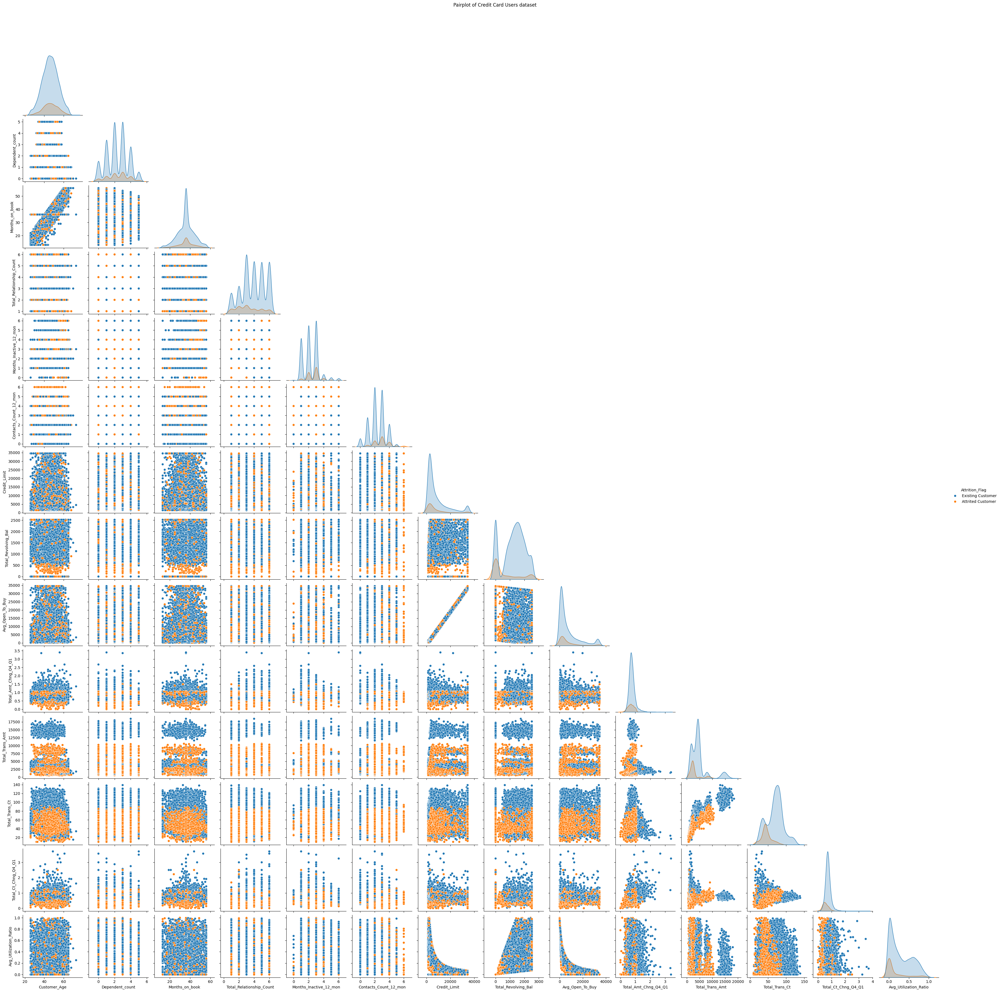

In [51]:
# Create a pairplot for Bivariate analysis
sns.pairplot(data, diag_kind="kde", hue="Attrition_Flag", corner=True)
plt.suptitle('Pairplot of Credit Card Users dataset', y=1.04)
plt.show()

**Observation**
- When comparing customers who have attrited (left) versus those who have not, there is overlap in the distributions of various variables.

- Specific metrics where attritees tend to show lower values include:
 - Total Transaction Amount (Last 12 months)
 - Total Transaction Count (Last 12 months)
 - Ratio of total transaction count in Q4 compared to Q1
 - Ratio of total transaction amount in Q4 compared to Q1

- Despite overlaps, these metrics suggest potential patterns where customers with lower transaction volumes and ratios over time may be more likely to attrit.

#### **Attrition Compared to Customers' Demographic Attributes**

##### **Attrition Vs Age**

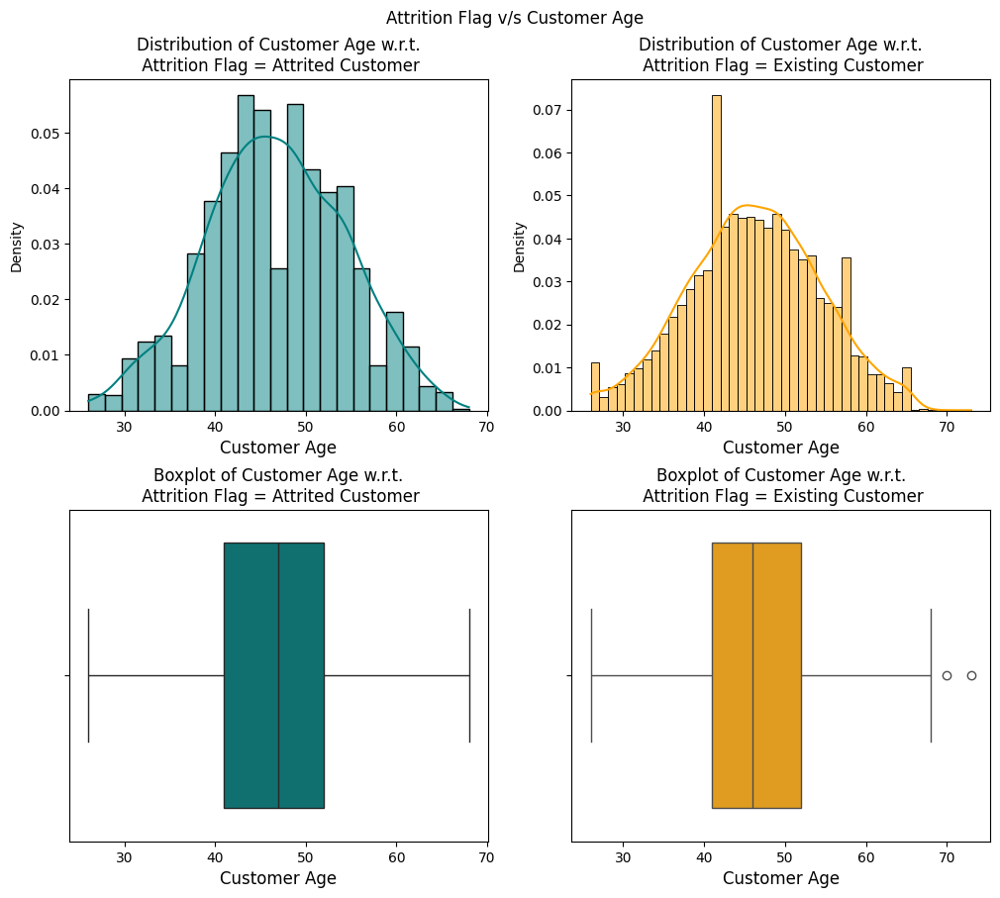

In [52]:
# Display a Distribution plot with Boxplot
distribution_plot_wrt_target(data, "Customer_Age", "Attrition_Flag", ked = True,
                             Adjust_Title = True, Title_len_per_line = 40)

**Observation**:
- The median age of attritees is higher than that of existing cutomers, indicating that younger customers are more likely to remain as customers.
- The boxplots for existing customers reveal the presence of outliers.

##### **Attrition Vs Gender**

╒══════════════════╤═════════════════════╤═════════════════════╤═══════╕
│ Attrition Flag   │   Attrited Customer │   Existing Customer │   All │
│ Gender           │                     │                     │       │
╞══════════════════╪═════════════════════╪═════════════════════╪═══════╡
│ M                │                 697 │                4072 │  4769 │
├──────────────────┼─────────────────────┼─────────────────────┼───────┤
│ F                │                 930 │                4428 │  5358 │
├──────────────────┼─────────────────────┼─────────────────────┼───────┤
│ All              │                1627 │                8500 │ 10127 │
╘══════════════════╧═════════════════════╧═════════════════════╧═══════╛
------------------------------------------------------------------------------------------------------------------------


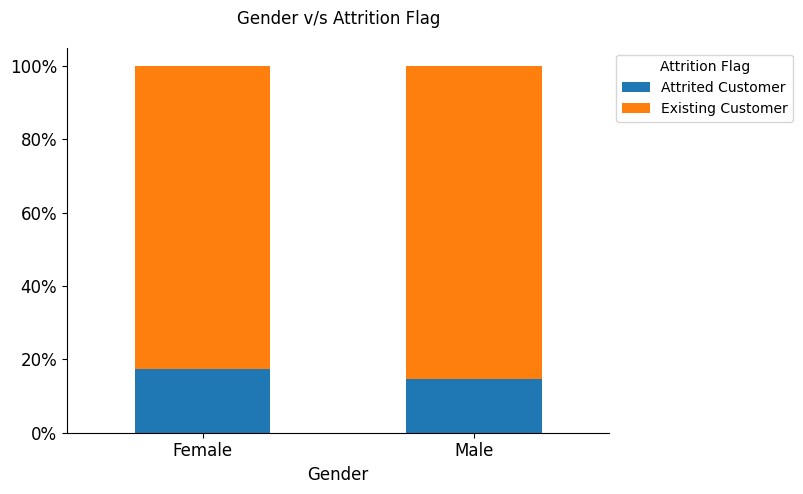

In [53]:
# Mapping the Gender Labels
mapping_Gender = {"F": "Female","M": "Male"}

# Print a table with data where predictor is on x column and target is stacked
print_table(data, "Gender", "Attrition_Flag")
print("-" * 120)

# Stached a Custom Barplot
stacked_barplot(data, "Gender", "Attrition_Flag",
                index_mapping = mapping_Gender)

**Observation**: It appears that the attrition rate among females is slightly higher compared to males.

##### **Attrition vs Dependent Count**

╒═══════════════════╤═════════════════════╤═════════════════════╤═══════╕
│ Attrition Flag    │   Attrited Customer │   Existing Customer │   All │
│ Dependent count   │                     │                     │       │
╞═══════════════════╪═════════════════════╪═════════════════════╪═══════╡
│ 5                 │                  64 │                 360 │   424 │
├───────────────────┼─────────────────────┼─────────────────────┼───────┤
│ 0                 │                 135 │                 769 │   904 │
├───────────────────┼─────────────────────┼─────────────────────┼───────┤
│ 4                 │                 260 │                1314 │  1574 │
├───────────────────┼─────────────────────┼─────────────────────┼───────┤
│ 1                 │                 269 │                1569 │  1838 │
├───────────────────┼─────────────────────┼─────────────────────┼───────┤
│ 2                 │                 417 │                2238 │  2655 │
├───────────────────┼─────────────────

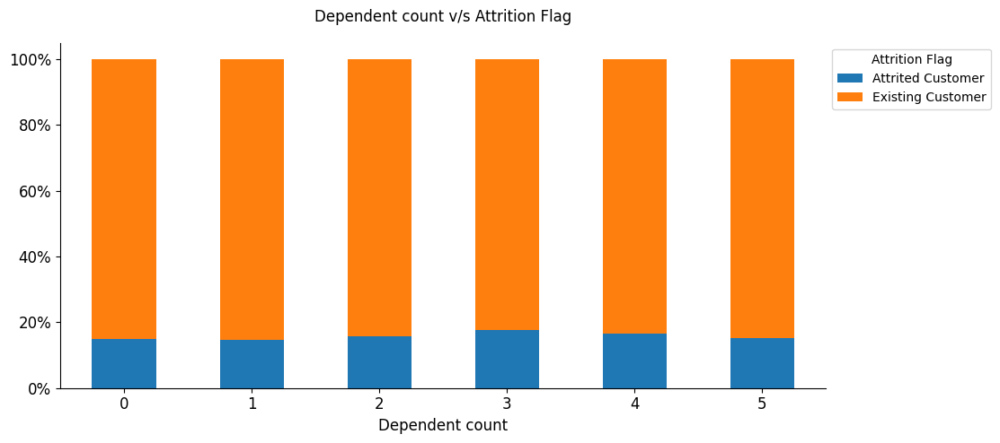

In [54]:
# Print a table with data where predictor is on x column and target is stacked
print_table(data, "Dependent_count", "Attrition_Flag")
print("-" * 120)

# Stached a Custom Barplot
stacked_barplot(data, "Dependent_count", "Attrition_Flag")

**Observation**:
- It appears that the attrition rate among customers with 3 to 5 dependents is slightly higher than that of customers with 0 to 2 dependents.
- Customers with a dependent count of 3 have the highest number and rate of attrition.

##### **Attrition vs Education Level**

╒═══════════════════╤═════════════════════╤═════════════════════╤═══════╕
│ Attrition Flag    │   Attrited Customer │   Existing Customer │   All │
│ Education Level   │                     │                     │       │
╞═══════════════════╪═════════════════════╪═════════════════════╪═══════╡
│ Post-Graduate     │                  92 │                 424 │   516 │
├───────────────────┼─────────────────────┼─────────────────────┼───────┤
│ Doctorate         │                  95 │                 356 │   451 │
├───────────────────┼─────────────────────┼─────────────────────┼───────┤
│ College           │                 154 │                 859 │  1013 │
├───────────────────┼─────────────────────┼─────────────────────┼───────┤
│ Uneducated        │                 237 │                1250 │  1487 │
├───────────────────┼─────────────────────┼─────────────────────┼───────┤
│ High School       │                 306 │                1707 │  2013 │
├───────────────────┼─────────────────

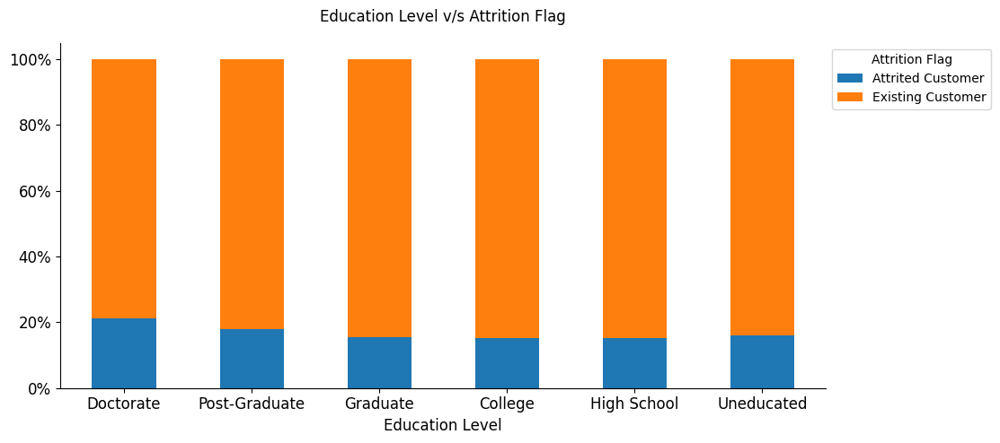

In [55]:
# Print a table with data where predictor is on x column and target is stacked
print_table(data, "Education_Level", "Attrition_Flag")
print("-" * 120)

# Cusatom order of Education Level for better visibility
order_education_level = ['Doctorate', 'Post-Graduate', 'Graduate', 'College', 'High School', 'Uneducated']

# Stached a Custom Barplot
stacked_barplot(data, "Education_Level", "Attrition_Flag",order = order_education_level)

**Observation**:
- The attrition rate among customers with a doctorate or post-graduate (advanced degrees) is slightly higher compared to customers who are educated up to the graduate level.
- Graduates have the highest number of attritions.

##### **Attrition vs Marital Status**

╒══════════════════╤═════════════════════╤═════════════════════╤═══════╕
│ Attrition Flag   │   Attrited Customer │   Existing Customer │   All │
│ Marital Status   │                     │                     │       │
╞══════════════════╪═════════════════════╪═════════════════════╪═══════╡
│ Divorced         │                 121 │                 627 │   748 │
├──────────────────┼─────────────────────┼─────────────────────┼───────┤
│ Single           │                 668 │                3275 │  3943 │
├──────────────────┼─────────────────────┼─────────────────────┼───────┤
│ Married          │                 709 │                3978 │  4687 │
├──────────────────┼─────────────────────┼─────────────────────┼───────┤
│ All              │                1498 │                7880 │  9378 │
╘══════════════════╧═════════════════════╧═════════════════════╧═══════╛
------------------------------------------------------------------------------------------------------------------------


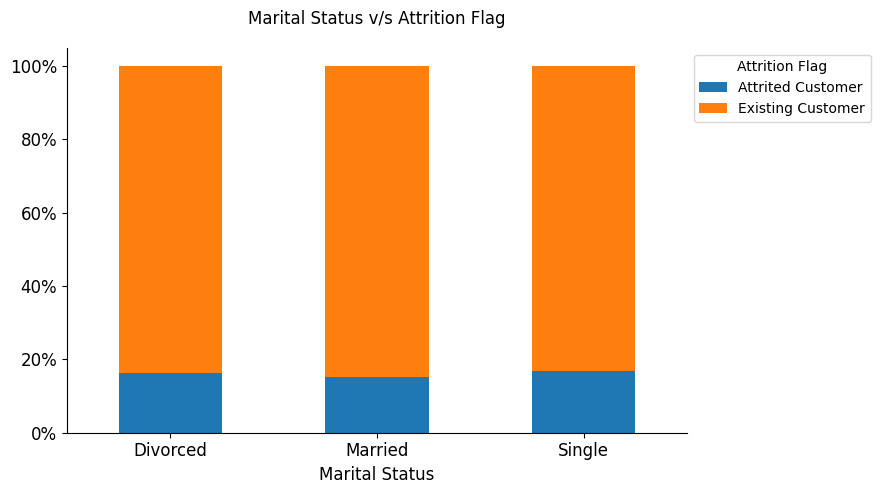

In [56]:
# Print a table with data where predictor is on x column and target is stacked
print_table(data, "Marital_Status", "Attrition_Flag")
print("-" * 120)

# Stached a Custom Barplot
stacked_barplot(data, "Marital_Status", "Attrition_Flag")

**Observation**: The attrition rate among married customers is slightly lower than that of single or divorced customers.

#### **Attrition Compared to Customers' Financial Attributes**

##### **Attrition vs Income Catagory**

╒═══════════════════╤═════════════════════╤═════════════════════╤═══════╕
│ Attrition Flag    │   Attrited Customer │   Existing Customer │   All │
│ Income Category   │                     │                     │       │
╞═══════════════════╪═════════════════════╪═════════════════════╪═══════╡
│ $120K +           │                 126 │                 601 │   727 │
├───────────────────┼─────────────────────┼─────────────────────┼───────┤
│ abc               │                 187 │                 925 │  1112 │
├───────────────────┼─────────────────────┼─────────────────────┼───────┤
│ $60K - $80K       │                 189 │                1213 │  1402 │
├───────────────────┼─────────────────────┼─────────────────────┼───────┤
│ $80K - $120K      │                 242 │                1293 │  1535 │
├───────────────────┼─────────────────────┼─────────────────────┼───────┤
│ $40K - $60K       │                 271 │                1519 │  1790 │
├───────────────────┼─────────────────

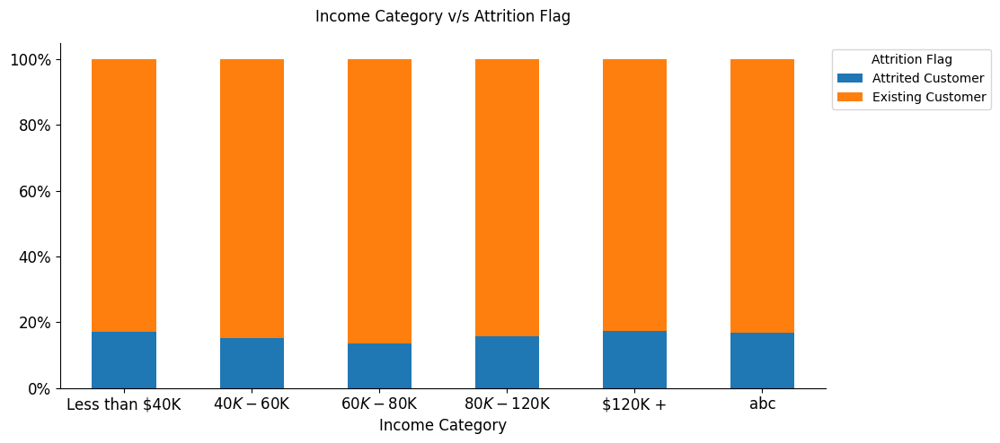

In [57]:
# Print a table with data where predictor is on x column and target is stacked
print_table(data, "Income_Category", "Attrition_Flag")
print("-" * 120)

# Cusatom order of Income Category for better visibility
order_Income_category = ['Less than $40K', '$40K - $60K', '$60K - $80K', '$80K - $120K', '$120K +', 'abc']

stacked_barplot(data, "Income_Category", "Attrition_Flag", order = order_Income_category)

**Observation**
- The attrition rate appears slightly higher among customers with incomes above \$120K and below \$40K.
- There is an income category 'abc' that does not fit into the existing income categories and should therefore be marked as 'Unknown'.



##### **Attrition vs Card Catagory**

╒══════════════════╤═════════════════════╤═════════════════════╤═══════╕
│ Attrition Flag   │   Attrited Customer │   Existing Customer │   All │
│ Card Category    │                     │                     │       │
╞══════════════════╪═════════════════════╪═════════════════════╪═══════╡
│ Platinum         │                   5 │                  15 │    20 │
├──────────────────┼─────────────────────┼─────────────────────┼───────┤
│ Gold             │                  21 │                  95 │   116 │
├──────────────────┼─────────────────────┼─────────────────────┼───────┤
│ Silver           │                  82 │                 473 │   555 │
├──────────────────┼─────────────────────┼─────────────────────┼───────┤
│ Blue             │                1519 │                7917 │  9436 │
├──────────────────┼─────────────────────┼─────────────────────┼───────┤
│ All              │                1627 │                8500 │ 10127 │
╘══════════════════╧═════════════════════╧═════════

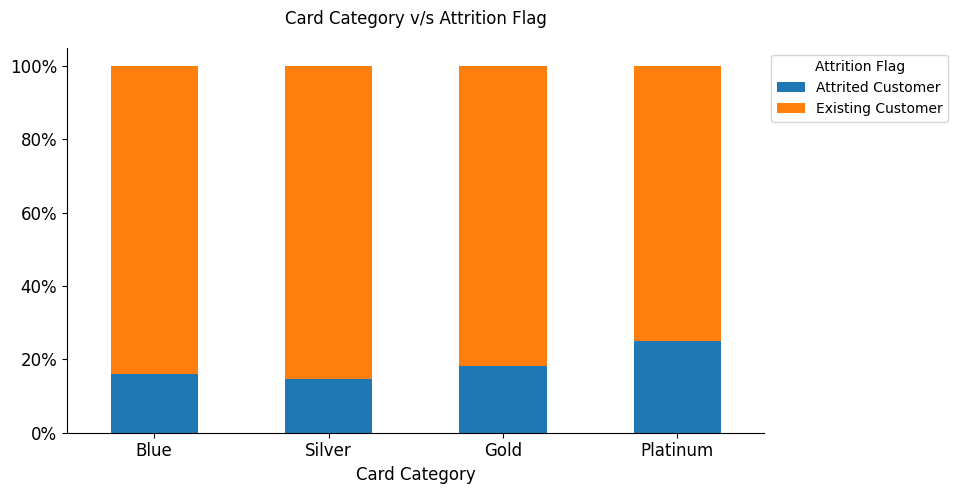

In [58]:
# Print a table with data where predictor is on x column and target is stacked
print_table(data, "Card_Category", "Attrition_Flag")
print("-" * 120)

# Cusatom order of Credit Card Catagories
order_card_category = ['Blue', 'Silver', 'Gold', 'Platinum']

# Stached a Custom Barplot
stacked_barplot(data, "Card_Category", "Attrition_Flag", order = order_card_category)

**Observation**: It appears that customers who own credit cards classified as Gold and Platinum have a slightly higher attrition rate compared to the other two classes Blue and Silver.

##### **Attrition vs Months_on_book (Period of relationship with the bank in months)**

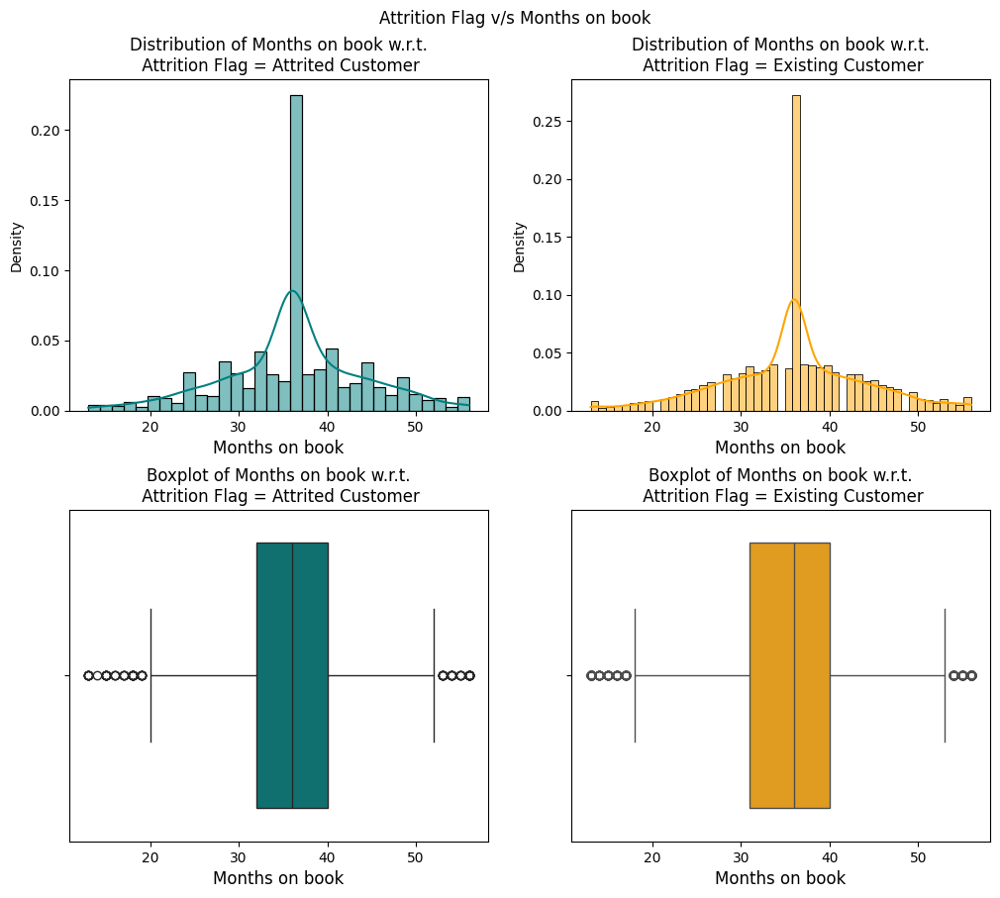

In [59]:
# Display a Distribution plot with Boxplot
distribution_plot_wrt_target(data, "Months_on_book", "Attrition_Flag", ked = True,
                             Adjust_Title = True, Title_len_per_line = 40)

**Observation**
- The months on book (period of relationship with the bank in months) are uniformly distributed for both attrited and existing customers, suggesting that the period of relationship with the bank does not impact the attrition rate significantly.
- There are outliers at both lower and higher ends among attrited customers, indicating that attrition occurs among both short-term and long-term customers.
- For both attrited and existing customers, the median duration of the customer's relationship with the bank is around 36 months (3 years), with the majority of customers falling into this category.

##### **Attrition vs Total_Relationship_Count (Total no. of products held by the customer)**

╒════════════════════════════╤═════════════════════╤═════════════════════╤═══════╕
│ Attrition Flag             │   Attrited Customer │   Existing Customer │   All │
│ Total Relationship Count   │                     │                     │       │
╞════════════════════════════╪═════════════════════╪═════════════════════╪═══════╡
│ 6                          │                 196 │                1670 │  1866 │
├────────────────────────────┼─────────────────────┼─────────────────────┼───────┤
│ 4                          │                 225 │                1687 │  1912 │
├────────────────────────────┼─────────────────────┼─────────────────────┼───────┤
│ 5                          │                 227 │                1664 │  1891 │
├────────────────────────────┼─────────────────────┼─────────────────────┼───────┤
│ 1                          │                 233 │                 677 │   910 │
├────────────────────────────┼─────────────────────┼─────────────────────┼───────┤
│ 2 

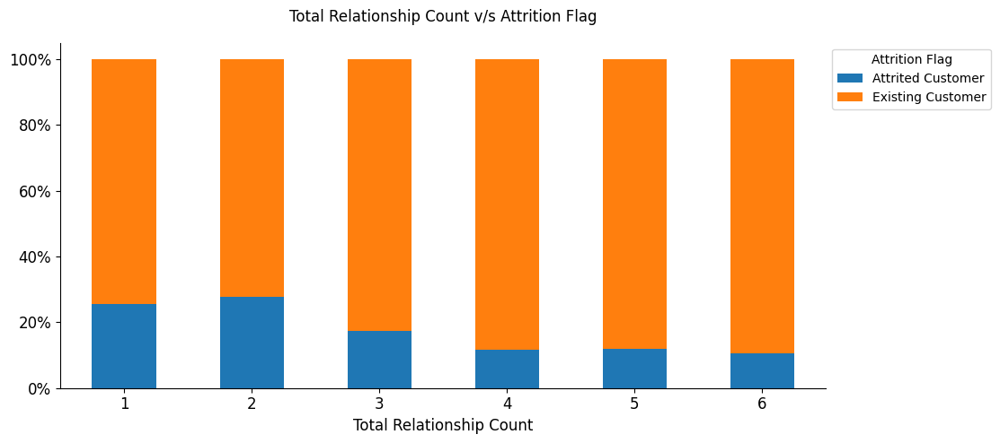

In [60]:
# Print a table with data where predictor is on x column and target is stacked
print_table(data, "Total_Relationship_Count", "Attrition_Flag")
print("-" * 120)

# Stached a Custom Barplot
stacked_barplot(data, "Total_Relationship_Count", "Attrition_Flag")

**Observation**:
- It is observed that the attrition rate has a negative correlation with the number of products held by customers. The more products a customer holds, the lower the attrition rate.

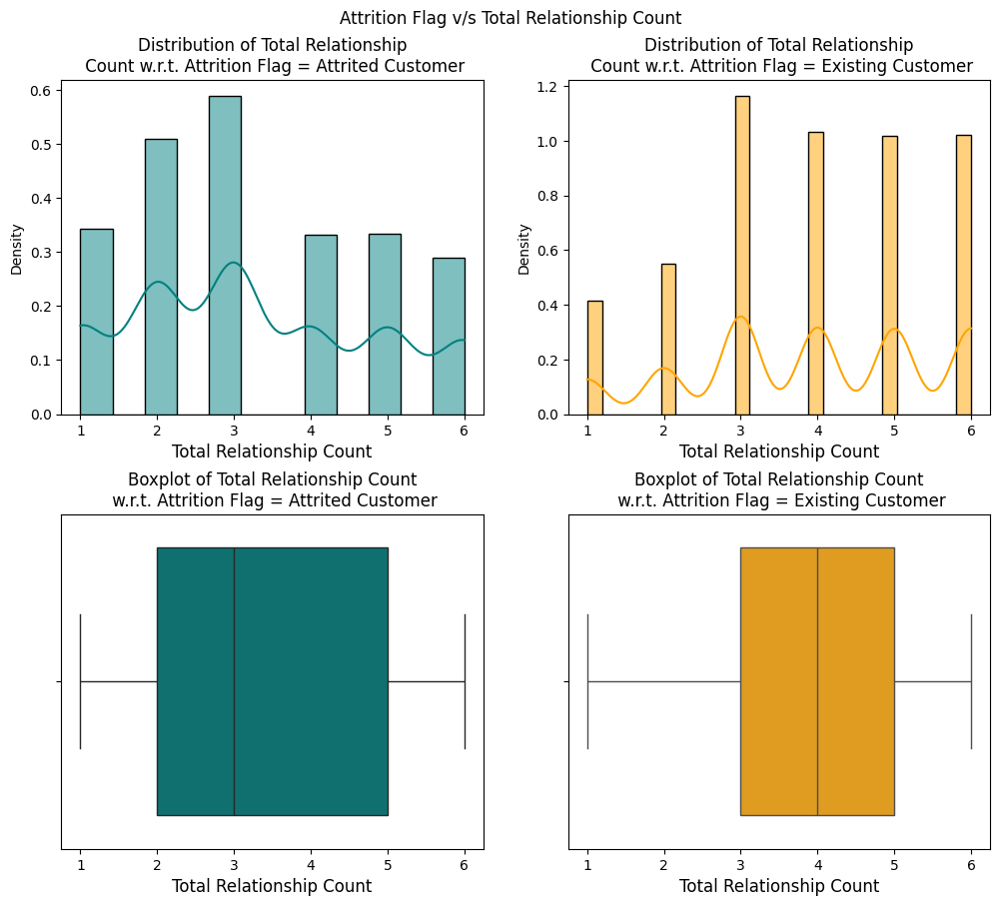

In [61]:
# Display a Distribution plot with Boxplot
distribution_plot_wrt_target(data, "Total_Relationship_Count", "Attrition_Flag", ked = True,
                             Adjust_Title = True, Title_len_per_line = 40)

**Observation**
- The Median of number of products held by attrited customers is around 3, which is lower than the median of around 4 products held by existing customers.
- The highest attrition occurs among customers who hold 2 to 3 products.

##### **Attrition vs Months_Inactive_12_mon (No. of months inactive in the last 12 months)**

╒══════════════════════════╤═════════════════════╤═════════════════════╤═══════╕
│ Attrition Flag           │   Attrited Customer │   Existing Customer │   All │
│ Months Inactive 12 mon   │                     │                     │       │
╞══════════════════════════╪═════════════════════╪═════════════════════╪═══════╡
│ 0                        │                  15 │                  14 │    29 │
├──────────────────────────┼─────────────────────┼─────────────────────┼───────┤
│ 6                        │                  19 │                 105 │   124 │
├──────────────────────────┼─────────────────────┼─────────────────────┼───────┤
│ 5                        │                  32 │                 146 │   178 │
├──────────────────────────┼─────────────────────┼─────────────────────┼───────┤
│ 1                        │                 100 │                2133 │  2233 │
├──────────────────────────┼─────────────────────┼─────────────────────┼───────┤
│ 4                        │

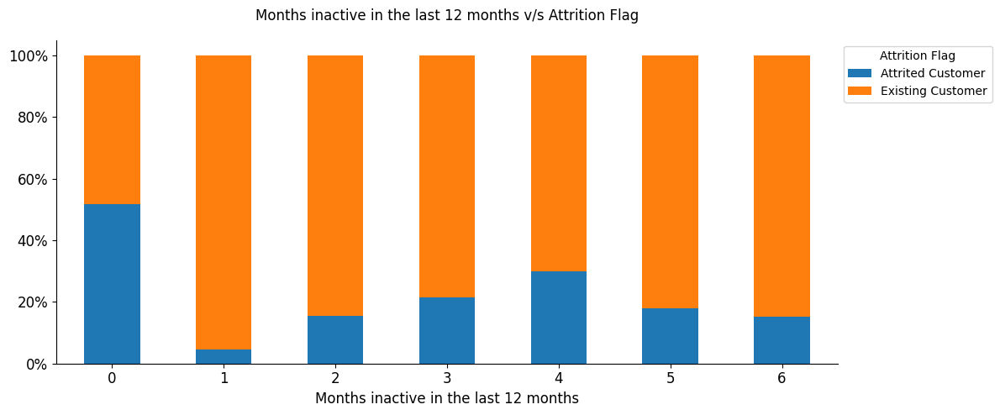

In [62]:
# Print a table with data where predictor is on x column and target is stacked
print_table(data, "Months_Inactive_12_mon", "Attrition_Flag")
print("-" * 120)

Title = "Months inactive in the last 12 months v/s Attrition Flag"  # define a meaningful tile
xlabel = "Months inactive in the last 12 months"                    # define a meaningful label of X-axis

# Stached a Custom Barplot
stacked_barplot(data, "Months_Inactive_12_mon", "Attrition_Flag", Title = Title, xlabel = xlabel)

**Observation**
- The attrition rate is high (around 50%) for customers who have been inactive, but there are only 29 such customers.
- Approximately 30% of customers inactive for 4 months, and around 20% of customers inactive for 3 months, have the highest attrition rates.

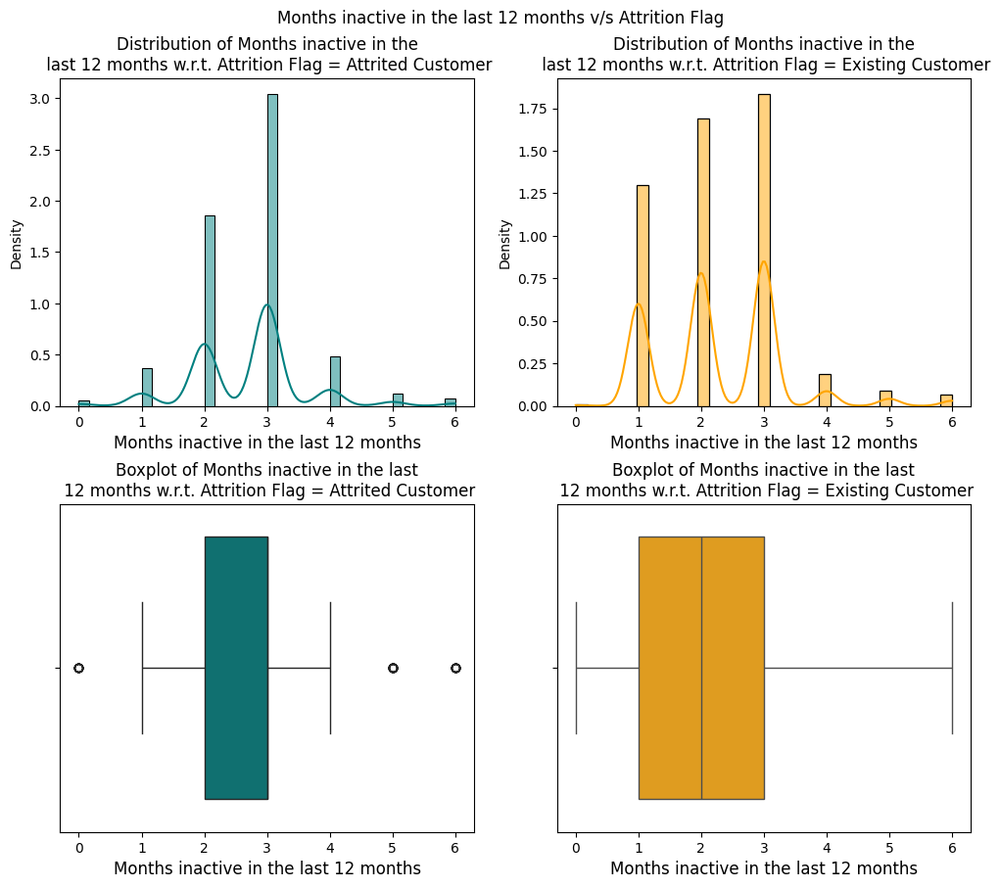

In [63]:
# Display a Distribution plot with Boxplot
distribution_plot_wrt_target(data, "Months_Inactive_12_mon", "Attrition_Flag", ked = True,
                             Title = Title, xlabel = xlabel,
                             Adjust_Title = True, Title_len_per_line = 40)

**Observation**
- Attrited customers have a median inactivity period of around 3 months, higher than the 2 months observed for existing customers.
- The highest number of attritions is observed among customers who have been inactive for 3 months within the last 12 months.

##### **Attrition vs Contacts_Count_12_mon (No. of Contacts in the last 12 months)**

╒═════════════════════════╤═════════════════════╤═════════════════════╤═══════╕
│ Attrition Flag          │   Attrited Customer │   Existing Customer │   All │
│ Contacts Count 12 mon   │                     │                     │       │
╞═════════════════════════╪═════════════════════╪═════════════════════╪═══════╡
│ 0                       │                   7 │                 392 │   399 │
├─────────────────────────┼─────────────────────┼─────────────────────┼───────┤
│ 6                       │                  54 │                   0 │    54 │
├─────────────────────────┼─────────────────────┼─────────────────────┼───────┤
│ 5                       │                  59 │                 117 │   176 │
├─────────────────────────┼─────────────────────┼─────────────────────┼───────┤
│ 1                       │                 108 │                1391 │  1499 │
├─────────────────────────┼─────────────────────┼─────────────────────┼───────┤
│ 4                       │             

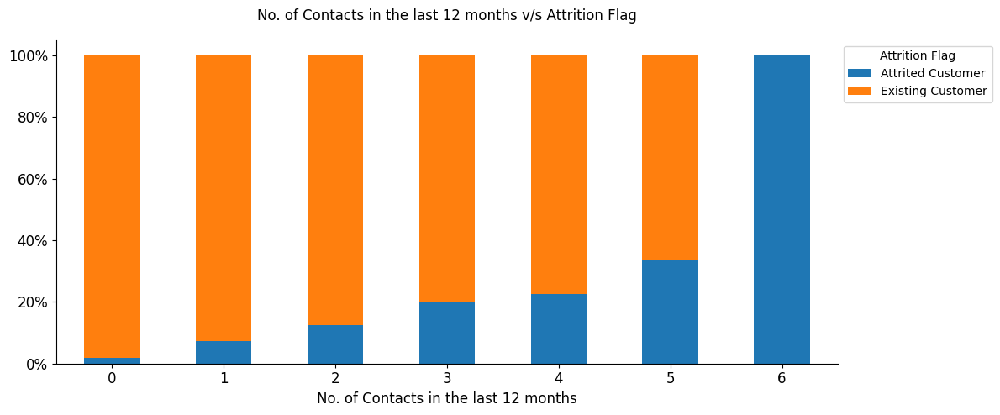

In [64]:
# Print a table with data where predictor is on x column and target is stacked
print_table(data, "Contacts_Count_12_mon", "Attrition_Flag")
print("-" * 120)

Title = "No. of Contacts in the last 12 months v/s Attrition Flag"  # define a meaningful tile
xlabel = "No. of Contacts in the last 12 months"                    # define a meaningful label of X-axis

# Stached a Custom Barplot
stacked_barplot(data, "Contacts_Count_12_mon", "Attrition_Flag", Title = Title, xlabel = xlabel)

**Observation**
- The attrition rate has a strong positive correlation with the number of customer contacts over the last 12 months. The more frequent the contacts, the higher the attrition rate.
- The attrition rate is 100% for customers (a total of 54) who were contacted 6 times.
- The attrition rate is less than 10% for customers who were never contacted or contacted only once in the last 12 months.

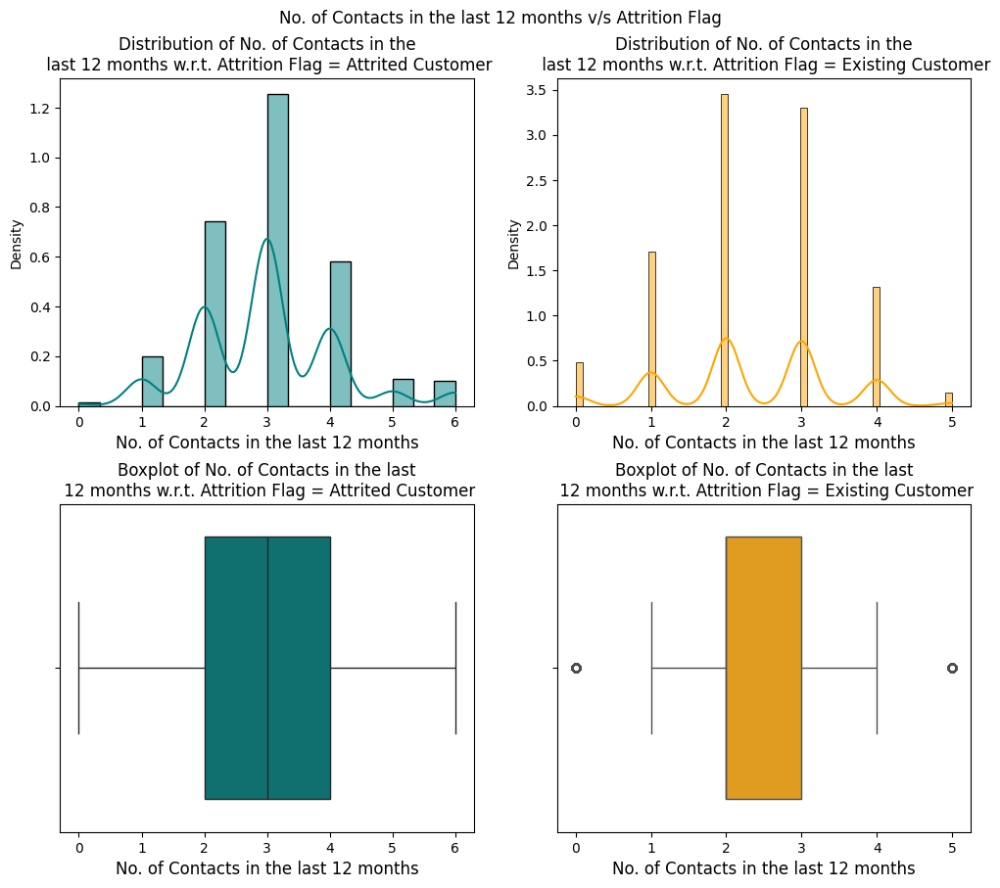

In [65]:
# Display a Distribution plot with Boxplot
distribution_plot_wrt_target(data, "Contacts_Count_12_mon", "Attrition_Flag", ked = True,
                             Title = Title, xlabel = xlabel,
                             Adjust_Title = True, Title_len_per_line = 40)

**Observation**: The median number of contacts in the last 12 months is 3 for attrited customers, compared to 2 for existing customers.

##### **Attrition vs Credit Limit on credit Cards**

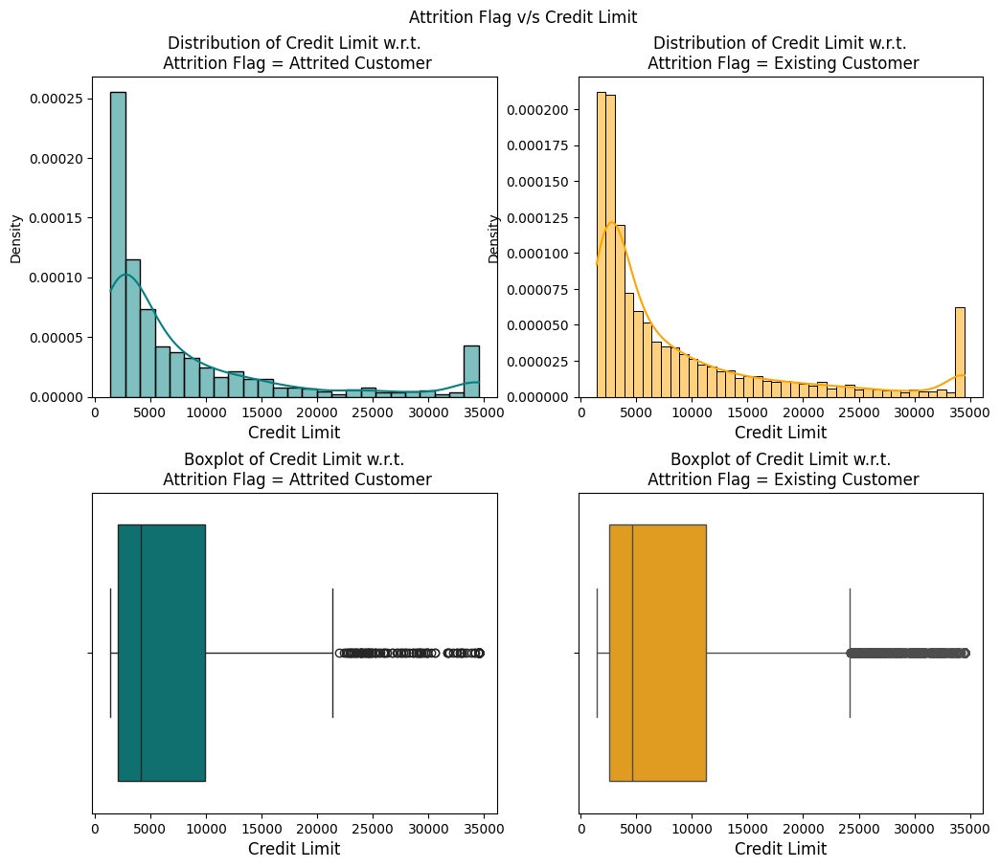

In [66]:
# Display a Distribution plot with Boxplot
distribution_plot_wrt_target(data, "Credit_Limit", "Attrition_Flag", ked = True,
                             Adjust_Title = True, Title_len_per_line = 40)

**Observation**
- The median credit limit of existing customers is higher compared to that of attrited customers, indicating a higher attrition rate among customers with lower credit limits.
- The credit limit distribution for both attrited and existing customers is heavily right-skewed, with numerous outliers above the upper boundary.
- The outliers for attrited customers suggest that a few customers with high credit limits also left the bank.

##### **Attrition vs Total Revolving Balance on the Credit Card**

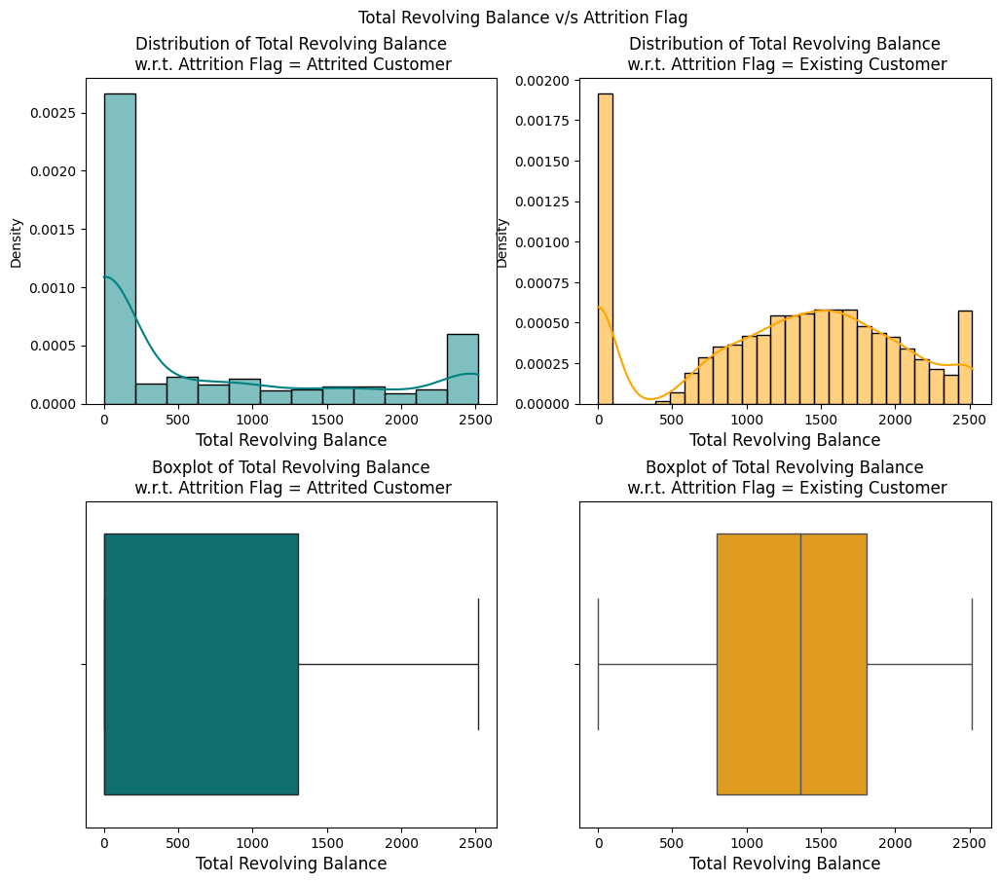

In [67]:
Title = "Total Revolving Balance v/s Attrition Flag"  # define a meaningful tile
xlabel = "Total Revolving Balance"                    # define a meaningful label of X-axis

# Display a Distribution plot with Boxplot
distribution_plot_wrt_target(data, "Total_Revolving_Bal", "Attrition_Flag", ked = True,
                             Title = Title, xlabel = xlabel,
                             Adjust_Title = True, Title_len_per_line = 40)

**Observation**: Most customers do not have any revolving balance or outstanding debt on their credit cards. Therefore, it is necessary to visualize trends specifically for customers who do have revolving balances.

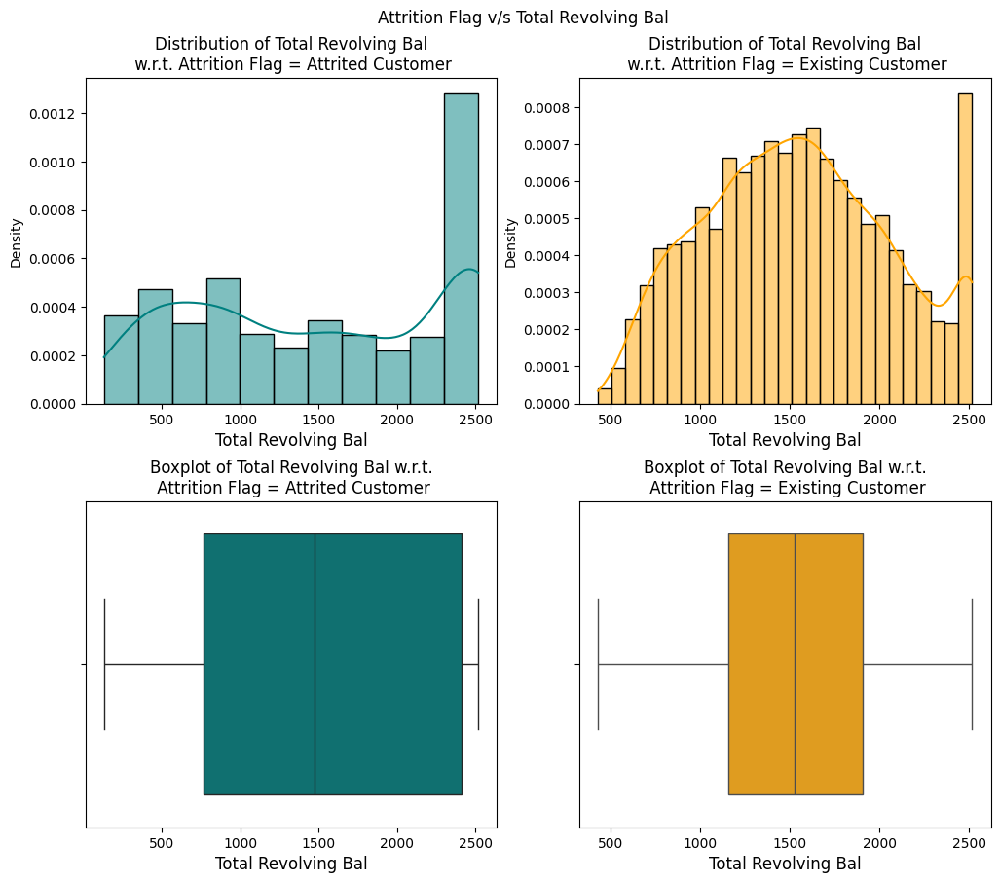

In [68]:
# Display a Distribution plot with Boxplot
distribution_plot_wrt_target(data.loc[data['Total_Revolving_Bal'] != 0], "Total_Revolving_Bal", "Attrition_Flag", ked = True,
                             Adjust_Title = True, Title_len_per_line = 40)

**Observation**
- The distribution of the Total Revolving balance for customers who left the bank is left-skewed.
- On average, the revolving balance is approximately \$1500 for customers who left the bank.
- The attrition rate is notably high among customers with a revolving balance exceeding \$2400.

##### **Attrition vs Open to Buy Credit Line Average of last 12 months: (Avg_Open_To_Buy)**

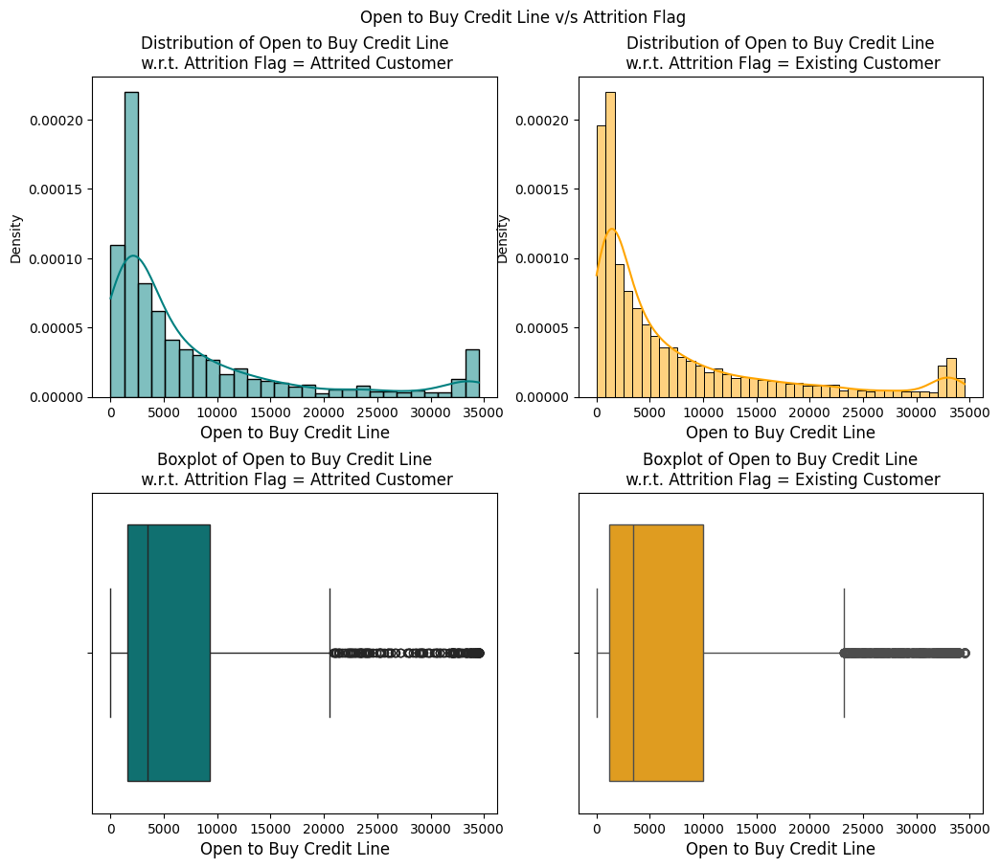

In [69]:
Title = "Open to Buy Credit Line v/s Attrition Flag"  # define a meaningful tile
xlabel = "Open to Buy Credit Line"                    # define a meaningful label of X-axis

# Display a Distribution plot with Boxplot
distribution_plot_wrt_target(data, "Avg_Open_To_Buy", "Attrition_Flag", ked = True,
                             Title = Title, xlabel = xlabel,
                             Adjust_Title = True, Title_len_per_line = 40)

**Observation**
- "Open to Buy Credit Line" refers to the amount of credit available for a cardholder to use on their credit card at any given time. The distribution of Open to Buy credit limits for both existing and attrited customers is heavily right-skewed, with many outliers above the upper boundary.
- The median value of the Open to Buy credit line is higher for existing customers, indicating that customers with a higher available credit amount (average of the last 12 months) are more likely to remain customers.
- The distribution has numerous outliers, suggesting that some customers left the bank despite having very high Open to Buy credit limits.

##### **Attrition vs Change in Transaction Amount (Q4 over Q1): (Total_Amt_Chng_Q4_Q1)**

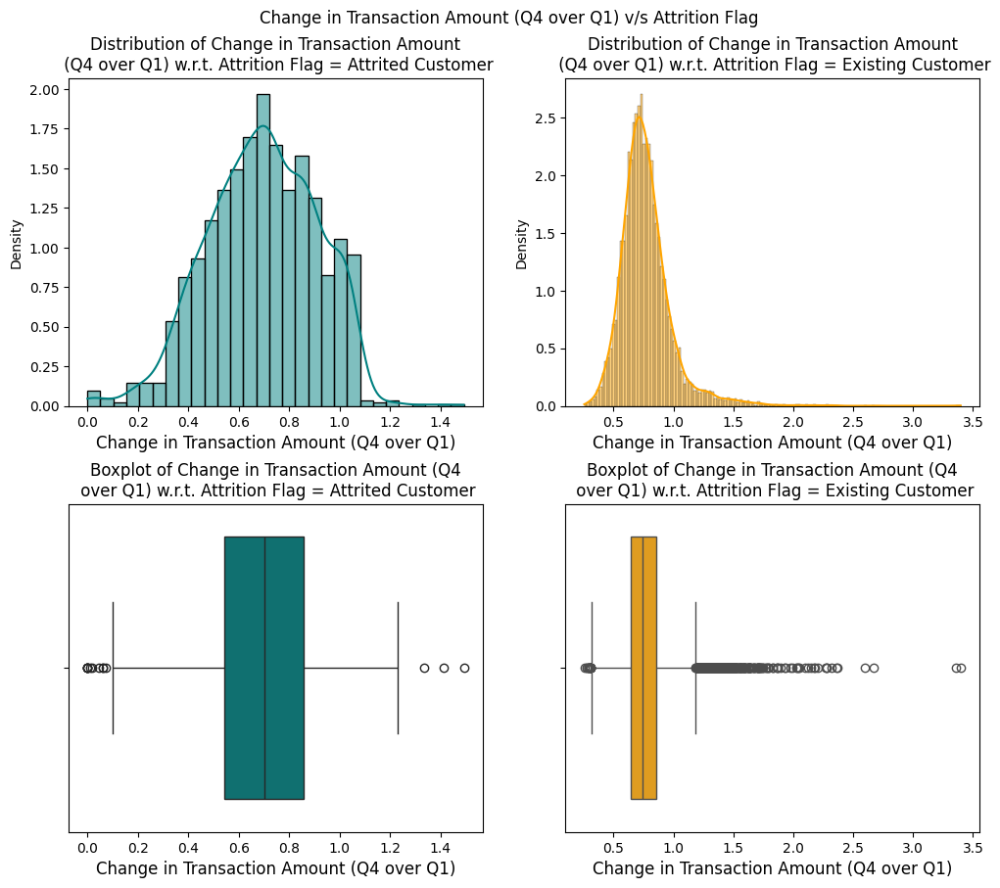

In [70]:
Title = "Change in Transaction Amount (Q4 over Q1) v/s Attrition Flag"  # define a meaningful tile
xlabel = "Change in Transaction Amount (Q4 over Q1)"                    # define a meaningful label of X-axis

# Display a Distribution plot with Boxplot
distribution_plot_wrt_target(data, "Total_Amt_Chng_Q4_Q1", "Attrition_Flag", ked = True,
                             Title = Title, xlabel = xlabel,
                             Adjust_Title = True, Title_len_per_line = 45)

**Observation**
- The median values for changes in Total Transaction amount from Q4 to Q1 are nearly equal for both attrited and existing customers.
- The distribution among existing customers exhibits significant outliers, suggesting that those with higher spending in Q4 compared to Q1 tend to remain with the bank.

##### **Attrition vs Change in Transaction Count (Q4 over Q1): (Total_Ct_Chng_Q4_Q1)**

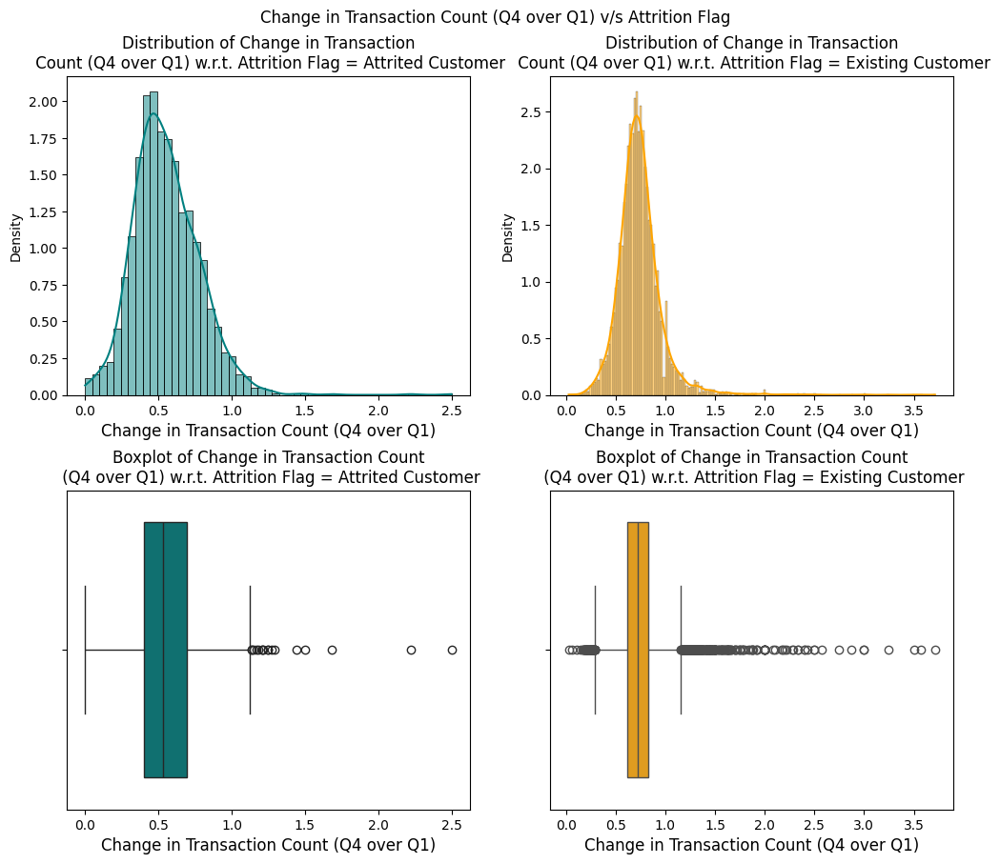

In [71]:
Title = "Change in Transaction Count (Q4 over Q1) v/s Attrition Flag"  # define a meaningful tile
xlabel = "Change in Transaction Count (Q4 over Q1)"                    # define a meaningful label of X-axis

# Display a Distribution plot with Boxplot
distribution_plot_wrt_target(data, "Total_Ct_Chng_Q4_Q1", "Attrition_Flag", ked = True,
                             Title = Title, xlabel = xlabel,
                             Adjust_Title = True, Title_len_per_line = 40)

**Observation**
- The median values for changes in Total Transaction count from Q4 to Q1 is higher for existing customers than for attrited customers, indicating that those who have higher usage of credit card in Q1 over Q4 are more likely to remain with the bank.
- The distribution among existing customers exhibits significant outliers, suggesting that those with higher usage of credit card in Q4 compared to Q1 tend to remain with the bank.

##### **Attrition vs Total Transaction Amount for last 12 months: (Total_Trans_Amt)**

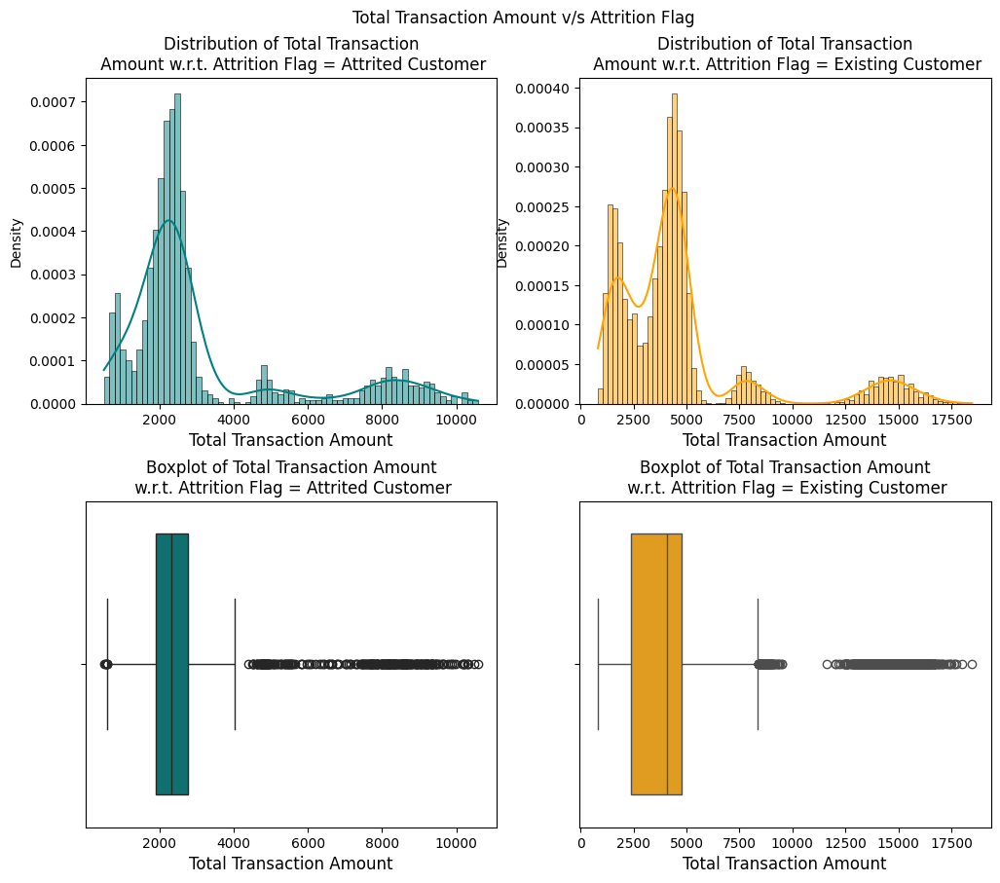

In [72]:
Title = "Total Transaction Amount v/s Attrition Flag"  # define a meaningful tile
xlabel = "Total Transaction Amount"                    # define a meaningful label of X-axis

# Display a Distribution plot with Boxplot
distribution_plot_wrt_target(data, "Total_Trans_Amt", "Attrition_Flag", ked = True,
                             Title = Title, xlabel = xlabel,
                             Adjust_Title = True, Title_len_per_line = 40)

**Observation**
- The distribution of the total Transaction Amounts exhibits a right-skewed pattern with numerous outliers and shows four peaks, indicating a quadrimodal distribution.
- The median value of transaction amount for attrited customers is lower compared to that of existing customers, suggesting that customers who spend more on their credit cards are more likely to stay with the bank.

##### **Attrition vs Total Transaction Count for last 12 months: (Total_Trans_Ct)**


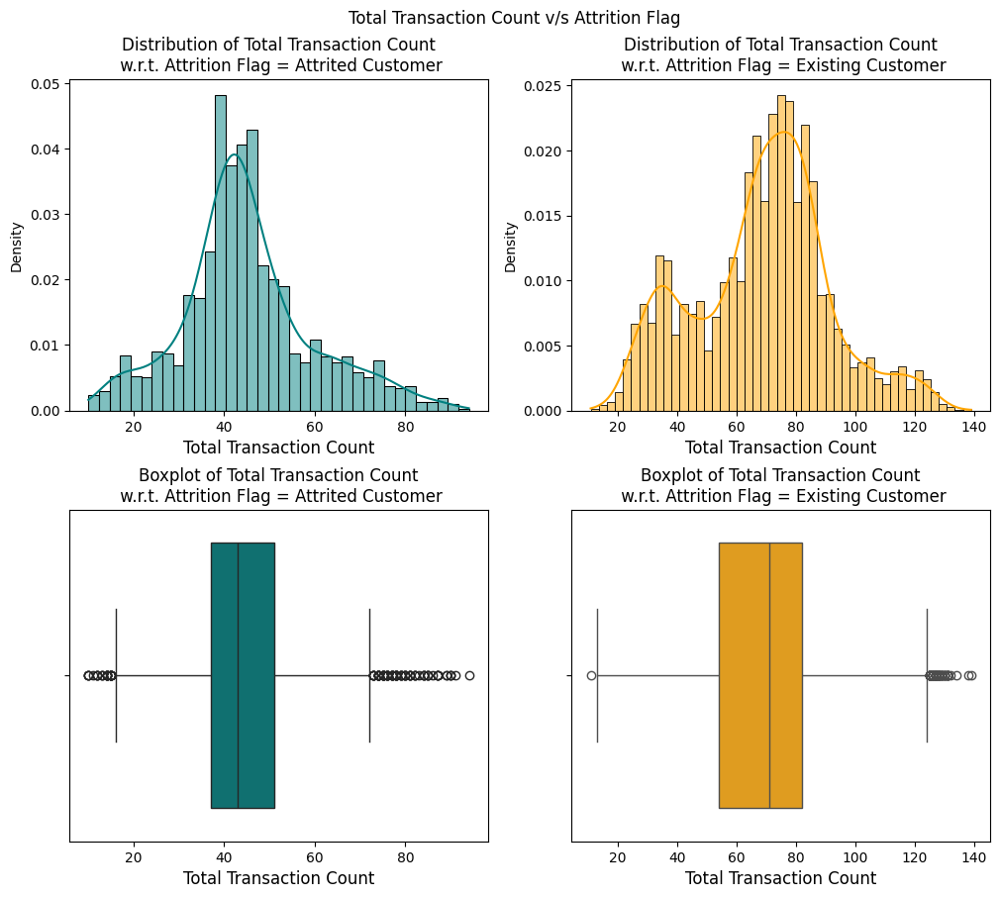

In [73]:
Title = "Total Transaction Count v/s Attrition Flag"  # define a meaningful tile
xlabel = "Total Transaction Count"                    # define a meaningful label of X-axis

# Display a Distribution plot with Boxplot
distribution_plot_wrt_target(data, "Total_Trans_Ct", "Attrition_Flag", ked = True,
                             Title = Title, xlabel = xlabel,
                             Adjust_Title = True, Title_len_per_line = 40)

**Observation**
- The lower median value of transaction count for attrited customers compared to existing customers suggests that customers with higher credit card usage are more likely to stay with the bank.

##### **Attrition vs Average Card Utilization Ratio**

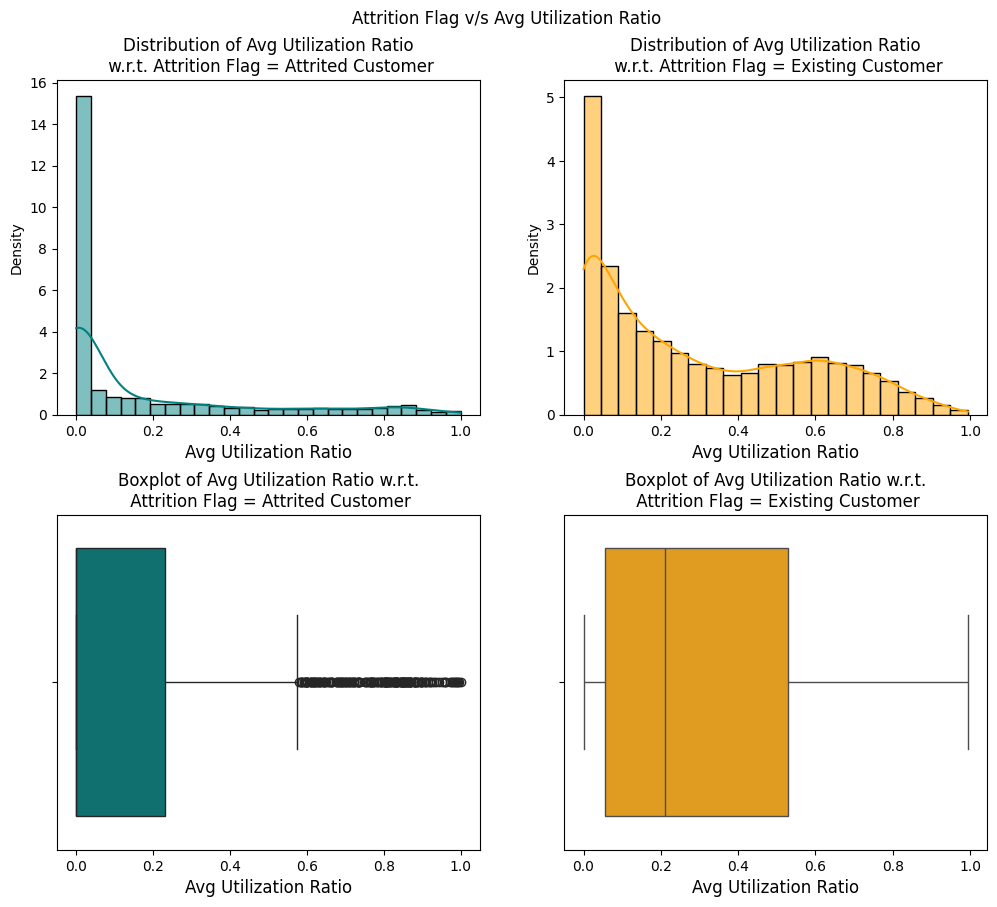

In [74]:
# Display a Distribution plot with Boxplot
distribution_plot_wrt_target(data, "Avg_Utilization_Ratio", "Attrition_Flag", ked = True,
                             Adjust_Title = True, Title_len_per_line = 40)

**Observation**
- The Average Card Utilization Ratio typically refers to the ratio of a credit card holder's balance to their credit limit across all their credit cards. The distribution of average Card Utilization Ratio for both attrited and existing customers is heavily right-skewed.
- The median of average card utilization for existing customers is higher than for attrited customers. This suggests that customers with higher utilization ratios are less likely to churn or leave the bank.

## Data Pre-processing


### Define Categorical Columns

In [75]:
# Define the Categorical Columns
cat_cols = [
    "Attrition_Flag",
    "Gender",
    "Education_Level",
    "Marital_Status",
    "Income_Category",
    "Card_Category",
]

# Convert the Categorical Columns
data[cat_cols] = data[cat_cols].astype("category")

### Target Encoding

In [76]:
# Check the unique values of Target veriable
data["Attrition_Flag"].value_counts()

Attrition_Flag
Existing Customer    8500
Attrited Customer    1627
Name: count, dtype: int64

**The target variable "Attrition_Flag" is categorical, therefore it needs to be encoded before it can be used in machine learning algorithms.**

In [77]:
from sklearn.preprocessing import LabelEncoder  # Import Label Encoder

label_encoder = LabelEncoder()     # Initiate Lavel Encoder

# label encode the target variable
data["Attrition_Flag"] = label_encoder.fit_transform(data["Attrition_Flag"])

In [78]:
data["Attrition_Flag"].value_counts()  # Check the unique values of Target veriable after Label encoding

Attrition_Flag
1    8500
0    1627
Name: count, dtype: int64

### Treat Incorrect Value

In [79]:
# chgeck the % of incorrect value in Income Catagory
data["Income_Category"].value_counts(normalize=True)

Income_Category
Less than $40K   0.352
$40K - $60K      0.177
$80K - $120K     0.152
$60K - $80K      0.138
abc              0.110
$120K +          0.072
Name: proportion, dtype: float64

11% of the data in the Income Category column is invalid and marked as **'abc'**. These values need to be replaced with a constant **'Unknown'**.

In [80]:
# replace values with missing
data["Income_Category"].replace(to_replace="abc", value = np.nan, inplace=True)

In [81]:
data["Income_Category"].value_counts()  # Check the unique values of Target veriable after Label encoding

Income_Category
Less than $40K    3561
$40K - $60K       1790
$80K - $120K      1535
$60K - $80K       1402
$120K +            727
Name: count, dtype: int64

### Feature Engineering

#### Eliminating Redundant Information

**Credit limit and average open-to-buy credit line are perfectly correlated, suggesting redundancy; consider dropping average open-to-buy feature.**

In [82]:
# Drop the 'Avg_Open_To_Buy' Column
try:
  data = data.drop(['Avg_Open_To_Buy'], axis=1)
  print("Avg_Open_To_Buy column dropped successfully.")
except KeyError:
  print(f"Column Avg_Open_To_Buy must already be dropped.")

Avg_Open_To_Buy column dropped successfully.


### Outlier Detection

#### Define Useful functions

In [83]:
# Display Boxplots of numerical columns to check outliers
def display_boxplots(data, txt = None, whis = 1.5, color = "lightgreen"):
  # Identify the number of numerical column
  numerical_columns = data.select_dtypes(include=[np.number]).columns

  fig, axs = plt.subplots(1,len(numerical_columns), figsize=(18, 8))

  # Loopthrough all the variables
  for i, variable in enumerate(numerical_columns):
    # Create a boxplot for each variable
    sns.boxplot(data[variable], whis = whis, ax = axs[i], color = color)
    axs[i].set_title(variable.replace("_", " "))                          # Set the title of the Box plot
    axs[i].set_ylabel('')                                                 # Remove y-axis label

    # Caculate lower Whisker, Upper Whisker and no of outliers
    lower, upper, outlier_count = calculate_whiskers_and_outliers(data, variable)

    percentage_outliers = "{:.2f}".format(outlier_count / len(data[variable]) * 100)      # Calculate % of Outliers

    # Add text to the plot
    text = f"Lower Whisker: {lower}\nUpper Whisker: {upper}\nNumber of outliers: {outlier_count}\n% of outliers: {percentage_outliers}%"
    axs[i].text(0.05, -0.11, text, fontsize=10, ha='left', va='bottom', transform=axs[i].transAxes)  #

  plt.subplots_adjust(wspace=0.1)  # Adjust the spacing between subplots as needed
  plt.tight_layout()
  plt.show()  # Display the plot

In [84]:
# Function to calculate whiskers and count outliers
def calculate_whiskers_and_outliers(data, column_name):
    # Calculate quartiles
    Q1 = data[column_name].quantile(0.25)
    Q3 = data[column_name].quantile(0.75)

    # Calculate IQR and whiskers
    IQR = Q3 - Q1
    lower_whisker = Q1 - 1.5 * IQR
    upper_whisker = Q3 + 1.5 * IQR

    # Count outliers
    outliers =(data[column_name] < lower_whisker) | (data[column_name] > upper_whisker)
    outlier_count = outliers.sum()  # Sum of True values gives the count of outliers

    return round(lower_whisker, 2), round(upper_whisker,2), outlier_count

In [85]:
# functions to treat outliers by flooring and capping
def treat_outliers(df, col):
    # identify the outliers
    Lower, Upper = calculate_whiskers(df, col)

    # all the values smaller than Lower_Whisker will be assigned the value of Lower_Whisker
    # all the values greater than Upper_Whisker will be assigned the value of Upper_Whisker
    df[col] = np.clip(df[col], Lower, Upper)

    return df

In [86]:
# Function to treat outliers for all the columns
def treat_outliers_all(df, col_list):
  for c in col_list:
    df = treat_outliers(df, c)

#### Outlier Visualization

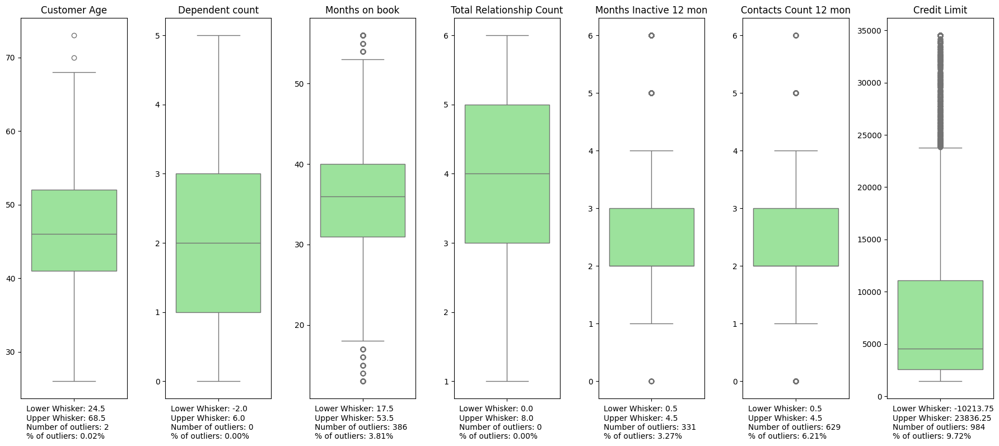

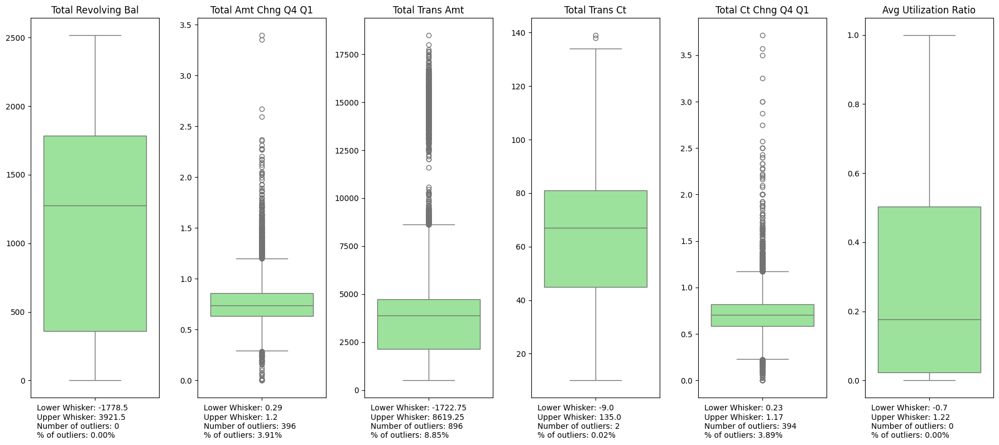

In [87]:
# Display Boxplot of numerical columns before outlier treatment
display_boxplots(data.select_dtypes(include=['number']).iloc[:, 1:8])
display_boxplots(data.select_dtypes(include=['number']).iloc[:, 8:])

**The following columns contain outliers; however, they should not be adjusted as these data points represent real customer data. Moreover, decision tree-based models, which will be utilized subsequently, are not adversely impacted by outliers.**

- *'Customer_Age'*
- *'Months_on_book'*
- *'Months_Inactive_12_mon'*
- *'Contacts_Count_12_mon'*
- *'Credit_Limit'*
- *'Total_Amt_Chng_Q4_Q1'*
- *'Total_Trans_Amt'*
- *'Total_Trans_Ct'*
- *'Total_Ct_Chng_Q4_Q1'*


### Split the Data in Train, Test and Validation Set

In [88]:
# Split the dataset into independent and dependent variables
X = data.drop(["Attrition_Flag"], axis=1)
y = data["Attrition_Flag"]

In [89]:
# Import Library to tune different models
from sklearn.model_selection import train_test_split

# Function to split data into training, validation, and test sets
def split_data(X, y, test_size = 0.2, val_size  =0.25, random_state = 1, stratify = None):
  # Splitting data into training, validation, and test sets
  X_temp, X_test, y_temp, y_test = train_test_split(
     X, y, test_size = test_size, random_state = random_state, stratify=stratify
  )

  X_train, X_val, y_train, y_val = train_test_split(
     X_temp, y_temp, test_size=val_size/(1-test_size),  # Adjusting val_size to be a fraction of the training set
     random_state=random_state, stratify=y_temp
  )

  return X_train, X_val, X_test, y_train, y_val, y_test

In [90]:
# Splitting data in train, validation and test sets
X_train, X_val, X_test, y_train, y_val, y_test = split_data(X, y, test_size = 0.2, val_size = 0.25, random_state = 1, stratify = y)

# Print information about the split
print("Data split into:")
print("Train set:", X_train.shape, y_train.shape)
print("Validation set:", X_val.shape, y_val.shape)
print("Test set:", X_test.shape, y_test.shape)

Data split into:
Train set: (5569, 18) (5569,)
Validation set: (2532, 18) (2532,)
Test set: (2026, 18) (2026,)


### Missing Value Imputation




In [91]:
# Check for missing values in the dataset
data.isna().sum()[data.isna().sum() > 0]

Education_Level    1519
Marital_Status      749
Income_Category    1112
dtype: int64

In [92]:
from sklearn.impute import SimpleImputer    # Import the Library of Simple Imputer

# creating an instace of the imputer to be used
imputer = SimpleImputer(missing_values=np.nan, strategy="most_frequent")

# Identify the columns with missing values
cols_to_impute = ["Education_Level", "Marital_Status", "Income_Category"]

# fit and transform the imputer on train data
X_train[cols_to_impute] = imputer.fit_transform(X_train[cols_to_impute])

# Transform on validation and test data
X_val[cols_to_impute] = imputer.transform(X_val[cols_to_impute])

# fit and transform the imputer on test data
X_test[cols_to_impute] = imputer.transform(X_test[cols_to_impute])

In [93]:
# check for missingness in all 3 dataset
np.nan in X_train, np.nan in X_val, np.nan in X_test

(False, False, False)

### One Hot Encoding


In [94]:
# Apply One Hot Encoding on categorical variables
X_train = pd.get_dummies(data=X_train, drop_first=True)
X_val = pd.get_dummies(data=X_val, drop_first=True)
X_test = pd.get_dummies(data=X_test, drop_first=True)

In [95]:
# Check the shape of the columns after One Hot Encoding
print("Train set:", X_train.shape, y_train.shape)
print("Validation set:", X_val.shape, y_val.shape)
print("Test set:", X_test.shape, y_test.shape)

Train set: (5569, 28) (5569,)
Validation set: (2532, 28) (2532,)
Test set: (2026, 28) (2026,)


## Model Building

### Model evaluation criterion

The nature of predictions made by the classification model will translate as follows:

- **True positives (TP)** are failures correctly predicted by the model.
- **False negatives (FN) or Type II Error** are real failures in a generator where there is no detection by model.
- **False positives (FP) or Type I Error** are failure detections in a generator where there is no failure.

**Which metric to optimize?**

* We need to choose the metric which will ensure that the maximum number of generator failures are predicted correctly by the model.
* We would want Recall to be maximized as greater the Recall, the higher the chances of minimizing false negatives.
* We want to minimize false negatives because if a model predicts that a machine will have no failure when there will be a failure, it will increase the maintenance cost.

### Define Useful Functions

First, let's create set of functions so that we don't have to use the same code repeatedly for each model.

* Set of Functions to Train Models
* Set of Functions to Evaluate Model Performance
* Set of Functions to Display Model Performance
* Set of Functions to Display Model Performance graphs and charts (e.g. Confusion Matrics, AUC, ROC Curves)
* Useful Function to Sampling Data
* Other Useful Functions

#### Useful Functions to Train Models

In [96]:
# Function to train and evaluate models
def train_multiple_models(model_class, model_list, X_TRAIN, y_TRAIN, X_val, y_val, params = None):
    """
    Parameters:   - model_class (class): Class of the machine learning model (e.g., DecisionTreeClassifier, RandomForestClassifier).
                  - model_name_list (list): List of model names to train and evaluate.
                  - params (dict): Dictionary of best parameters for each model.
                  - X_TRAIN (dict): Dictionary containing training data for each model.
                  - y_TRAIN (dict): Dictionary containing target labels for each model.
                  - X_val (array-like): Validation data.
                  - y_val (array-like): Validation labels.
    Returns:      - models (dict): Dictionary of trained models.
    """
    models = {param: None for param in model_name_list} # define a dictionary of trained models

    # Loop through all the models
    for name in model_list:
        print(f"Training Initiated for {name.replace('-', ' with ')}...")  # Print a message to indicate the start of tuning
        start_time = time.time()                          # Start the timer
        models[name] = model_class(   # Initiate the model with the best parameters
            **(params[name] if params is not None else {}),
            random_state=random_state
        )
        models[name].fit(X_TRAIN[name], y_TRAIN[name])    # Train the model

        duration = time.time() - start_time               # Calculate the duration of tuning
        # Print a message to indicate the end of tuning
        print(f"Training Completed for {name.replace('-', ' with ')}. Total Time taken: {duration:.2f} seconds")

    return models   # Return the tunes models

#### Useful Functions to Evaluate Models

In [97]:
# Evaluate multiple machine learning models
def evaluate_multiple_models(models, model_list, X_TRAIN, y_TRAIN, X_val, y_val):
    """
    Parameters:   - models (dict): Dictionary of trained models.
                  - model_name_list (list): List of model names to evaluate.
                  - X_TRAIN (dict): Dictionary containing training data for each model.
                  - y_TRAIN (dict): Dictionary containing target labels for each model.
                  - X_val (array-like): Validation data.
                  - y_val (array-like): Validation labels.
    Returns:      - train_perf (dict): Dictionary of performance metrics on the training set.
                  - val_perf (dict): Dictionary of performance metrics on the validation set.
    """
    # Initialize dictionaries to store training and validation performance metrics
    train_perf = {param: None for param in model_name_list}   # Define a dictionary to store training performance metrics
    val_perf = {param: None for param in model_name_list}     # Define a dictionary to store validation performance metrics

    # Loop through all the models
    for name in model_list:
        # Evaluate the model on the training and validation sets
        train_perf[name] = model_performance_classification_sklearn(models[name], X_TRAIN[name], y_TRAIN[name])
        val_perf[name] = model_performance_classification_sklearn(models[name], X_val, y_val)

    return train_perf, val_perf  # Return the training and validation performance metrics

In [98]:
from sklearn.metrics import(          # Import the necessary libraries
    accuracy_score,
    recall_score,
    precision_score,
    f1_score,
)

# Function to compute different metrics to check performance of a classification model built using sklearn
def model_performance_classification_sklearn(model, predictors, target):
    """
    Function to compute different metrics to check classification model performance

    model: classifier
    predictors: independent variables
    target: dependent variable
    """
    pred = model.predict(predictors)    # predicting using the independent variables

    # evaluating the model performance
    acc = accuracy_score(target, pred)          # to compute Accuracy
    recall = recall_score(target, pred)         # to compute Recall
    precision = precision_score(target, pred)   # to compute Precision
    f1 = f1_score(target, pred)                 # to compute F1-score

    # creating and return a dataframe of metrics
    return pd.DataFrame(
        {"Accuracy": acc, "Recall": recall, "Precision": precision, "F1 Score": f1},
        index=[0],
    )

#### Useful Functions to Display Model Performance

In [99]:
# Display performance metrics for a given machine learning model on a specified set (e.g., Training or Validation).
def display_model_performance(model_class, perf, Set, display = False):
    """
    Parameters:   - model_class (class): Class of the machine learning model.
                  - perf (dict): Dictionary containing performance metrics for the model.
                  - Set (str): Name of the performance set (e.g., 'Training', 'Validation').
    """
    model_name = model_class.__name__  # Get the model name as a string
    df = model_performance_summary(perf, Set, perf_column)  # Get the model performance summary

    # Display the performance summary of the model on the specified set
    display_grid(
        f"{model_name} {Set} performance:",     # Caption for the display
        Bold = True,                                                  # Display the caption in Bold
        df = df        # Call the function to get the model performance summary
    ) if display else None

    return df

In [100]:
from IPython.display import Markdown, display  # Import the Library

# Displays a caption in Markdown format and a DataFrame
def display_grid(caption, df, Bold=False):
    """
    Parameters:   - caption (str): Caption to display.
                  - df (DataFrame): DataFrame to display.
                  - Bold (bool, optional): Flag to display the caption in bold. Default is False.

    """
    # Display the caption in bold if Bold is True, otherwise in regular font
    display(Markdown(f"**{caption}**")) if Bold else display(Markdown(caption))

    display(df)   # Display the DataFrame

In [101]:
# Summarizes performance metrics for multiple models into a DataFrame
def model_performance_summary(perf, Set, columns):
    """
    Parameters:   - perf (dict): Dictionary containing performance metrics for each model.
                  - Set (str): Name of the performance set (e.g., 'Training', 'Validation').
                  - columns (list): List of column names in the desired order for the DataFrame.
    Returns:      - pd.DataFrame: Concatenated DataFrame summarizing performance metrics for all models.
    """
    df_list = []  # Initialize an empty list to store DataFrames

    # Loop through each model and its performance metrics
    for model_name, metrics in perf.items():
        # Add 'Model' and 'Set' columns to the metrics dictionary
        metrics['Model'] = model_name.replace('-', 'with')   # Add 'Model' column to the metrics dictionary
        metrics['Set'] = Set            # Add 'Set' column with value specified by 'Set'

        # Create a DataFrame from the metrics dictionary and then reorder columns
        df = pd.DataFrame(metrics, index=[0])[columns]
        df_list.append(df)  # Append each DataFrame to the list

    # Concatenate all DataFrames into a single DataFrame and return
    return pd.concat(df_list, ignore_index=True)

#### Useful Functions to Display Model Performance Matrics & Graphs

In [102]:
from sklearn.metrics import confusion_matrix    # Import the necessary libraries

# function to plot the confusion_matrix
def confusion_matrix_sklearn(pred, target):
    """
    To plot the confusion_matrix with percentages

    model: classifier
    predictors: independent variables
    target: dependent variable
    """
    caption = [
                "True Negative (TN)",
                "False Positive (FP)\n Type I Error",
                "False Negative (FN) \n Type II Error",
                "True Positive (TP)",
               ]

    # predicting using the independent variables
    cm = confusion_matrix(target, pred)   # build the Confusion Matrix

    labels = np.asarray(                    # define the lebels for the Matrix
        [
            ["{0:0.0f}\n".format(item) + "{0:.2%}\n".format(item / cm.flatten().sum()) + caption[index]]
            for index, item in enumerate(cm.flatten())
        ]
    ).reshape(2, 2)

    # Display the confusion Matrix
    plt.figure(figsize=(8, 6))                                          # set the figure size
    sns.heatmap(cm, annot = labels, fmt="", annot_kws={"size": 12})     # plot the confusion matrix
    plt.ylabel("Actual Values", fontsize = 15)                          # set the y-axis label
    plt.xlabel("Predicted Values", fontsize = 15)                       # set the x-axis label
    plt.xticks([0.5, 1.5], ['Negative', 'Positive'])                    # set the x-axis tick labels
    plt.yticks([0.5, 1.5], ['Negative', 'Positive'], rotation=90)       # set the y-axis tick labels
    plt.show()                                                          # show the plot

In [103]:
# Define metadata for model performance plots
model_metadata = {
    # ROC Curve metadata
    'ROC':  {
        'title': 'ROC Curve',                               # Title of the ROC curve plot
        'xlabel': 'False Positive Rate (Specificity -1)',   # Label for the x-axis
        'ylabel': 'True Positive Rate (Sensitivity)',       # Label for the y-axis
        'base_legend': 'Baseline',                          # Legend for the baseline curve
        'model_legend': 'Model',                            # Legend for the model curve
    },
    # Cumulative Accuracy Profile (CAP) metadata
    'CAP': {
        'title': 'Cumulative Accuracy Profile (CAP)',       # Title of the CAP plot
        'xlabel': 'Number of Observations',                 # Label for the x-axis
        'ylabel': 'Cumulative Accuracy',                    # Label for the y-axis
        'base_legend': 'Random Model',                      # Legend for the baseline curve
        'model_legend': 'Model',                            # Legend for the model curve
    },
}

In [104]:
from sklearn.metrics import roc_curve, roc_auc_score  # Import the necessary libraries

def calculate_roc_curve(target, probs):
    """Compare machine learning model to baseline performance.
    Computes statistics and shows ROC curve."""

    # Calculate false positive rates and true positive rates for the ROC curves
    base_fpr, base_tpr, _ = roc_curve(target, [1 for _ in range(len(target))])
    model_fpr, model_tpr, _ = roc_curve(target, probs)

    # return a dictionary containing the false positive rates and true positive rates for the baseline and the model.
    return {"base_fpr": base_fpr, "base_tpr": base_tpr, "model_fpr": model_fpr, "model_tpr": model_tpr}

In [105]:
def calculate_CAP(y_true, y_score):
    """Calculate the Cumulative Accuracy Profile (CAP) curve."""

    # Combine true labels and predicted scores
    combined = np.array(sorted(zip(y_score, y_true), reverse=True))

    total_positives = np.sum(y_true)            # Total positive instances
    total_instances = len(y_true)               # Total instances
    cum_positives = np.cumsum(combined[:, 1])   # Cumulative sum of positive instances

    # Cumulative percentage of total instances
    cum_percent_instances = np.arange(1, total_instances + 1) / total_instances

    # Calculate CAP curve
    CAP_x = cum_percent_instances
    CAP_y = cum_positives / total_positives

    return {"base_fpr": [0,1], "base_tpr": [0,1], "model_fpr": CAP_x, "model_tpr": CAP_y}

In [106]:
def draw_performance_curve (curve, type):
  # Plot the ROC curve
  plt.figure(figsize=(8, 6))
  plt.rcParams['font.size'] = 12

  plt.plot(curve['base_fpr'], curve['base_tpr'], 'b', label='baseline')
  plt.plot(curve['model_fpr'], curve['model_tpr'], 'r', label='model')

  plt.legend()
  plt.title(model_metadata[type]['title'])
  plt.xlabel(model_metadata[type]['xlabel'])
  plt.ylabel(model_metadata[type]['ylabel'])

  # Hide the top and right spines (borders)
  plt.gca().spines['top'].set_visible(False)
  plt.gca().spines['right'].set_visible(False)

  plt.show()    # Display the plot

In [107]:
def plot_side_by_side(plots, type, figsize=(15, 6)):
    """Plot two plots side by side."""

    plt.figure(figsize=figsize);           # Set the figure size
    fig, axs = plt.subplots(1, 2, figsize = figsize);  # Create a figure and a set of subplots

    for i in range(2):
      axs[i].plot(plots[i]['base_fpr'], plots[i]['base_tpr'], 'b', label = model_metadata[type[i]]['base_legend'], linestyle = '--');
      axs[i].plot(plots[i]['model_fpr'], plots[i]['model_tpr'], 'r', label = model_metadata[type[i]]['model_legend']);
      axs[i].legend();
      axs[i].set_title(model_metadata[type[i]]['title']);
      axs[i].set_xlabel(model_metadata[type[i]]['xlabel']);
      axs[i].set_ylabel(model_metadata[type[i]]['ylabel']);
      axs[i].spines['top'].set_visible(False);
      axs[i].spines['right'].set_visible(False);

    fig.suptitle("Performance Curves", fontsize = 14, y = 1)  # Assign a Suitable Title to the Plot
    fig.subplots_adjust(wspace=0.3);      # Add some space between the subplots
    plt.show();                # Show the plot

In [108]:
# Function to visualize the performance of Training and Validation Set for Models
def Visualize_Perf_compariason(data ,perf,
                               kind = "bar",
                               title = None,
                               xlabel = None,
                               fontsize = 10,
                               width = 6,degree = 0,
                               legend_pos = None):
  ncols = len(perf)  # Number of columns to display
  spines_pos = ['top', 'right','left']  # Set the spines to be visible

  # Create a figure and axes object
  fig, axes = plt.subplots(ncols = ncols, figsize = (width*ncols,6))
  xlabel = "Model" if xlabel is None else xlabel   # set xLabel

  # Loop through each column in the DataFrame
  for i, column in enumerate(perf):
    # Set y-axis limits based on the lowest value of Recall
    lower = (np.min(data[column]) - 0.025)  # Set the lower boundary of ylim
    upper = (np.max(data[column]) + 0.05)   # Set the upper boundary of ylim
    title = f"Compare the {column} of Training vs Validation sets" if title is None else title      # set title

    # Plot the bar chart for the current column
    data[column].plot(kind = kind, ax = axes[i])        # Plot the bar chart for the current column
    axes[i].set_title(title)                            # Set the title of the plot
    axes[i].set_xlabel(xlabel, fontsize = fontsize)                          # Set the x-axis label
    axes[i].set_ylabel(column, fontsize = fontsize)                          # Set the y-axis label
    axes[i].set_ylim(lower, upper)                      # Set the y-axis limits
    axes[i].legend(fontsize='small')
    axes[i].legend(fontsize='small', bbox_to_anchor = legend_pos)
                                                        # Set the legend font size
    axes[i].set_xticklabels(axes[i].get_xticklabels(),  # Set the x-axis tick labels
                            rotation = degree, ha='right', fontsize = fontsize)
    axes[i].set_yticklabels(axes[i].get_yticklabels(), fontsize = fontsize)
                                                        # Set the y-axis tick labels
    # Hide the specified spine
    [axes[i].spines[pos].set_visible(False) for pos in spines_pos]

  plt.tight_layout() # Adjust the layout of the subplots
  plt.show()         # Display the plot

#### Useful Function to Sampling Data

In [109]:
# Synthetic Minority Over Sampling Technique
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler

sampling_strategy = 1  # Oversample the minority class by a factor of 1

# Perform sampling on the training data based on the specified sampling type
def sampling_data(X_train, y_train, sampling_type):
  """
  Parameters:   - X_train: Features of the training data
                - y_train: Labels of the training data
                - sampling_type: Type of sampling ("Over" for oversampling, "Under" for undersampling)
                - sampling_strategy: Sampling ratio for the minority class (default is 1, meaning no change)
  Returns:      - X_resampled: Resampled features
                - y_resampled: Resampled labels
  """
  # For Over Sampling apply Synthetic Minority Over Sampling Technique
  # For Under Sampling apply Random undersampler for under sampling the data
  sm = SMOTE(sampling_strategy = sampling_strategy, k_neighbors = 5, random_state = random_state
             ) if sampling_type == "Over" else RandomUnderSampler(
                 random_state = random_state, sampling_strategy = sampling_strategy
                 )
  x_train_sampled, y_train_sampled = sm.fit_resample(X_train, y_train)

  # Print the number of samples in the training and test datasets before and after applying Understampling techniques
  print(f"Before {sampling_type} Sampling, counts of label '1 - Existing Customers': {sum(y_train == 1)}")
  print(f"Before {sampling_type} Sampling, counts of label '0 - Attrited customers': {sum(y_train == 0)}\n")

  print(f"After {sampling_type} Sampling, counts of label '1 - Existing Customers': {sum(y_train_sampled == 1)}\n")
  print(f"After {sampling_type} Sampling, counts of label '0 - Attrited customers': {sum(y_train_sampled == 0)}\n")

  print(f"After {sampling_type} Sampling, the shape of train_X: {x_train_sampled.shape}")
  print(f"After {sampling_type} Sampling, the shape of train_y: {x_train_sampled.shape}\n")

  return x_train_sampled, y_train_sampled

#### Other Useful Functions

In [110]:
# Create dictionaries mapping each model name to its corresponding training data DataFrame.
def dict_trainings_data(model_names, df):
    """
    Args:     - model_names (list of lists): List containing lists of model names for different datasets (e.g., original, oversampled, undersampled).
              - df (DataFrame): DataFrame for original data.
              - df_over (DataFrame): DataFrame for oversampled data.
              - df_under (DataFrame): DataFrame for undersampled data.
    Returns:  - dict_df (dict): Dictionary mapping each model name to its corresponding DataFrame.
    """
    dict_df = {}  # Create an empty dictionary to store the DataFrames

    for names in model_names:
        for model, data in zip(names, df):
            dict_df[model] = data

    return dict_df  # Return the dictionary of DataFrames

In [111]:
# Visualizing feature importances using a horizontal bar chart
def visualazing_feature_importances(importances, indices, feature_names, color = "lightblue"):
  plt.figure(figsize=(15, 12))          # Create a new figure for the plot with a specified size
  plt.title("Feature Importances")      # Set the title of the plot

  # Create a horizontal bar chart with the feature importances
  plt.barh(range(len(indices)), importances[indices], color = color, align="center")

  # Set the labels for the y-axis (the feature names)
  plt.yticks(range(len(indices)), [feature_names[i] for i in indices])

  plt.xlabel("Relative Importance")       # Set the label for the x-axis
  plt.show()

### Build Models

Following 5 intial Models will created -
* **Decision Tree Classifier**
* **Random Forest Classifier**
* **Bagging Classifier**
* **Adaptive Boost Classifier**
* **XGBoost Classifier**

#### Models Trained with Original Data

##### Build the Models

In [112]:
# Define the Liberaries
from sklearn.tree import DecisionTreeClassifier          # Import DecisionTreeClassifier from sklearn.tree module
from sklearn.ensemble import RandomForestClassifier      # Import RandomForestClassifier from sklearn.ensemble module
from sklearn.model_selection import RandomizedSearchCV   # Import RandomizedSearchCV from sklearn.model_selection module
from sklearn.ensemble import BaggingClassifier           # Import BaggingClassifier from sklearn.ensemble module
from sklearn.ensemble import AdaBoostClassifier          # Import AdaBoostClassifier from sklearn.ensemble module
from xgboost import XGBClassifier                        # Import XGBClassifier from xgboost module

from sklearn.model_selection import RandomizedSearchCV    # To do hyperparameter tuning
from sklearn import metrics                               # Make sure to import the metrics module

random_state = 1    # Define Random State to apply on all the Models

# Define heading of Dataframe which will capture the performance parameter against different Models
perf_column = ['Model', 'Set', 'Accuracy', 'Recall', 'Precision', 'F1 Score']

# Define base classifier models
base_models = [
    DecisionTreeClassifier,
    RandomForestClassifier,
    BaggingClassifier,
    AdaBoostClassifier,
    XGBClassifier,
    ]

In [113]:
# Define the models name for the original data
# model_names_original (list of lists): List containing lists of model names for different datasets (e.g., original, oversampled, undersampled).
model_names_original = [
    ["Decision Tree Classifier - Original Data"],
    ["Random Forest Classifier - Original Data"],
    ["Bagging Classifier - Original Data"],
    ["Adaboost Classifier - Original Data"],
    ["XGBoost Classifier - Original Data"],
]

In [114]:
import time  # Import the time module for measuring execution time

models_original = {}  # Initialize an empty dictionary to store the models
train_perf_origin = {}       # Initialize an empty dictionary to store the training performance metrics
val_perf_origin = {}         # Initialize an empty dictionary to store the validation performance metrics

# Create dictionaries mapping each model to its corresponding training data
X_TRAIN = dict_trainings_data(model_names_original, [X_train])
y_TRAIN = dict_trainings_data(model_names_original, [y_train])

Time = 0.0# Start the timer

# Loop through each model
for model_class, model_name_list in zip(base_models, model_names_original):
    model_class_name = model_class.__name__   # Get the model name as a string

    # Create a list of tuples containing model names and instances
    model_list = [(name, model_class(random_state = random_state)) for name in model_name_list]

    print(f"Training initiated for {model_class_name}...\n")  # Print a message to indicate the start of tuning
    start_time = time.time()                          # Start the timer

    # Train the models
    models_original[model_class_name] = train_multiple_models(model_class, model_name_list, X_TRAIN, y_TRAIN, X_val, y_val)

    duration_train = time.time() - start_time               # Calculate the duration of tuning
    print(f"\n\nTraining Completed for {model_class_name}. Total Time taken: {duration_train:.2f} seconds\n")

    Time += duration_train  # Add the duration to the total time

    # Evaluate Models
    train_perf_origin[model_class_name], val_perf_origin[model_class_name] = evaluate_multiple_models(models_original[model_class_name], model_name_list, X_TRAIN, y_TRAIN, X_val, y_val)

print(f"\n\nTotal Time taken: {Time:.2f} seconds")

Training initiated for DecisionTreeClassifier...

Training Initiated for Decision Tree Classifier  with  Original Data...
Training Completed for Decision Tree Classifier  with  Original Data. Total Time taken: 0.07 seconds


Training Completed for DecisionTreeClassifier. Total Time taken: 0.08 seconds

Training initiated for RandomForestClassifier...

Training Initiated for Random Forest Classifier  with  Original Data...
Training Completed for Random Forest Classifier  with  Original Data. Total Time taken: 1.03 seconds


Training Completed for RandomForestClassifier. Total Time taken: 1.03 seconds

Training initiated for BaggingClassifier...

Training Initiated for Bagging Classifier  with  Original Data...
Training Completed for Bagging Classifier  with  Original Data. Total Time taken: 0.36 seconds


Training Completed for BaggingClassifier. Total Time taken: 0.36 seconds

Training initiated for AdaBoostClassifier...

Training Initiated for Adaboost Classifier  with  Original Data.

##### Compare the Models

In [115]:
models_train_comp_df_origin = pd.DataFrame()  # Initialize an empty DataFrame to store the results

# Loop through each model
for model_class in base_models:
    model_class_name = model_class.__name__   # Get the model name as a string

    # Append the results to the DataFrame
    models_train_comp_df_origin = pd.concat(
      [
        models_train_comp_df_origin,
        # Display the Models if display set to True
        display_model_performance(model_class, train_perf_origin[model_class_name], "Training", display = False),
        display_model_performance(model_class, val_perf_origin[model_class_name], "Validation", display = False),
      ],
    axis = 0,
    )

In [116]:
from IPython.display import HTML  # Import

# Define the HTML text in a string with larger font size
html_text = """
<p style='font-size:18px;'><strong>Compare the performance of training vs. validation sets across all <span style='color:blue'>Base</span> Models using the <span style='color:blue'>Original data</span>:</strong></p><br>
"""
display(HTML(html_text))    # Display the HTML text

# Create a Pivot table of the Performance results
performance_pivot_origin = models_train_comp_df_origin.pivot_table(index="Model", columns="Set" )

performance_pivot_origin # Display the DataFrame

Accuracy            F1 Score  \
Set                                         Training Validation Training   
Model                                                                      
Adaboost Classifier with Original Data         0.962      0.957    0.977   
Bagging Classifier with Original Data          0.997      0.957    0.998   
Decision Tree Classifier with Original Data    1.000      0.935    1.000   
Random Forest Classifier with Original Data    1.000      0.952    1.000   
XGBoost Classifier with Original Data          1.000      0.971    1.000   

                                                       Precision             \
Set                                         Validation  Training Validation   
Model                                                                         
Adaboost Classifier with Original Data           0.974     0.972      0.968   
Bagging Classifier with Original Data            0.975     1.000      0.969   
Decision Tree Classifier with Original Data      0.961     1.000      0.959   
Random Forest Classifier with Original Data      0.972     1.000      0.956   
XGBoost Classifier with Original Data            0.983     1.000      0.975   

                                              Recall             
Set                                         Training Validation  
Model                                                            
Adaboost Classifier with Original Data         0.982      0.981  
Bagging Classifier with Original Data          0.997      0.980  
Decision Tree Classifier with Original Data    1.000      0.963  
Random Forest Classifier with Original Data    1.000      0.988  
XGBoost Classifier with Original Data          1.000      0.990

##### Model Performance Evaluation

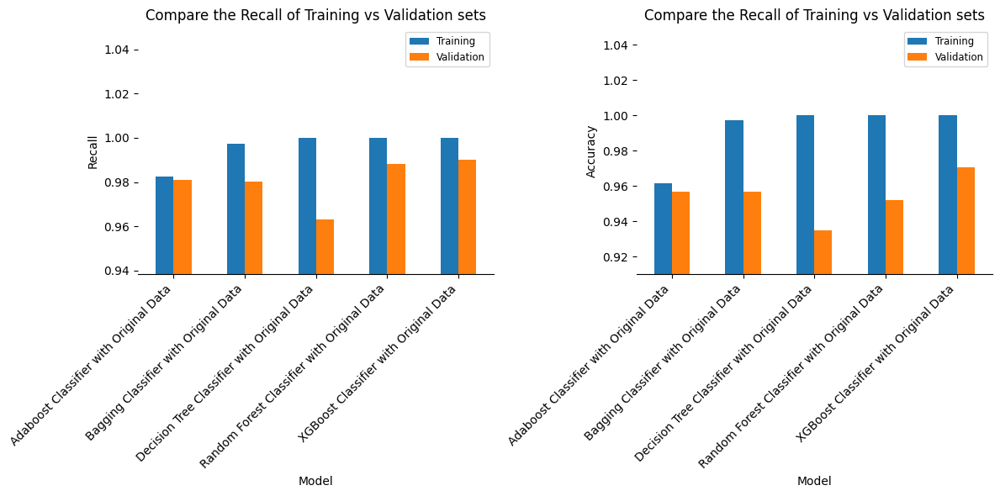

In [117]:
# Visualize the performance of Training and Validation Set for Models
Visualize_Perf_compariason( performance_pivot_origin,   # Performance Data
                            ['Recall', 'Accuracy'],     # array of Performance parameters
                            degree = 45,
                            )

**Comment on Model Performance Evaluation**:

- **Decision Tree Classifier**: Demonstrates perfect performance on the training set but exhibits lower accuracy and recall on the validation set, indicating overfitting. The model likely memorizes specific details of the training data, leading to reduced generalization.

- **Random Forest Classifier**: Initially shows signs of overfitting with perfect training set performance slightly exceeding validation set metrics. However, the ensemble approach improves overall performance and generalization compared to the Decision Tree Classifier.

- **Bagging Classifier**: While designed to reduce variance and improve stability through ensemble aggregation, the Bagging Classifier shows comparable performance to the Random Forest Classifier. Both models employ ensemble techniques to mitigate overfitting tendencies. However, the additional complexity and resources required by Bagging may not yield significant gains in predictive performance over the Random Forest model, as observed in similar validation set metrics.


- **Adaptive Boosting Classifier**: Exhibits consistent high performance with minimal difference between training and validation sets, suggesting strong generalization. Adaboost's iterative approach focusing on misclassified instances during training contributes to its robust performance on unseen data.

- **XGBoost (Extreme Gradient Boosting) Classifier**: Demonstrates superior performance across all metrics on both training and validation sets, indicating its effectiveness. XGBoost's gradient boosting framework enhances model performance sequentially, making it the optimal choice for maximizing Recall score.

**Conclusion**: While all models perform well, XGBoost stands out as the top performer due to its consistent high performance and superior ability to generalize across different evaluation metrics, especially in maximizing Recall score.

#### Models Trained with Oversampled Data

##### Build Models

In [118]:
# Define the models name for the oversampled data
# model_names_oversample (list of lists): List containing lists of model names for different datasets (e.g., original, oversampled, undersampled).
model_names_oversample = [
    ["Decision Tree Classifier - Oversampled Data"],
    ["Random Forest Classifier - Oversampled Data"],
    ["Bagging Classifier - Oversampled Data"],
    ["Adaboost Classifier - Oversampled Data"],
    ["XGBoost Classifier - Oversampled Data"],
]

In [119]:
# Perform over sampling on the training data
X_train_over, y_train_over = sampling_data(X_train, y_train, sampling_type = "Over")

# Create dictionaries mapping each model to its corresponding training data
X_TRAIN = dict_trainings_data(model_names_oversample, [X_train_over])
y_TRAIN = dict_trainings_data(model_names_oversample, [y_train_over])

Before Over Sampling, counts of label '1 - Existing Customers': 4674
Before Over Sampling, counts of label '0 - Attrited customers': 895

After Over Sampling, counts of label '1 - Existing Customers': 4674

After Over Sampling, counts of label '0 - Attrited customers': 4674

After Over Sampling, the shape of train_X: (9348, 28)
After Over Sampling, the shape of train_y: (9348, 28)



In [120]:
models_over = {}    # Initialize an empty dictionary to store the models
train_perf_over = {}     # Initialize an empty dictionary to store the training performance metrics
val_perf_over = {}       # Initialize an empty dictionary to store the validation performance metrics

Time = 0.0# Start the timer

# Loop through each model
for model_class, model_name_list in zip(base_models, model_names_oversample):
    model_class_name = model_class.__name__   # Get the model name as a string

    # Create a list of tuples containing model names and instances
    model_list = [(name, model_class(random_state = random_state)) for name in model_name_list]

    print(f"Training initiated for {model_class_name}...\n")  # Print a message to indicate the start of tuning
    start_time = time.time()                          # Start the timer

    # Train the models
    models_over[model_class_name] = train_multiple_models(model_class, model_name_list, X_TRAIN, y_TRAIN, X_val, y_val)

    duration_train = time.time() - start_time               # Calculate the duration of tuning
    print(f"\n\nTraining Completed for {model_class_name}. Total Time taken: {duration_train:.2f} seconds\n")

    Time += duration_train  # Add the duration to the total time

    # Evaluate Models
    train_perf_over[model_class_name], val_perf_over[model_class_name] = evaluate_multiple_models(models_over[model_class_name], model_name_list, X_TRAIN, y_TRAIN, X_val, y_val)

print(f"\n\nTotal Time taken: {Time:.2f} seconds")

Training initiated for DecisionTreeClassifier...

Training Initiated for Decision Tree Classifier  with  Oversampled Data...
Training Completed for Decision Tree Classifier  with  Oversampled Data. Total Time taken: 0.16 seconds


Training Completed for DecisionTreeClassifier. Total Time taken: 0.17 seconds

Training initiated for RandomForestClassifier...

Training Initiated for Random Forest Classifier  with  Oversampled Data...
Training Completed for Random Forest Classifier  with  Oversampled Data. Total Time taken: 2.02 seconds


Training Completed for RandomForestClassifier. Total Time taken: 2.03 seconds

Training initiated for BaggingClassifier...

Training Initiated for Bagging Classifier  with  Oversampled Data...
Training Completed for Bagging Classifier  with  Oversampled Data. Total Time taken: 0.74 seconds


Training Completed for BaggingClassifier. Total Time taken: 0.74 seconds

Training initiated for AdaBoostClassifier...

Training Initiated for Adaboost Classifier  wi

##### Compare the Models

In [121]:
models_train_comp_df_over = pd.DataFrame()  # Initialize an empty DataFrame to store the results

# Loop through each model
for model_class in base_models:
    model_class_name = model_class.__name__   # Get the model name as a string

    # Append the results to the DataFrame
    models_train_comp_df_over = pd.concat(
      [
        models_train_comp_df_over,
        # Display the Models if display set to True
        display_model_performance(model_class, train_perf_over[model_class_name], "Training", display = False),
        display_model_performance(model_class, val_perf_over[model_class_name], "Validation", display = False),
      ],
    axis = 0,
    )

In [122]:
# Define the HTML text in a string with larger font size
html_text = """
<p style='font-size:18px;'>
<strong>Compare the performance of training vs. validation sets across all <span style='color:blue'>Base</span> Models using the <span style='color:blue'>Oversampled data</span>:</strong>
</p><br>
"""
display(HTML(html_text))    # Display the HTML text

# Create a Pivot table of the Performance results
performance_pivot_over = models_train_comp_df_over.pivot_table(index="Model", columns="Set" )

performance_pivot_over # Display the DataFrame

Accuracy            F1 Score  \
Set                                            Training Validation Training   
Model                                                                         
Adaboost Classifier with Oversampled Data         0.965      0.952    0.965   
Bagging Classifier with Oversampled Data          0.997      0.947    0.997   
Decision Tree Classifier with Oversampled Data    1.000      0.927    1.000   
Random Forest Classifier with Oversampled Data    1.000      0.954    1.000   
XGBoost Classifier with Oversampled Data          1.000      0.976    1.000   

                                                          Precision  \
Set                                            Validation  Training   
Model                                                                 
Adaboost Classifier with Oversampled Data           0.971     0.971   
Bagging Classifier with Oversampled Data            0.968     1.000   
Decision Tree Classifier with Oversampled Data      0.956     1.000   
Random Forest Classifier with Oversampled Data      0.973     1.000   
XGBoost Classifier with Oversampled Data            0.986     1.000   

                                                            Recall             
Set                                            Validation Training Validation  
Model                                                                          
Adaboost Classifier with Oversampled Data           0.979    0.960      0.964  
Bagging Classifier with Oversampled Data            0.975    0.995      0.961  
Decision Tree Classifier with Oversampled Data      0.964    1.000      0.949  
Random Forest Classifier with Oversampled Data      0.972    1.000      0.974  
XGBoost Classifier with Oversampled Data            0.982    1.000      0.990

##### Model Performance Evaluation

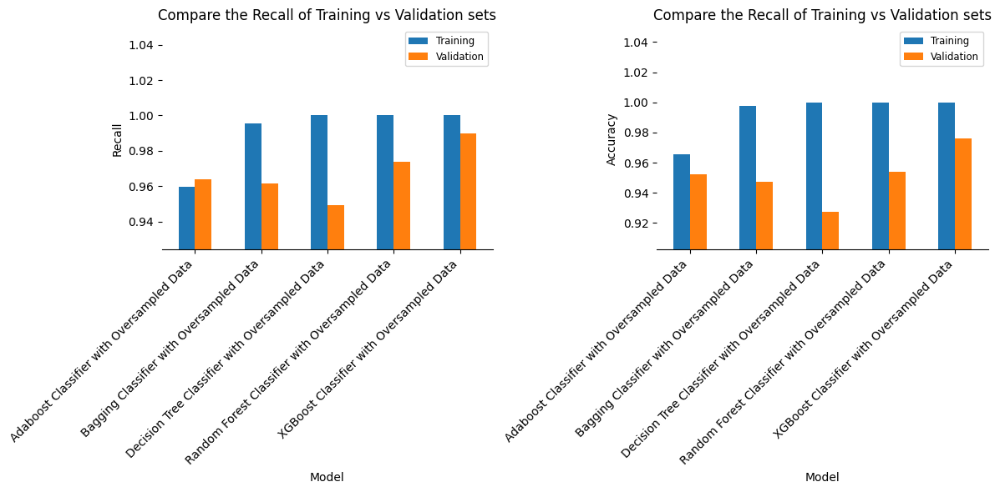

In [123]:
# Visualize the performance of Training and Validation Set for Models
Visualize_Perf_compariason( performance_pivot_over,   # Performance Data
                            ['Recall', 'Accuracy'],     # array of Performance parameters
                            degree = 45,
                            )

**Comment on Model Performance Evaluation (Oversampled Data)**:

- **Decision Tree Classifier**: Despite achieving perfect training set accuracy, the model shows lower validation set accuracy, indicating overfitting. The validation set recall also suggests that the model struggles with generalizing to new data, even after oversampling.

- **Random Forest Classifier**: Similar to the Decision Tree, the Random Forest exhibits perfect training set accuracy but slightly lower validation set accuracy. The validation set recall shows improved generalization compared to the Decision Tree, indicating that the ensemble approach helps mitigate overfitting to some extent.

- **Bagging Classifier**: This classifier shows high accuracy on both training and validation sets, with consistent precision and recall metrics across both sets. Despite minor overfitting, the Bagging Classifier demonstrates effective generalization after oversampling, showcasing its stability and robustness.

- **Adaboost Classifier**: Maintains balanced performance across training and validation sets. The model's precision and recall scores indicate strong generalization capabilities post-oversampling, reflecting its ability to adapt and learn from misclassified instances.

- **XGBoost Classifier**: Continues to excel with high accuracy on both training and validation sets. Precision and recall metrics further underscore its superiority in handling oversampled data, leveraging its gradient boosting framework to enhance performance consistently.

**Conclusion**: Following oversampling, all models demonstrate improved stability and performance in terms of accuracy, precision, and recall. XGBoost stands out as the optimal choice, maintaining superior performance across all metrics and confirming its effectiveness in handling the increased dataset size due to oversampling.

#### Models Trained with Undersampled Data

##### Build Models

In [124]:
# Define the models name for the Undersampled data
# model_names_oversample (list of lists): List containing lists of model names for different datasets (e.g., original, oversampled, undersampled).
model_names_undersample = [
    ["Decision Tree Classifier - Undersampled Data"],
    ["Random Forest Classifier - Undersampled Data"],
    ["Bagging Classifier - Undersampled Data"],
    ["Adaboost Classifier - Undersampled Data"],
    ["XGBoost Classifier - Undersampled Data"],
]

In [125]:
# Perform over sampling on the training data
X_train_under, y_train_under = sampling_data(X_train, y_train, sampling_type = "Under")

# Create dictionaries mapping each model to its corresponding training data
X_TRAIN = dict_trainings_data(model_names_undersample, [X_train_under])
y_TRAIN = dict_trainings_data(model_names_undersample, [y_train_under])

Before Under Sampling, counts of label '1 - Existing Customers': 4674
Before Under Sampling, counts of label '0 - Attrited customers': 895

After Under Sampling, counts of label '1 - Existing Customers': 895

After Under Sampling, counts of label '0 - Attrited customers': 895

After Under Sampling, the shape of train_X: (1790, 28)
After Under Sampling, the shape of train_y: (1790, 28)



In [126]:
models_under = {}    # Initialize an empty dictionary to store the models
train_perf_under = {}     # Initialize an empty dictionary to store the training performance metrics
val_perf_under = {}       # Initialize an empty dictionary to store the validation performance metrics

Time = 0.0# Start the timer

# Loop through each model
for model_class, model_name_list in zip(base_models, model_names_undersample):
    model_class_name = model_class.__name__   # Get the model name as a string

    # Create a list of tuples containing model names and instances
    model_list = [(name, model_class(random_state = random_state)) for name in model_name_list]

    print(f"Training initiated for {model_class_name}...\n")  # Print a message to indicate the start of tuning
    start_time = time.time()                          # Start the timer

    # Train the models
    models_under[model_class_name] = train_multiple_models(model_class, model_name_list, X_TRAIN, y_TRAIN, X_val, y_val)

    duration_train = time.time() - start_time               # Calculate the duration of tuning
    print(f"\n\nTraining Completed for {model_class_name}. Total Time taken: {duration_train:.2f} seconds\n")

    Time += duration_train  # Add the duration to the total time

    # Evaluate Models
    train_perf_under[model_class_name], val_perf_under[model_class_name] = evaluate_multiple_models(models_under[model_class_name], model_name_list, X_TRAIN, y_TRAIN, X_val, y_val)

print(f"\n\nTotal Time taken: {Time:.2f} seconds")

Training initiated for DecisionTreeClassifier...

Training Initiated for Decision Tree Classifier  with  Undersampled Data...
Training Completed for Decision Tree Classifier  with  Undersampled Data. Total Time taken: 0.03 seconds


Training Completed for DecisionTreeClassifier. Total Time taken: 0.03 seconds

Training initiated for RandomForestClassifier...

Training Initiated for Random Forest Classifier  with  Undersampled Data...
Training Completed for Random Forest Classifier  with  Undersampled Data. Total Time taken: 0.44 seconds


Training Completed for RandomForestClassifier. Total Time taken: 0.44 seconds

Training initiated for BaggingClassifier...

Training Initiated for Bagging Classifier  with  Undersampled Data...
Training Completed for Bagging Classifier  with  Undersampled Data. Total Time taken: 0.12 seconds


Training Completed for BaggingClassifier. Total Time taken: 0.12 seconds

Training initiated for AdaBoostClassifier...

Training Initiated for Adaboost Classifi

##### Compare the Models

In [127]:
models_train_comp_df_under = pd.DataFrame()  # Initialize an empty DataFrame to store the results

# Loop through each model
for model_class in base_models:
    model_class_name = model_class.__name__   # Get the model name as a string

    # Append the results to the DataFrame
    models_train_comp_df_under = pd.concat(
      [
        models_train_comp_df_under,
        # Display the Models if display set to True
        display_model_performance(model_class, train_perf_under[model_class_name], "Training", display = False),
        display_model_performance(model_class, val_perf_under[model_class_name], "Validation", display = False),
      ],
    axis = 0,
    )

In [128]:
# Define the HTML text in a string with larger font size
html_text = """
<p style='font-size:18px;'>
<strong>Compare the performance of training vs. validation sets across all <span style='color:blue'>Base</span> Models using the <span style='color:blue'>Undersampled data</span>:</strong>
</p><br>
"""
display(HTML(html_text))    # Display the HTML text

# Create a Pivot table of the Performance results
performance_pivot_under = models_train_comp_df_under.pivot_table(index="Model", columns="Set")

performance_pivot_under # Display the DataFrame

Accuracy            F1 Score  \
Set                                             Training Validation Training   
Model                                                                          
Adaboost Classifier with Undersampled Data         0.952      0.931    0.952   
Bagging Classifier with Undersampled Data          0.992      0.908    0.992   
Decision Tree Classifier with Undersampled Data    1.000      0.895    1.000   
Random Forest Classifier with Undersampled Data    1.000      0.928    1.000   
XGBoost Classifier with Undersampled Data          1.000      0.953    1.000   

                                                           Precision  \
Set                                             Validation  Training   
Model                                                                  
Adaboost Classifier with Undersampled Data           0.958     0.956   
Bagging Classifier with Undersampled Data            0.942     1.000   
Decision Tree Classifier with Undersampled Data      0.935     1.000   
Random Forest Classifier with Undersampled Data      0.956     1.000   
XGBoost Classifier with Undersampled Data            0.971     1.000   

                                                             Recall             
Set                                             Validation Training Validation  
Model                                                                           
Adaboost Classifier with Undersampled Data           0.987    0.947      0.931  
Bagging Classifier with Undersampled Data            0.988    0.983      0.901  
Decision Tree Classifier with Undersampled Data      0.974    1.000      0.899  
Random Forest Classifier with Undersampled Data      0.987    1.000      0.926  
XGBoost Classifier with Undersampled Data            0.990    1.000      0.953

##### Model Performance Evaluation

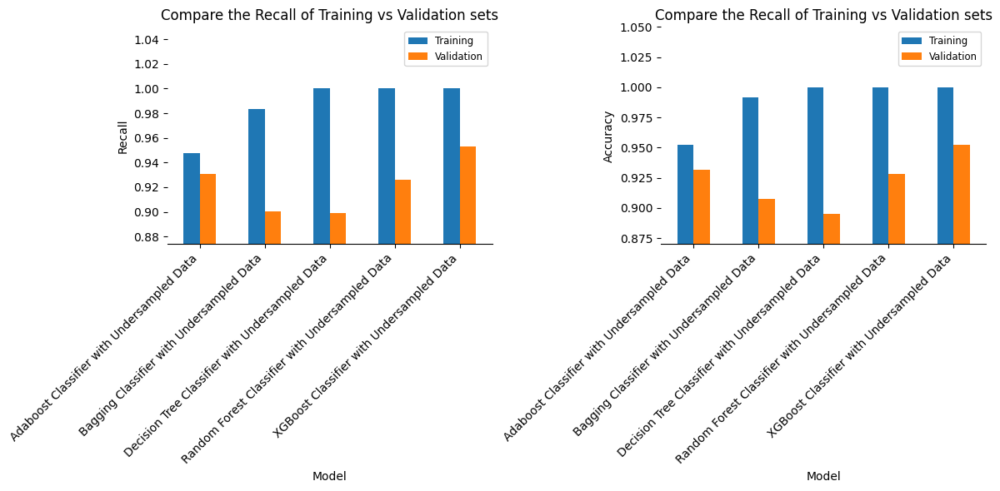

In [129]:
# Visualize the performance of Training and Validation Set for Models
Visualize_Perf_compariason( performance_pivot_under,   # Performance Data
                            ['Recall', 'Accuracy'],     # array of Performance parameters
                            degree = 45,
                            )

**Comment on Model Performance Evaluation (Undersampled Data)**:

- **Decision Tree Classifier**: Shows perfect accuracy on the training set but exhibits lower accuracy and recall on the validation set, indicating overfitting despite undersampling. The model struggles to generalize to new data instances under these conditions.

- **Random Forest Classifier**: Similar to the Bagging Classifier, the Random Forest achieves high accuracy on the training set but demonstrates slightly lower accuracy and recall on the validation set. The ensemble approach improves generalization compared to a single Decision Tree but still faces challenges in maintaining robust performance under undersampled conditions.

- **Bagging Classifier**: While achieving high accuracy on the training set, the Bagging Classifier shows slightly lower performance on the validation set, indicating potential overfitting. Its precision and recall metrics suggest effective handling of undersampled data but highlight challenges in maintaining consistent performance.

- **Adaboost Classifier**: Demonstrates balanced performance on both training and validation sets, with consistent metrics across accuracy, F1 score, precision, and recall. The model maintains robust generalization capabilities despite undersampling, making it effective for classification tasks.

- **XGBoost Classifier**: Continues to demonstrate superior performance across all metrics on both training and validation sets, highlighting its effectiveness in handling undersampled data. XGBoost's gradient boosting framework enhances model performance, making it highly reliable for classification tasks despite data imbalance.

**Conclusion**: While Adaboost and XGBoost exhibit strong performance across the undersampled dataset, the Bagging and Random Forest classifiers show similar trends with slight differences. Bagging, while achieving high training accuracy, may overfit slightly compared to Random Forest. XGBoost remains the optimal choice for its consistent high performance and robustness in handling undersampled data, outperforming other classifiers in accuracy, precision, recall, and F1 score metrics.

### Final Conclusion and Select the Best Three Models

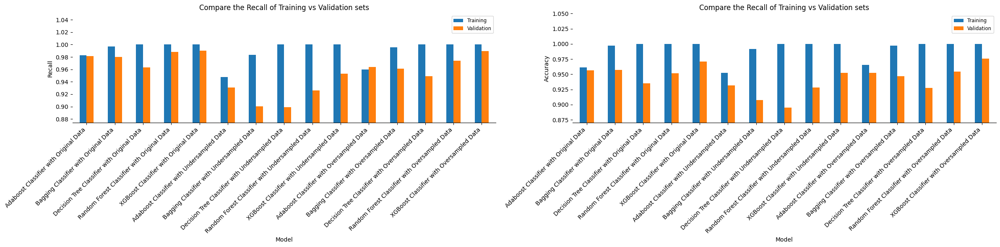

In [132]:
# Visualize the performance of Training and Validation Set for Models
Visualize_Perf_compariason( pd.concat([performance_pivot_origin, performance_pivot_under, performance_pivot_over]),   # Performance Data
                            ['Recall', 'Accuracy'],     # array of Performance parameters
                            degree = 45,
                            width = 12,
                            legend_pos = (1, 1),
                            )

**Model Performance Comparison:**

**Decision Tree Classifier**: All three models demonstrate perfect performance on the training set but exhibit lower performance on the validation set, indicating overfitting. Among these, the Decision Tree with original data provides the best comparative outcome.

**Random Forest Classifier**: Similar to the Decision Tree Classifier, all three models initially show signs of overfitting with high performance on the training set relative to the validation set. However, the ensemble approach improves overall performance compared to Decision Tree models. In this case, the models built with original data and oversampled data have very close performance. Considering model evaluation criteria, the model with original data provides the best recall on the validation set.

**Bagging Classifier**: The Bagging models do not show improvement compared to the corresponding Random Forest models. Although all three models tend to overfit, the one built with original data shows better performance.

**Adaptive Boosting Classifier**: This classifier exhibits consistently high performance with minimal differences between the training and validation sets, suggesting no overfitting. It generally demonstrates good generalization capabilities. Among the three models, the one built with the original dataset provides the best output and is considered the best model so far.

**XGBoost (Extreme Gradient Boosting) Classifier**: All three models provide significantly better results, particularly demonstrating superior performance with both the original and oversampled data, making them the optimal models.

**Conclusion**
- For all classifiers, models with original and oversampled data provide the best performance, while those with undersampled data perform the poorest. The loss of data and increased bias are likely reasons for the poor performance of all undersampled models.

- **Decision Tree**, **Random Forest** and **Bagging Classifier** Classifiers are showing significantly better performance on the training data, indicating overfitting.

- Both **Adaboost and XGBoost classifiers** appears to generalize well specially on the original and oversampled data set.

- **XGBoost classifier** has the highest F1 score in the validation sets, suggesting it is the best model at balancing precision and recall. It is recommended to tune this model for optimal recall.

Based on performance, the top three models are:

1. **XGBoost Classifier with original data**
2. **XGBoost Classifier with oversampled data**
3. **Adaptive Boosting Classifier with original dataset**

## Model Hyperparameter Tuning

#### **Note**

1. Sample parameter grids have been provided to do necessary hyperparameter tuning. These sample grids are expected to provide a balance between model performance improvement and execution time. One can extend/reduce the parameter grid based on execution time and system configuration.
  - Please note that if the parameter grid is extended to improve the model performance further, the execution time will increase
2. The models chosen in this notebook are based on test runs. One can update the best models as obtained upon code execution and tune them for best performance.

### Sample Parameter Grids

**Note**

To mitigate the time complexity associated with hyperparameter tuning, which can be a lengthy process, you can utilize pre-defined grids wherever necessary. This approach enables you to bypass the time-consuming tuning process and expedite your workflow.

- For Gradient Boosting:

```
param_grid = {
    "init": [AdaBoostClassifier(random_state=1),DecisionTreeClassifier(random_state=1)],
    "n_estimators": np.arange(50,110,25),
    "learning_rate": [0.01,0.1,0.05],
    "subsample":[0.7,0.9],
    "max_features":[0.5,0.7,1],
}
```

- For Adaboost:

```
param_grid = {
    "n_estimators": np.arange(50,110,25),
    "learning_rate": [0.01,0.1,0.05],
    "base_estimator": [
        DecisionTreeClassifier(max_depth=2, random_state=1),
        DecisionTreeClassifier(max_depth=3, random_state=1),
    ],
}
```

- For Bagging Classifier:

```
param_grid = {
    'max_samples': [0.8,0.9,1],
    'max_features': [0.7,0.8,0.9],
    'n_estimators' : [30,50,70],
}
```
- For Random Forest:

```
param_grid = {
    "n_estimators": [50,110,25],
    "min_samples_leaf": np.arange(1, 4),
    "max_features": [np.arange(0.3, 0.6, 0.1),'sqrt'],
    "max_samples": np.arange(0.4, 0.7, 0.1)
}
```

- For Decision Trees:

```
param_grid = {
    'max_depth': np.arange(2,6),
    'min_samples_leaf': [1, 4, 7],
    'max_leaf_nodes' : [10, 15],
    'min_impurity_decrease': [0.0001,0.001]
}
```

- For XGBoost (optional):

```
param_grid={'n_estimators':np.arange(50,110,25),
            'scale_pos_weight':[1,2,5],
            'learning_rate':[0.01,0.1,0.05],
            'gamma':[1,3],
            'subsample':[0.7,0.9]
}
```

### Define Useful Variables and Functions

#### Useful Functions to Tune Models

In [133]:
# Function to tune models' hyperparameters using RandomizedSearchCV.
def hyperparameter_tuning_multiple_models(model_list, param_grid, param, X_TRAIN, y_TRAIN):
    """
    Parameters:   - model_list (list of tuples): List containing tuples of model names and instances.
                  - param_grid (dict): Dictionary containing parameter grids for each model.
                  - X_TRAIN (dict): Dictionary mapping model names to their corresponding training data.
                  - y_TRAIN (dict): Dictionary mapping model names to their corresponding training labels.

    Returns:      - best_params (dict): Dictionary mapping model names to their best hyperparameters.
                  - best_scores (dict): Dictionary mapping model names to their best cross-validation scores.
    """
    best_params = {}  # Initialize an empty dictionary to store the best parameters
    best_scores = {}  # Initialize an empty dictionary to store the best scores

    # Iterate over each model and its corresponding instance
    for name, instance in model_list:
      print(f"Tuning Initiated for {name.replace('-', ' with ')}...")  # Print a message to indicate the start of tuning
      start_time = time.time()                          # Start the timer

      randomized_cv = RandomizedSearchCV(
            estimator = instance,
            param_distributions = param_grid,
            n_iter = param['n_iter'],
            n_jobs = param['n_jobs'],
            scoring = param['scoring'],
            cv = param['cv'],
            random_state = random_state,
        )

      # Call the function to tune the model and retrieve best parameters and scores
      best_params[name], best_scores[name] = perform_randomized_search (randomized_cv, X_TRAIN[name], y_TRAIN[name])

      duration = time.time() - start_time               # Calculate the duration of tuning
      # Print a message to indicate the end of tuning
      print(f"Tuning Completed for {name.replace('-', ' with ')}. Total Time taken: {duration:.2f} seconds")

    return best_params, best_scores  # Return the best parameters and the best scores

In [134]:
# Function to perform randomized search and retrieve best parameters and scores
def perform_randomized_search(randomized_cv, predictor, target):
    """
    Parameters:   - randomized_cv (RandomizedSearchCV): RandomizedSearchCV instance configured with parameter distributions.
                  - predictor (array-like): Training data.
                  - target (array-like): Target labels.
    Returns:      - best_params (dict): Best parameters found during randomized search.
                  - best_score (float): Best cross-validation score.
    """
    randomized_cv.fit(predictor, target)      # Fit RandomizedSearchCV to find best parameters

    # Return best parameters and best score
    return randomized_cv.best_params_, randomized_cv.best_score_

### Tuning of Models for all datasets (Original, Oversampled, Undersampled)

**Please Note - The requirement was to tune at least the top three models, but I opted to tune all the models for a comprehensive comparison. Here are the results**

In [135]:
# Define heading of Dataframe which will capture the performance parameter against different Models
perf_column = ['Model', 'Set', 'Accuracy', 'Recall', 'Precision', 'F1 Score']

# Define base classifier models
base_models = [
    DecisionTreeClassifier,
    RandomForestClassifier,
    BaggingClassifier,
    AdaBoostClassifier,
    XGBClassifier,
    ]

# Define the models name for the original data, oversampled data, and undersampled data
# model_names (list of lists): List containing lists of model names for different datasets (e.g., original, oversampled, undersampled).
model_names = [
        ["Decision Tree Classifier - Original Data",        "Decision Tree Classifier - Oversampled Data",          "Decision Tree Classifier - Undersampled Data"],
        ["Random Forest Classifier - Original Data",        "Random Forest Classifier - Oversampled Data",          "Random Forest Classifier - Undersampled Data"],
        ["Bagging Classifier - Original Data",              "Bagging Classifier - Oversampled Data",                "Bagging Classifier - Undersampled Data"],
        ["Adaboost Classifier - Original Data",             "Adaboost Classifier - Oversampled Data",               "Adaboost Classifier - Undersampled Data"],
        ["XGBoost Classifier - Original Data",              "XGBoost Classifier - Oversampled Data",                "XGBoost Classifier - Undersampled Data"],
    ]  # List of model names for each model

# Define parameters for RandomizedSearchCV
random_Search_param = {
    'n_iter': 10,
    'n_jobs': -1,
    'cv': 5,
    'scoring': metrics.make_scorer(metrics.recall_score),
}

# Parameter grid for different models to pass in RandomSearchCV
param_grid_dtree = {   # For Decision Tree
        'max_depth': np.arange(2, 6),
        'min_samples_leaf': [1, 4, 7],
        'max_leaf_nodes': [10, 15],
        'min_impurity_decrease': [0.0001, 0.001]
}
param_grid_rf = {   # For Random Forest
        "n_estimators": [50, 110, 150],
        "min_samples_leaf": np.arange(1, 4),
        "max_features": [np.arange(0.3, 0.6, 0.1), 'sqrt'],
        "max_samples": np.arange(0.4, 0.7, 0.1)
}
param_grid_bagging = {
        'max_samples': [0.8,0.9,1],
        'max_features': [0.7,0.8,0.9],
        'n_estimators' : [30,50,70],
}
param_grid_adaboost = {
        "n_estimators": np.arange(50,110,25),
        "learning_rate": [0.01,0.1,0.05],
        "base_estimator": [
          DecisionTreeClassifier(max_depth=2, random_state=1),
          DecisionTreeClassifier(max_depth=3, random_state=1),
    ],
}
param_grid_xgboost = {
        'n_estimators':np.arange(50,110,25),
        'scale_pos_weight':[1,2,5],
        'learning_rate':[0.01,0.1,0.05],
        'gamma':[1,3],
        'subsample':[0.7,0.9]
}

# List of parameter grids for each model
param_grids = [param_grid_dtree,
               param_grid_rf,
               param_grid_bagging,
               param_grid_adaboost,
               param_grid_xgboost,
               ]  # List of parameter grids for each model

In [136]:
best_params = {}    # Initialize an empty dictionary to store the best parameters
best_scores = {}    # Initialize an empty dictionary to store the best scores
tuned_models = {}   # Initialize an empty dictionary to store the tuned models
train_perf = {}     # Initialize an empty dictionary to store the training performance metrics
val_perf = {}       # Initialize an empty dictionary to store the validation performance metrics

# Initialize an empty dictionary to store the tuned models
# Create dictionaries mapping each model to its corresponding training data
X_TRAIN = dict_trainings_data(model_names, [X_train, X_train_over, X_train_under])
y_TRAIN = dict_trainings_data(model_names, [y_train, y_train_over, y_train_under])

Time = 0.0 # Start the timer
# Loop through each model and its corresponding parameter grid
for model_class, param_grid, model_name_list in zip(base_models, param_grids, model_names):
    model_class_name = model_class.__name__   # Get the model name as a string

    # Create a list of tuples containing model names and instances
    model_list = [(name, model_class(random_state = random_state)) for name in model_name_list]

    print(f"Tuning initiated for {model_class_name}...\n")  # Print a message to indicate the start of tuning
    start_time = time.time()                          # Start the timer

    # Call the function to tune the model and retrieve best parameters and scores
    best_params[model_class_name], best_scores[model_class_name] = hyperparameter_tuning_multiple_models(model_list, param_grid, random_Search_param, X_TRAIN, y_TRAIN)

    duration_tune = time.time() - start_time               # Calculate the duration of tuning
    print(f"\n\nTuning Completed for {model_class_name}. Total Time taken: {duration_tune:.2f} seconds\n")

    print(f"Training initiated for {model_class_name}...\n")  # Print a message to indicate the start of tuning
    start_time = time.time()                          # Start the timer

    # Train the models
    tuned_models[model_class_name] = train_multiple_models(model_class, model_name_list, X_TRAIN, y_TRAIN, X_val, y_val, params = best_params[model_class_name])

    duration_train = time.time() - start_time               # Calculate the duration of tuning
    print(f"\n\nTraining Completed for {model_class_name}. Total Time taken: {duration_train:.2f} seconds\n")

    duration = duration_tune + duration_train               # Calculate the total duration
    print(f"\nCompleted building all the {model_class_name} models. Total Time taken: {(duration):.2f} seconds\n")

    Time += duration

    # Evaluate Models
    train_perf[model_class_name], val_perf[model_class_name] = evaluate_multiple_models(tuned_models[model_class_name],model_name_list, X_TRAIN, y_TRAIN, X_val, y_val)

print(f"\n\nTotal Time taken: {Time:.2f} seconds")

Tuning initiated for DecisionTreeClassifier...

Tuning Initiated for Decision Tree Classifier  with  Original Data...
Tuning Completed for Decision Tree Classifier  with  Original Data. Total Time taken: 7.13 seconds
Tuning Initiated for Decision Tree Classifier  with  Oversampled Data...
Tuning Completed for Decision Tree Classifier  with  Oversampled Data. Total Time taken: 1.84 seconds
Tuning Initiated for Decision Tree Classifier  with  Undersampled Data...
Tuning Completed for Decision Tree Classifier  with  Undersampled Data. Total Time taken: 0.78 seconds


Tuning Completed for DecisionTreeClassifier. Total Time taken: 9.76 seconds

Training initiated for DecisionTreeClassifier...

Training Initiated for Decision Tree Classifier  with  Original Data...
Training Completed for Decision Tree Classifier  with  Original Data. Total Time taken: 0.03 seconds
Training Initiated for Decision Tree Classifier  with  Oversampled Data...
Training Completed for Decision Tree Classifier  with 

## Model Comparison and Final Model Selection

### Compare the Hypertuned Models

In [137]:
# Define the HTML text in a string with larger font size
html_text = """
<p style='font-size:18px;'><strong>Compare the performance of training vs. validation sets across all <span style='color:blue'>Hyperparameter Tuned </span> Models using RandomSearchCV on:</strong></p>
<ul style='font-size:18px;'>
    <li>Original data</li>
    <li>Oversampled data</li>
    <li>Undersampled data</li>
</ul>
<br>
"""
display(HTML(html_text))    # Display the HTML text

models_train_comp_df = pd.DataFrame()  # Initialize an empty DataFrame to store the results

# Loop through each model and its corresponding parameter grid
for model_class in base_models:
    model_class_name = model_class.__name__   # Get the model name as a string

    # Append the results to the DataFrame
    models_train_comp_df = pd.concat(
      [
        models_train_comp_df,
        # Display the Models if display set to True
        display_model_performance(model_class, train_perf[model_class_name], "Training", display = True),
        display_model_performance(model_class, val_perf[model_class_name], "Validation", display = True),
      ],
    axis = 0,
)
#   Create a Pivot table of the Performance results

**DecisionTreeClassifier Training performance:**

,Model,Set,Accuracy,Recall,Precision,F1 Score
0,Decision Tree Classifier with Original Data,Training,0.930,0.984,0.936,0.959
1,Decision Tree Classifier with Oversampled Data,Training,0.925,0.924,0.925,0.925
2,Decision Tree Classifier with Undersampled Data,Training,0.861,0.935,0.814,0.871


**DecisionTreeClassifier Validation performance:**

,Model,Set,Accuracy,Recall,Precision,F1 Score
0,Decision Tree Classifier with Original Data,Validation,0.919,0.984,0.924,0.953
1,Decision Tree Classifier with Oversampled Data,Validation,0.915,0.929,0.969,0.949
2,Decision Tree Classifier with Undersampled Data,Validation,0.900,0.928,0.951,0.940


**RandomForestClassifier Training performance:**

,Model,Set,Accuracy,Recall,Precision,F1 Score
0,Random Forest Classifier with Original Data,Training,0.978,0.997,0.978,0.987
1,Random Forest Classifier with Oversampled Data,Training,0.999,0.999,1.000,0.999
2,Random Forest Classifier with Undersampled Data,Training,0.996,0.992,1.000,0.996


**RandomForestClassifier Validation performance:**

,Model,Set,Accuracy,Recall,Precision,F1 Score
0,Random Forest Classifier with Original Data,Validation,0.943,0.989,0.945,0.967
1,Random Forest Classifier with Oversampled Data,Validation,0.952,0.971,0.972,0.971
2,Random Forest Classifier with Undersampled Data,Validation,0.927,0.928,0.984,0.955


**BaggingClassifier Training performance:**

,Model,Set,Accuracy,Recall,Precision,F1 Score
0,Bagging Classifier with Original Data,Training,0.839,1.000,0.839,0.913
1,Bagging Classifier with Oversampled Data,Training,1.000,1.000,1.000,1.000
2,Bagging Classifier with Undersampled Data,Training,0.500,0.000,0.000,0.000


**BaggingClassifier Validation performance:**

,Model,Set,Accuracy,Recall,Precision,F1 Score
0,Bagging Classifier with Original Data,Validation,0.839,1.000,0.839,0.913
1,Bagging Classifier with Oversampled Data,Validation,0.958,0.971,0.979,0.975
2,Bagging Classifier with Undersampled Data,Validation,0.161,0.000,0.000,0.000


**AdaBoostClassifier Training performance:**

,Model,Set,Accuracy,Recall,Precision,F1 Score
0,Adaboost Classifier with Original Data,Training,0.919,0.990,0.920,0.954
1,Adaboost Classifier with Oversampled Data,Training,0.988,0.987,0.990,0.988
2,Adaboost Classifier with Undersampled Data,Training,0.994,0.990,0.998,0.994


**AdaBoostClassifier Validation performance:**

,Model,Set,Accuracy,Recall,Precision,F1 Score
0,Adaboost Classifier with Original Data,Validation,0.910,0.990,0.910,0.948
1,Adaboost Classifier with Oversampled Data,Validation,0.970,0.983,0.981,0.982
2,Adaboost Classifier with Undersampled Data,Validation,0.944,0.942,0.992,0.966


**XGBClassifier Training performance:**

,Model,Set,Accuracy,Recall,Precision,F1 Score
0,XGBoost Classifier with Original Data,Training,0.839,1.000,0.839,0.913
1,XGBoost Classifier with Oversampled Data,Training,0.992,1.000,0.985,0.992
2,XGBoost Classifier with Undersampled Data,Training,0.966,0.998,0.939,0.967


**XGBClassifier Validation performance:**

,Model,Set,Accuracy,Recall,Precision,F1 Score
0,XGBoost Classifier with Original Data,Validation,0.839,1.000,0.839,0.913
1,XGBoost Classifier with Oversampled Data,Validation,0.967,0.993,0.968,0.980
2,XGBoost Classifier with Undersampled Data,Validation,0.963,0.976,0.979,0.978


In [138]:
from rich import print  # Import the Rich library for better formatting

# Create a Pivot table of the Performance results
performance_pivot = models_train_comp_df.pivot_table(index="Model", columns="Set" )

print("[bold]Training vs Validatrion Performance comparison on hypertuned Models:[/bold]\n")
performance_pivot # Display the DataFrame

Training vs Validatrion Performance comparison on hypertuned Models:

Accuracy            F1 Score  \
Set                                             Training Validation Training   
Model                                                                          
Adaboost Classifier with Original Data             0.919      0.910    0.954   
Adaboost Classifier with Oversampled Data          0.988      0.970    0.988   
Adaboost Classifier with Undersampled Data         0.994      0.944    0.994   
Bagging Classifier with Original Data              0.839      0.839    0.913   
Bagging Classifier with Oversampled Data           1.000      0.958    1.000   
Bagging Classifier with Undersampled Data          0.500      0.161    0.000   
Decision Tree Classifier with Original Data        0.930      0.919    0.959   
Decision Tree Classifier with Oversampled Data     0.925      0.915    0.925   
Decision Tree Classifier with Undersampled Data    0.861      0.900    0.871   
Random Forest Classifier with Original Data        0.978      0.943    0.987   
Random Forest Classifier with Oversampled Data     0.999      0.952    0.999   
Random Forest Classifier with Undersampled Data    0.996      0.927    0.996   
XGBoost Classifier with Original Data              0.839      0.839    0.913   
XGBoost Classifier with Oversampled Data           0.992      0.967    0.992   
XGBoost Classifier with Undersampled Data          0.966      0.963    0.967   

                                                           Precision  \
Set                                             Validation  Training   
Model                                                                  
Adaboost Classifier with Original Data               0.948     0.920   
Adaboost Classifier with Oversampled Data            0.982     0.990   
Adaboost Classifier with Undersampled Data           0.966     0.998   
Bagging Classifier with Original Data                0.913     0.839   
Bagging Classifier with Oversampled Data             0.975     1.000   
Bagging Classifier with Undersampled Data            0.000     0.000   
Decision Tree Classifier with Original Data          0.953     0.936   
Decision Tree Classifier with Oversampled Data       0.949     0.925   
Decision Tree Classifier with Undersampled Data      0.940     0.814   
Random Forest Classifier with Original Data          0.967     0.978   
Random Forest Classifier with Oversampled Data       0.971     1.000   
Random Forest Classifier with Undersampled Data      0.955     1.000   
XGBoost Classifier with Original Data                0.913     0.839   
XGBoost Classifier with Oversampled Data             0.980     0.985   
XGBoost Classifier with Undersampled Data            0.978     0.939   

                                                             Recall             
Set                                             Validation Training Validation  
Model                                                                           
Adaboost Classifier with Original Data               0.910    0.990      0.990  
Adaboost Classifier with Oversampled Data            0.981    0.987      0.983  
Adaboost Classifier with Undersampled Data           0.992    0.990      0.942  
Bagging Classifier with Original Data                0.839    1.000      1.000  
Bagging Classifier with Oversampled Data             0.979    1.000      0.971  
Bagging Classifier with Undersampled Data            0.000    0.000      0.000  
Decision Tree Classifier with Original Data          0.924    0.984      0.984  
Decision Tree Classifier with Oversampled Data       0.969    0.924      0.929  
Decision Tree Classifier with Undersampled Data      0.951    0.935      0.928  
Random Forest Classifier with Original Data          0.945    0.997      0.989  
Random Forest Classifier with Oversampled Data       0.972    0.999      0.971  
Random Forest Classifier with Undersampled Data      0.984    0.992      0.928  
XGBoost Classifier with Original Data                0.839    1.000      1.000  
XGBoost Classi

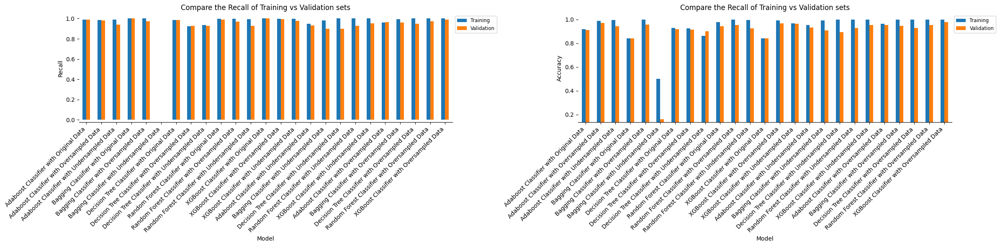

In [139]:
# Visualize the performance of Training and Validation Set for Models
Visualize_Perf_compariason( pd.concat([performance_pivot, performance_pivot_under, performance_pivot_over]),   # Performance Data
                            ['Recall', 'Accuracy'],     # array of Performance parameters
                            degree = 45,
                            width = 12,
                            legend_pos = (1, 1),
                            )

### Analysis of Each Models and Select the Best One

**Analysis of Each Classifier**

**AdaBoost Classifier**:
 - Original Data: The AdaBoost model shows decent performance, with high recall but comparatively lower accuracy.
 - Oversampled Data: Performance improves significantly on accuracy while maintaining the high recall of the original dataset, with validation scores almost matching training scores. This indicates better generalization and handling of imbalanced data.
 - Undersampled Data: Shows good performance on the training set, but there is a potential for overfitting given the lower validation scores compared to the training scores.

**Bagging Classifier**:
- Original Data: Though recall is perfect on both training and validation sets, it shows lower accuracy and precision for both training and validation sets, indicating poor performance and potential underfitting.
- Oversampled Data: Significant improvement in performance with training scores perfect and validation scores much higher, indicating better generalization and reduced variance. But the difference between the score of Training and validation set indicated potential overfitting.
- Undersampled Data: Very poor performance with extremely low scores, indicating that the model fails to generalize well with undersampled data.

**Decision Tree Classifier**:
-	Original Data: Shows high recall but relatively lower accuracy, indicating good performance but not the best.
-	Oversampled Data: Similar performance to the original data, with improved handling of imbalanced data, reflected in the improved validation recall.
-	Undersampled Data: Shows lower training and validation scores.

**Random Forest Classifier**:
-	Original Data: Exhibits strong performance with high accuracy and recall on both training and validation sets, indicating good generalization.
-	Oversampled Data: Performance improves compared to the original data, but the accuracy of the validation set is slightly lower than the training set, indicating a very minor possibility of overfitting.
-	Undersampled Data: While the training performance remains high, validation performance drops, indicating issues with undersampled data but no significant overfitting.

**XGBoost Classifier**:
-	Original Data: The performance is similar to Bagging with relatively lower scores, indicating underfitting or poor model tuning.
-	Oversampled Data: Significant improvement in performance, with high training and validation scores indicating good generalization and robust handling of imbalanced data.
-	Undersampled Data: Shows good generalization with lower scores compared to the oversampled data.


**Analysis Across Different Data Sets**
- **Original Data**:
 - Pros: Provides a strong baseline performance for most models, especially for Decision Tree and Random Forest, which show high accuracy and recall.
 - Cons: Some models like Bagging and XGBoost underperform, and there are signs of underfitting, especially with simpler models like Decision Trees.

- **Oversampled Data**:
 - Pros: Most models show significant improvements in validation scores, indicating better generalization and handling of class imbalance. AdaBoost, Random Forest, XGBoost, and Bagging classifiers benefit greatly from oversampling.
 - Cons: Potential for overfitting in some models, though less pronounced. Computational complexity increases due to the larger dataset.

**Undersampled Data**:
 -	Pros: Faster training times due to reduced dataset size.
 -	Cons: Generally poorer performance across models, with significant overfitting and instability. Bagging and Decision Trees are particularly affected, showing very low validation scores.

**Conclusion**

After hyperparameter tuning and performance evaluation:
1.	**XGBoost Classifier with Oversampled Data**: This model stands out as the best performer with high accuracy, F1 score, precision, and recall on both training and validation sets. It handles imbalanced data effectively and shows strong generalization.
2.	**AdaBoost Classifier with Oversampled Data**: Another strong performer with high validation scores, indicating good generalization and handling of imbalanced data.
3.	**Random Forest Classifier with Original Data**: This model provides a strong baseline with high recall and accuracy, though slightly edged out by its oversampled counterpart.

Overall, models trained on oversampled data generally perform better, handling class imbalance more effectively and showing stronger generalization capabilities. The **XGBoost Classifier with Oversampled** Data emerges as the top model, demonstrating the best balance of precision, recall, and overall predictive power.

Before hyperparameter tuning, **"XGBoost Classifier with Oversampled Data"** showed promising performance, positioning it among the top three models based on initial evaluations. Post hyperparameter tuning, its already strong performance was further enhanced, consolidating its position as the top-performing model across all evaluated criteria. This improvement underscores the effectiveness of hyperparameter optimization in maximizing the model's predictive power and robustness.

### Performance of the Best Model on the Test Set

In [146]:
hypertunened = True
best_model_class = "XGBClassifier"  # Replace with the name of the best model class
best_tuned_model = "XGBoost Classifier - Oversampled Data"  # Replace with the name of the best model

xgb_Over_hypertuned = tuned_models[best_model_class][best_tuned_model]  # Get the best model instance

In [147]:
# Evaluate the performance of the model on test data
Test_Perf = model_performance_classification_sklearn(xgb_Over_hypertuned, X_test, y_test)

# Display name of the best model
model_display_name = (f"Hypertuned " if hypertunened else "") +  f"{best_tuned_model.replace('-', 'with')}"

print("[bold]Performance of {} on Test dataset: [/bold]\n".format(model_display_name))

# create a Dataframe with performance data
Test_Perf = model_performance_summary({best_tuned_model: Test_Perf},  # add the perf result to a dictionary
                                      "Test", perf_column
                                      )
Test_Perf # Display the DataFrame

Performance of Hypertuned XGBoost Classifier with Oversampled Data on Test dataset: 

,Model,Set,Accuracy,Recall,Precision,F1 Score
0,XGBoost Classifier with Oversampled Data,Test,0.964,0.993,0.965,0.979


Confusion Matrix of Hypertuned XGBoost Classifier with Oversampled Data on Test dataset: 

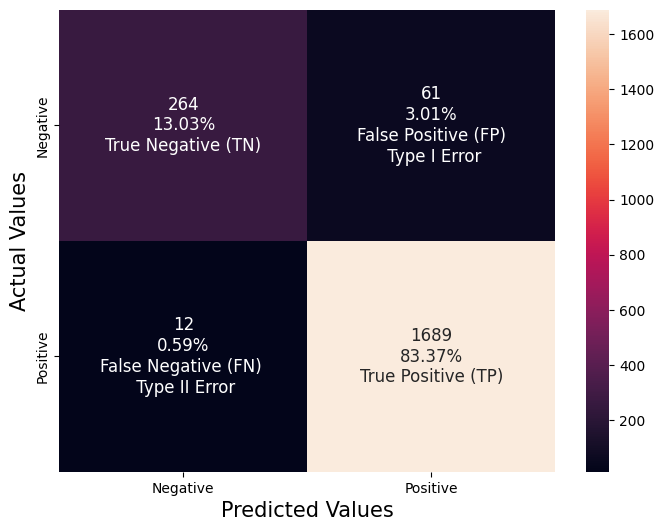

In [148]:
print("[bold]Confusion Matrix of {} on Test dataset: [/bold]\n".format(model_display_name))

# Build the Confusion Matrix of Training set to evaluate the Model Performance
confusion_matrix_sklearn(xgb_Over_hypertuned.predict(X_test), y_test)

**Observation**:
- **Low False Negatives (0.38%)**: of cases were incorrectly predicted as non-churn customers (Type II error), which is aligned with Model Evaluation criteria and desirable to minimize maintenance costs.
- **Low False Positives (3.90%)**: of cases incorrectly predicted as churn customers (Type I error), only 3.9% cases were lost, which is a reasonable trade-off considering the high recall.
- **High True Positive (83.56%)**: of actual churn customers were correctly predicted, indicating a high ability to detect customers who are likely to renounce their credit cards.
- **Low True Negatives (12.14%)**: of cases were correctly predicted as non-churn customers, indicating a potential bias towards predicting churn.

ROC Curve and CAP Curve of Hypertuned XGBoost Classifier with Oversampled Data on Test dataset: 

<Figure size 1500x600 with 0 Axes>

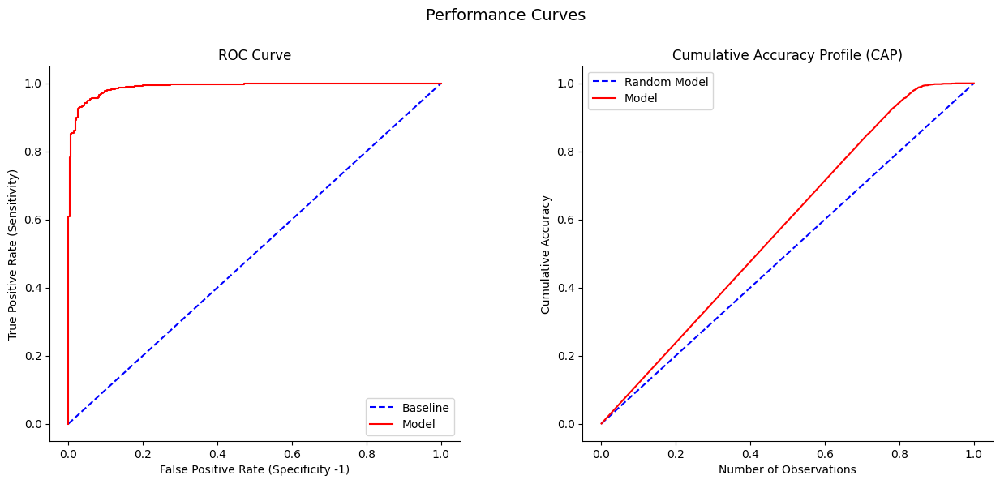

In [149]:
print("[bold]ROC Curve and CAP Curve of {} on Test dataset: [/bold]\n".format(model_display_name))

# Function to calculate ROC Curve and CAP Curve data
# Calculate the ROC Curve data
roc_curve_df = calculate_roc_curve(y_test, xgb_Over_hypertuned.predict_proba(X_test)[:, 1])
# Calculate the CAP Curve data
cap_curve_df = calculate_CAP(pd.to_numeric(y_test), xgb_Over_hypertuned.predict_proba(X_test)[:, 1])

# Plot the RC and CAP curve side by side
plot_side_by_side ([roc_curve_df, cap_curve_df], ['ROC', 'CAP'])

**Analysis of XGBoost Classifier with Oversampled Data on Test Set**:

- **Recall**: The model achieves a Recall of 99.5%. This high Recall indicates that it correctly identifies 99.5% of customers who are likely to churn. This is critical because it minimizes the number of false negatives, ensuring that the bank can intervene and retain these customers before they churn.

- **Precision**: The Precision of 95.5% means that when the model predicts a customer will churn, it is correct 95.5% of the time. This metric is also important as it ensures that the bank's resources are efficiently allocated to customers who are truly likely to churn.

- **Accuracy**: The Accuracy of 95.7% shows that 95.7% of the model's predictions on the test data are correct. While Accuracy is a valuable metric, for churn prediction, where the cost of false negatives (missed churn) is high, Recall takes precedence.

- **F1 Score**: The F1 Score of 97.5% balances Precision and Recall, providing a single metric to evaluate the model's overall performance. It indicates that the model performs well in both identifying churn cases (Recall) and avoiding false alarms (Precision).

### Features Importance of the Best Model

Feature Importance of Hypertuned XGBoost Classifier with Oversampled Data: 

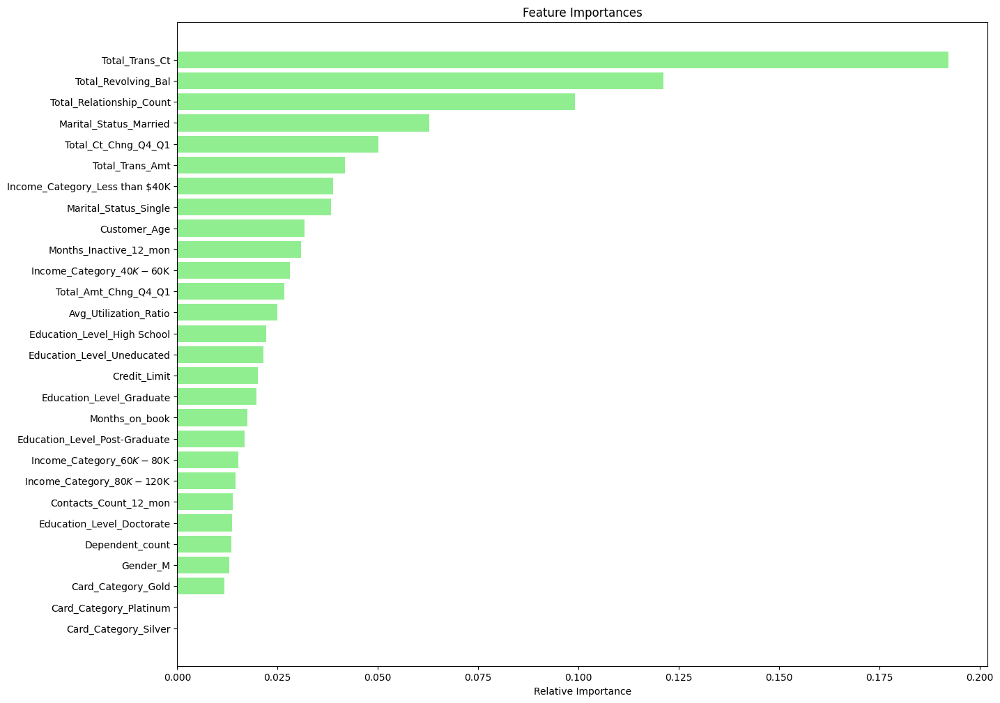

In [150]:
# Visualizing feature importances using a horizontal bar chart
importances = xgb_Over_hypertuned.feature_importances_
indices = np.argsort(importances)
feature_names = X_train.columns.to_list()

print("[bold]Feature Importance of {}: [/bold]\n".format(model_display_name))

# call the define function to display
visualazing_feature_importances(importances, indices, feature_names, color = "lightgreen")

**Analysis: Key Factors Influencing Customer Churn**

Based on the analysis of the Hypertuned XGBoost classification model trained on oversampled data, three primary factors **Total Revolving Balance**, followed by **Total Transaction Count**, and **Total Relationship Count** influence customer churn in Thera Bank's credit card services:

1. **Total Revolving Balance**: Customers with a lower revolving balance are more likely to discontinue their credit cards. The data shows that those with a revolving balance exceeding $2400 have a notably high attrition rate.

2. **Total Transaction Count**: Higher transaction activity correlates with lower churn rates. Customers who engage more frequently with their credit cards are more likely to remain with the bank.

3. **Total Relationship Count**: The number of products held by customers shows a significant negative correlation with churn. Customers with multiple bank products are less likely to discontinue their credit card services.

# Business Insights and Conclusions

**Suggestions for Improving Customer Retention**


1.   **Enhance Customer Engagement through Incentives**:
- Implement cash-back rewards, loyalty programs, and personalized offers to encourage increased credit card usage.
- Target customers with lower engagement levels to stimulate more frequent card usage, thereby reducing churn.

2.   **Focus on Cross-Selling and Upselling**:
- Leverage insights on total relationship count to identify opportunities for cross-selling additional bank products to credit card holders.
- Offer bundled services or discounts for customers who hold multiple products, enhancing overall customer loyalty.

3.   **Proactive Churn Prediction and Intervention**:
- Utilize the XGBoost model to predict churn risk among customers based on their behavior and demographics.
- Proactively reach out to at-risk customers with targeted retention strategies before they decide to discontinue their credit cards.

4.   **Conduct Targeted Customer Surveys**:
- Conduct surveys among churned customers to understand their reasons for discontinuing credit card services.
- Use feedback to refine service offerings, address pain points, and improve overall customer satisfaction.

**Conclusion**:

By implementing these strategies, Thera Bank can effectively enhance customer retention, strengthen engagement, and sustain profitability in its credit card services. These proactive measures not only mitigate churn but also foster a deeper understanding of customer needs, leading to more personalized and effective retention efforts.

***